# House Prices - Kaggle Copetitions
## Preparing environment and uploading data
### Import Packages

In [1]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
import pylab 
from scipy.stats import skew, norm, probplot, boxcox
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
# from scipy.stats.stats import pearsonr
#from scipy.special import boxcox1p
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
from matplotlib import pyplot as plt
%matplotlib inline
import mpl_toolkits
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler
from sklearn.feature_extraction import FeatureHasher
# from sklearn.preprocessing import Imputer
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.linear_model import LinearRegression, OrthogonalMatchingPursuit, Lasso, ElasticNet, BayesianRidge, HuberRegressor
from sklearn.linear_model import ARDRegression, SGDRegressor, PassiveAggressiveRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, BaggingRegressor
# from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# from sklearn.linear_model import RANSACRegressor, import TheilSenRegressor

from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping

#pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points

Using TensorFlow backend.


### Load Datastes
I start with a data types dict, since pandas read_cvs make some mistakes on the data types definitions.
Futhermore, the pandas read_csv has the inconvinent of didn´t read data that has integer columns with nan (nulls). So I firts read the columns BsmtFullBath, BsmtHalfBath, GarageYrBlt and GarageCars as np.float32, and after had treated theirs nulls I make the coerce to np.int32.

In [2]:
dcols = {'Id': np.int64, 'MSSubClass': np.int64, 'MSZoning': np.object, 'LotFrontage': np.float64, 'LotArea': np.float64,
         'Street': np.object, 'Alley': np.object, 'LotShape': np.object, 'LandContour': np.object, 'Utilities': np.object,
         'LotConfig': np.object, 'LandSlope': np.object, 'Neighborhood': np.object, 'Condition1': np.object,
         'Condition2': np.object, 'BldgType': np.object, 'HouseStyle': np.object, 'OverallQual': np.int64,
         'OverallCond': np.int64, 'YearBuilt': np.int64, 'YearRemodAdd': np.int64, 'RoofStyle': np.object, 'RoofMatl': np.object,
         'Exterior1st': np.object, 'Exterior2nd': np.object, 'MasVnrType': np.object, 'MasVnrArea': np.float64,
         'ExterQual': np.object, 'ExterCond': np.object, 'Foundation': np.object, 'BsmtQual': np.object, 'BsmtCond': np.object,
         'BsmtExposure': np.object, 'BsmtFinType1': np.object, 'BsmtFinSF1': np.float64, 'BsmtFinType2': np.object,
         'BsmtFinSF2': np.float64, 'BsmtUnfSF': np.float64, 'TotalBsmtSF': np.float64, 'Heating': np.object,
         'HeatingQC': np.object, 'CentralAir': np.object, 'Electrical': np.object, '1stFlrSF': np.float64, '2ndFlrSF': np.float64,
         'LowQualFinSF': np.float64, 'GrLivArea': np.float64, 'BsmtFullBath': np.float64, 'BsmtHalfBath': np.float64,
         'FullBath': np.int64, 'HalfBath': np.int64, 'BedroomAbvGr': np.int64, 'KitchenAbvGr': np.int64, 'KitchenQual': np.object,
         'TotRmsAbvGrd': np.int64, 'Functional': np.object, 'Fireplaces': np.int64, 'FireplaceQu': np.object, 
         'GarageType': np.object, 'GarageYrBlt': np.float64, 'GarageFinish': np.object, 'GarageCars': np.float64, 
         'GarageArea': np.float64, 'GarageQual': np.object, 'GarageCond': np.object, 'PavedDrive': np.object, 
         'WoodDeckSF': np.float64, 'OpenPorchSF': np.float64, 'EnclosedPorch': np.float64, 'TSsnPorch': np.float64, 
         'ScreenPorch': np.float64, 'PoolArea': np.float64, 'PoolQC': np.object, 'Fence': np.object, 'MiscFeature': np.object, 
         'MiscVal': np.float64, 'MoSold': np.int64, 'YrSold': np.int64, 'SaleType': np.object, 'SaleCondition': np.object, 
         'SalePrice': np.float64}

data = pd.read_csv('../house/train.csv', dtype=dcols)
#data.drop(['Id'], axis=1, inplace=True)

test = pd.read_csv('../house/test.csv', dtype=dcols)
test['SalePrice'] = 0
Test_ID = test.Id
#test.drop(['Id'], axis=1, inplace=True)

In [3]:
all_data = data.append(test)

city = pd.read_csv('../house/Ames_Real_Estate_Data.txt', sep='\t', lineterminator='\r')
pid   = pd.read_csv('../house/AmesHousing.txt', sep='\t', lineterminator='\r')
merge = pd.merge(pid, city, how='left', left_on=['PID'], right_on=['GeoRefNo'])
del pid, city

inter_data = merge[['MS Zoning', 'Lot Area', 'Mo Sold', 'Overall Qual', 'Overall Cond', 'Bsmt Exposure',  'Sale Condition', 
       'Yr Sold', 'YrBuilt', 'Neighborhood_x', 'Gr Liv Area' , 'PID', 'ClassPr_S', 'ClassSc_S', 'TxD_S', 'MA_City', 
       'MA_State', 'MA_Zip1', 'TtlVal_AsrYr', 'ValType']]

inter_data.columns = ['MSZoning', 'LotArea', 'MoSold',  'OverallQual' , 'OverallCond', 'BsmtExposure', 'SaleCondition',
                      'YrSold', 'YearBuilt', 'Neighborhood', 'GrLivArea', 'PID', 'ClassPr_S', 'ClassSc_S', 'TxD_S', 
                      'MA_City', 'MA_State', 'MA_Zip1',  'TtlVal_AsrYr', 'ValType']

Max_PID = inter_data.\
            groupby(['MSZoning', 'LotArea', 'MoSold',  'OverallQual' , 'OverallCond', 'BsmtExposure', 'SaleCondition',
                    'YrSold', 'YearBuilt', 'Neighborhood', 'GrLivArea'], as_index=False).max()

inter_data = pd.merge(Max_PID, inter_data)

all_data = pd.merge(all_data, inter_data, how='left' )

data = all_data[(all_data.SalePrice>0)].drop_duplicates()
test = all_data[(all_data.SalePrice==0)].drop_duplicates()

del inter_data, Max_PID#, all_data

In [4]:
all_data = data.append(test)

display(all_data.MA_Zip1.value_counts()[all_data.MA_Zip1.value_counts()>5])
zip_data = city = pd.read_csv('../house/ACS_16_5YR_DP03_with_ann.csv', skiprows=1)

poverty = zip_data.loc[:, [ 'Id2',
  'Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - All people']]
poverty.columns = ['MA_Zip1', 'PovertyRate']
poverty.PovertyRate = poverty.PovertyRate.str.replace('-', '-1')
poverty.PovertyRate = poverty.PovertyRate.astype(np.float32)


all_data = pd.merge(all_data, poverty, how='left')

del zip_data, poverty
all_data.drop('MA_Zip1', axis=1, inplace=True)

50010.0    1683
50014.0     906
50021.0       7
Name: MA_Zip1, dtype: int64

In [5]:
display(all_data.MA_City.value_counts()[all_data.MA_City.value_counts()>2])
all_data.MA_City = all_data.MA_City.apply(lambda x: x if x=='AMES' else 'others')

AMES                  2589
ANKENY                  10
IOWA CITY                7
DES MOINES               5
STATE COLLEGE            5
URBANDALE                5
CARROLL                  5
CLIVE                    5
WEST DES MOINES          5
GRIMES                   4
BOONE                    4
SPENCER                  4
POLK CITY                4
CAMBRIDGE                3
NEVADA                   3
GREEN COVE SPRINGS       3
STORY CITY               3
JOHNSTON                 3
BONDURANT                3
Name: MA_City, dtype: int64

In [6]:
display(all_data.MA_State.value_counts()[all_data.MA_State.value_counts()>2])
all_data.MA_State = all_data.MA_State.apply(lambda x: x if x=='IA' else 'others')

IA    2741
IL       8
MN       7
CA       7
PA       7
FL       5
CO       3
Name: MA_State, dtype: int64

In [7]:
display(all_data.ClassSc_S.value_counts()[all_data.ClassSc_S.value_counts()>2])
others = ['1-STORY W/FINISHED ATTIC ALL AGES', 'MISC. CHARITABLE', 
          '1-1/2 STORY TWNHM - ALL AGES', 'RELIGIOUS - RESIDENCE - PARSONAGE']
all_data.ClassSc_S = all_data.ClassSc_S.apply(lambda x: 'others' if x in others else x)

data = all_data[(all_data.SalePrice>0)].drop_duplicates()
test = all_data[(all_data.SalePrice==0)].drop_duplicates()

1-STORY 1946 & NEWER ALL STYLES              1035
2-STORY 1946 & NEWER                          566
1-1/2 STORY FINISHED ALL AGES                 288
1-STORY TWNHM - 1946 & NEWER                  187
2-STORY TWNHM - 1946 & NEWER                  126
2-STORY 1945 & OLDER                          125
1-STORY 1945 & OLDER                          125
SPLIT OR MULTI-LEVEL                          118
DUPLEX - ALL STYLES AND AGES                   82
SPLIT FOYER                                    47
2 FAMILY CONVERSION - ALL STYLES AND AGES      39
2-1/2 STORY ALL AGES                           26
1-1/2 STORY - UNFINISHED ALL AGES              19
MULTILEVEL TWNHM  - INCL SPLIT LEV/FOYER       17
Name: ClassSc_S, dtype: int64

## 2. Exploratory Data Analysis (EDA)
### Take a First Look of our Data:
I created the function below to simplify the analysis of general characteristics of the data. Inspired on the str function of R, this function returns the types, counts, distinct, count nulls, missing ratio and uniques values of each field/feature.

If the study involve some supervised learning, this function can return the study of the correlation, for this we just need provide the independent variable to the pred parameter.

Also, if your return is stored in a variable you can evaluate it in more detail, specific of a field, or sort them from different perspectives

In [8]:
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: [x.unique()])
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ration = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing ration', 'uniques', 'skewness', 'kurtosis']
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ration', 'uniques', 'skewness', 'kurtosis', corr_col ]
    
    str.columns = cols
    dtypes = str.types.value_counts()
    print('___________________________\nData types:\n',str.types.value_counts())
    print('___________________________')
    return str

In [9]:
details = rstr(data, 'SalePrice')
display(details.sort_values(by='corr SalePrice', ascending=False))

Data shape: (1460, 90)
___________________________
Data types:
 object     48
float64    27
int64      14
float32     1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr SalePrice
SalePrice,float64,1460,663,0,0.000000,"[[208500.0, 181500.0, 223500.0, 140000.0, 2500...",1.882876,6.536282,1.000000
TtlVal_AsrYr,float64,1405,1089,55,3.767123,"[[255000.0, 248200.0, 266900.0, 208200.0, 3502...",2.261217,13.798971,0.884285
OverallQual,int64,1460,10,0,0.000000,"[[7, 6, 8, 5, 9, 4, 10, 3, 1, 2]]",0.216944,0.096293,0.790982
GrLivArea,float64,1460,861,0,0.000000,"[[1710.0, 1262.0, 1786.0, 1717.0, 2198.0, 1362...",1.366560,4.895121,0.708624
GarageCars,float64,1460,5,0,0.000000,"[[2.0, 3.0, 1.0, 0.0, 4.0]]",-0.342549,0.220998,0.640409
GarageArea,float64,1460,441,0,0.000000,"[[548.0, 460.0, 608.0, 642.0, 836.0, 480.0, 63...",0.179981,0.917067,0.623431
TotalBsmtSF,float64,1460,721,0,0.000000,"[[856.0, 1262.0, 920.0, 756.0, 1145.0, 796.0, ...",1.524255,13.250483,0.613581
1stFlrSF,float64,1460,753,0,0.000000,"[[856.0, 1262.0, 920.0, 961.0, 1145.0, 796.0, ...",1.376757,5.745841,0.605852
FullBath,int64,1460,4,0,0.000000,"[[2, 1, 3, 0]]",0.036562,-0.857043,0.560664
TotRmsAbvGrd,int64,1460,12,0,0.000000,"[[8, 6, 7, 9, 5, 11, 4, 10, 12, 3, 2, 14]]",0.676341,0.880762,0.533723


In [10]:
add_details = rstr(data[['ClassPr_S', 'ClassSc_S', 'TxD_S', 'MA_City', 'MA_State', 
                         'TtlVal_AsrYr', 'ValType', 'SalePrice']], 'SalePrice')
display(add_details.sort_values(by='corr SalePrice', ascending=False))

Data shape: (1460, 8)
___________________________
Data types:
 object     5
float64    3
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr SalePrice
SalePrice,float64,1460,663,0,0.000000,"[[208500.0, 181500.0, 223500.0, 140000.0, 2500...",1.882876,6.536282,1.000000
TtlVal_AsrYr,float64,1405,1089,55,3.767123,"[[255000.0, 248200.0, 266900.0, 208200.0, 3502...",2.261217,13.798971,0.884285
TxD_S,float64,1405,3,55,3.767123,"[[1.0, 45.0, nan]]",2.091800,2.379010,0.366154
ClassPr_S,object,1405,3,55,3.767123,"[[RESIDENTIAL, nan, EXEMPT]]",NaN,NaN,NaN
ClassSc_S,object,1405,16,55,3.767123,"[[2-STORY 1946 & NEWER, 1-STORY 1946 & NEWER A...",NaN,NaN,NaN
MA_City,object,1460,2,0,0.000000,"[[AMES, others]]",NaN,NaN,NaN
MA_State,object,1460,2,0,0.000000,"[[IA, others]]",NaN,NaN,NaN
ValType,object,1405,6,55,3.767123,"[[F, nan, B, P, A, I]]",NaN,NaN,NaN


### Some Observations from the STR Details:
- For know the descriptions of each data click [here](data_description.txt).
- Independent variabel, **SalePrice**, are ***skewed*** and ***heavy-tailed distribution***. We need investigate its distribution with a plot and check if a **transformation by Log 1P** could correct it, withou drop most of the **outiliers**.
<p>
 
- Nulls: The data have 19 features with nulls, five of then area categorical and with more then 47% of missing ration. They are candidates to drop or use them to create another more interesting feature:
 - PoolQC
 - MiscFeature
 - Alley
 - Fence
 - FireplaceQu

<p>
    
- Features ***high skewed right***, ***heavy-tailed distribution***, and with ***high correlation*** to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
 - TotalBsmtSF
 - 1stFlrSF
 - GrLivArea

<p>
    
- Features ***skewed***, ***heavy-tailed distribution***, and with ***good correlation*** to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
 - LotArea
 - KitchenAbvGr
 - ScreenPorch
 - EnclosedPorch
 - MasVnrArea
 - OpenPorchSF
 - LotFrontage
 - BsmtFinSF1
 - WoodDeckSF
 - MSSubClass

<p>
    
- Features ***high skewed***, ***heavy-tailed distribution***, and with ***low correlation*** to Sales Price. Maybe we can drop these features, or just use they with other to create a new more importants feature:
 - MiscVal
 - TSsnPorch
 - LowQualFinSF
 - BsmtFinSF2
 - BsmtHalfBa

<p>
    
- Features ***low skewed***, and with ***good to low correlation*** to Sales Price. Just use a Robustscaler probably reduce the few  distorcions:
 - BsmtUnfSF
 - 2ndFlrSF
 - TotRmsAbvGrd
 - HalfBath
 - Fireplaces
 - BsmtFullBath
 - OverallQual
 - BedroomAbvGr
 - GarageArea
 - FullBath
 - GarageCars
 - OverallCond

<p>
    
- Transforme from Yaer Feature to Age, 2011 - Year feature, or YEAR(TODAY()) - Year Feature
 - YearRemodAdd: 
 - YearBuilt
 - GarageYrBlt
 - YrSold

When we apply this data to a Keras, we need to chnage the float64 and Int64 to float32 and Int32!

### First see of some stats of Numeric Data
So, for the main statistics of our numeric data describe the function (like the summary of R)

In [11]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,7.305000e+02,4.216100e+02,1.0,3.657500e+02,730.5,1.095250e+03,1.460000e+03
MSSubClass,1460.0,5.689726e+01,4.230057e+01,20.0,2.000000e+01,50.0,7.000000e+01,1.900000e+02
LotFrontage,1201.0,7.004996e+01,2.428475e+01,21.0,5.900000e+01,69.0,8.000000e+01,3.130000e+02
LotArea,1460.0,1.051683e+04,9.981265e+03,1300.0,7.553500e+03,9478.5,1.160150e+04,2.152450e+05
OverallQual,1460.0,6.099315e+00,1.382997e+00,1.0,5.000000e+00,6.0,7.000000e+00,1.000000e+01
OverallCond,1460.0,5.575342e+00,1.112799e+00,1.0,5.000000e+00,5.0,6.000000e+00,9.000000e+00
YearBuilt,1460.0,1.971268e+03,3.020290e+01,1872.0,1.954000e+03,1973.0,2.000000e+03,2.010000e+03
YearRemodAdd,1460.0,1.984866e+03,2.064541e+01,1950.0,1.967000e+03,1994.0,2.004000e+03,2.010000e+03
MasVnrArea,1452.0,1.036853e+02,1.810662e+02,0.0,0.000000e+00,0.0,1.660000e+02,1.600000e+03
BsmtFinSF1,1460.0,4.436397e+02,4.560981e+02,0.0,0.000000e+00,383.5,7.122500e+02,5.644000e+03


### Overall Quality

Overall Quality has the highest correlation with SalePrice among the numeric variables (0.79). It rates the overall material and finish of the house on a scale from 1 (very poor) to 10 (very excellent). The positive correlation is certainly there indeed, and seems to be a slightly upward curve. Regarding outliers, I do not see any extreme values. If there is a candidate to take out as an outlier later on, it seems to be the expensive house with grade 4.

Especially the two houses with really big living areas and low SalePrices seem outliers. I will not take them out yet, as taking outliers can be dangerous. For instance, a low score on the Overall Quality could explain a low price. However, as you can see below, these two houses actually also score maximum points on Overall Quality. Therefore, I will keep theses houses in mind as prime candidates to take out as outliers.

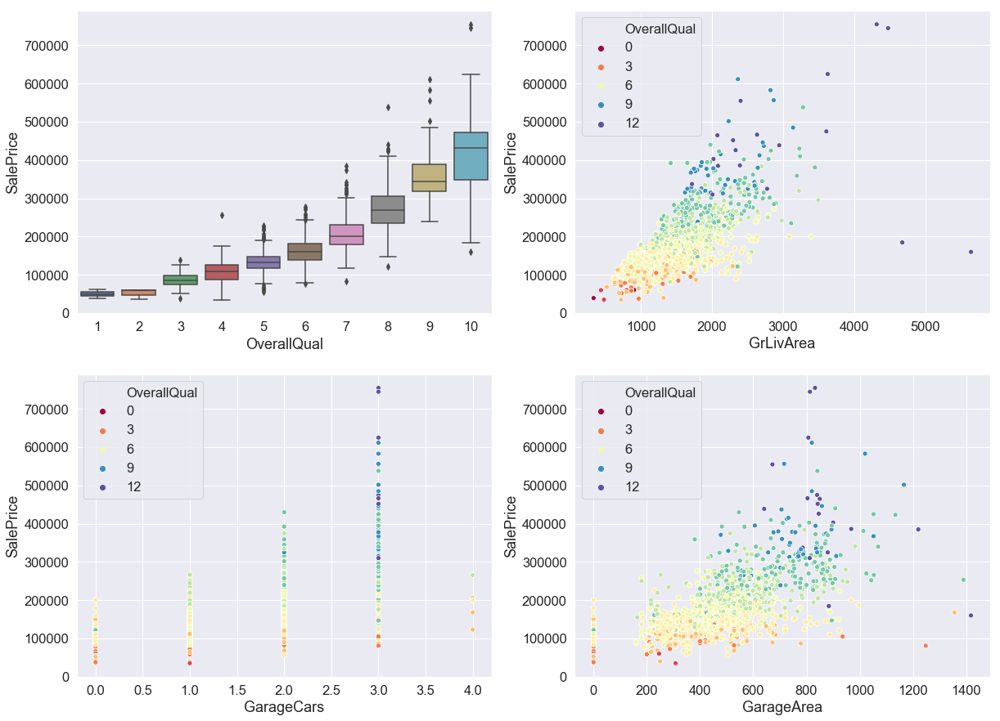

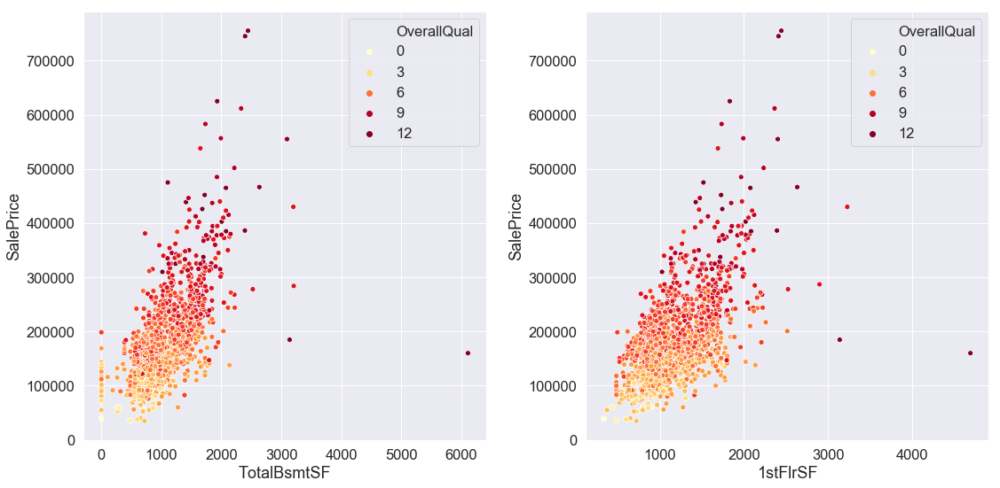

In [12]:
fig = plt.figure(figsize=(20, 15))
sns.set(font_scale=1.5)

# (Corr= 0.817185) Box plot overallqual/salePrice
fig1 = fig.add_subplot(221); sns.boxplot(x='OverallQual', y='SalePrice', data=data[['SalePrice', 'OverallQual']])

# (Corr= 0.700927) GrLivArea vs SalePrice plot
fig2 = fig.add_subplot(222); sns.scatterplot(x = data.GrLivArea, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

# (Corr= 0.680625) GarageCars vs SalePrice plot
fig3 = fig.add_subplot(223); sns.scatterplot(x = data.GarageCars, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

# (Corr= 0.650888) GarageArea vs SalePrice plot
fig4 = fig.add_subplot(224); sns.scatterplot(x = data.GarageArea, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

fig5 = plt.figure(figsize=(16, 8))
fig6 = fig5.add_subplot(121); sns.scatterplot(y = data.SalePrice , x = data.TotalBsmtSF, hue=data.OverallQual, palette= 'YlOrRd')

fig7 = fig5.add_subplot(122); sns.scatterplot(y = data.SalePrice, x = data['1stFlrSF'], hue=data.OverallQual, palette= 'YlOrRd')

plt.tight_layout(); plt.show()

#### Total Rooms above Ground and Living Area

                                                                  Outliers: 3


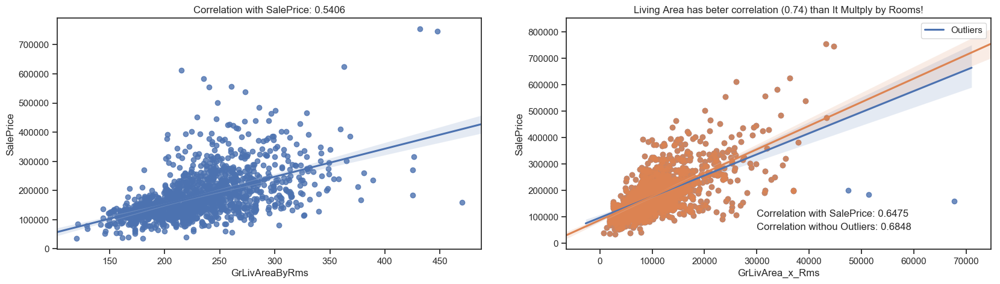

In [13]:
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)

df = data[['SalePrice', 'GrLivArea', 'TotRmsAbvGrd']]
df['GrLivAreaByRms'] = data.GrLivArea/data.TotRmsAbvGrd
df['GrLivArea_x_Rms'] = data.GrLivArea*data.TotRmsAbvGrd
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GrLivAreaByRms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GrLivAreaByRms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=30000, y=100000, s='Correlation with SalePrice: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))

print('                                                                  Outliers:',(df.GrLivArea_x_Rms>=45000).sum())
df = df.loc[df.GrLivArea_x_Rms<45000]
sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); 
plt.title('Living Area has beter correlation ({:1.2f}) than It Multply by Rooms!'.format(df.GrLivArea.corr(df.SalePrice)))
plt.text(x=30000, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))
plt.show()
del df

As we can see, the interaction between the two features did not present a better correlation than that already seen in the living area, include it improves to 0.74 with the cut of the outliers.

On the other hand, the ***multiplication*** not only demonstrated the living area **outliers** already identified, but it still **emphasized another**. If the strategy is to ***drop the TotRmsAbvGrd***, we should also ***exclude this additional outlier***.

In [14]:
data = data[data.GrLivArea * data.TotRmsAbvGrd < 45000]
data.shape

(1457, 90)

#### Garage areas and parking

From the boxplot below, we can note that more than 3 parking cars and more than 900 of area are outliers, since a few number of their observations. Although there is a relationship between them, most likely with a smaller number of parking spaces, there may be more garage area for other purposes, reason why the correlation between them is 0.88 and not 1.

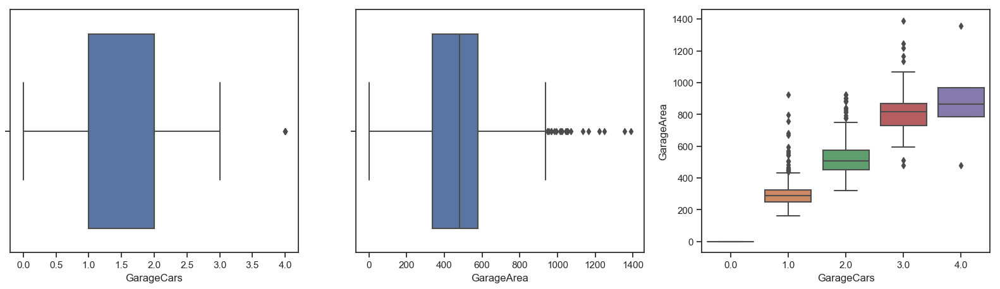

In [15]:
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(131); sns.boxplot(data.GarageCars)
fig2 = fig.add_subplot(132); sns.boxplot(data.GarageArea)
fig3 = fig.add_subplot(133); sns.boxplot(data.GarageCars, data.GarageArea)
plt.show()

                                                                 Outliers: 4


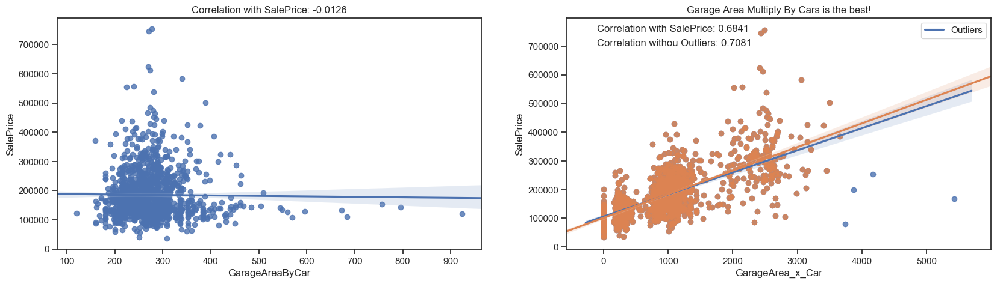

In [16]:
df = data[['SalePrice', 'GarageArea', 'GarageCars']]
df['GarageAreaByCar'] = data.GarageArea/data.GarageCars
df['GarageArea_x_Car'] = data.GarageArea*data.GarageCars

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GarageAreaByCar', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageAreaByCar.corr(df['SalePrice'])))

fig2 = fig.add_subplot(122); sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=-100, y=750000, s='Correlation with SalePrice: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.GarageArea_x_Car>=3700).sum())
df = df.loc[df.GarageArea_x_Car<3700]
sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.title('Garage Area Multiply By Cars is the best!')
plt.text(x=-100, y=700000, s='Correlation withou Outliers: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
plt.show()
del df

As can be seen the area by car is little useful, but contrary to common sense the multiplication of the area by the number of vacancies yes is. In the division we lose the magnitude and we have to maintain one or another functionality to recover it. With the multiplication we solve the problem of 1 parking space of 10 square feet against another of 10 with 1 square feet each. We could still ***improve the correlation*** by **0.06**, already considering the exclusion of only 4 outliers. 

The identification of the outliers was facilitated, note that before we would have a greater number of outliers, since the respective of each features alone are not conhencidentes.

So let's continue with the multiplication strategy, remove the two original metrics that have high correlation with each other, and exclude the 4 outliers from the training base.

In [17]:
data = data[data.GarageArea * data.GarageCars < 3700]
data.shape

(1453, 90)

#### Total Basement Area Vs 1st Flor Area

                                                             Outliers: 1


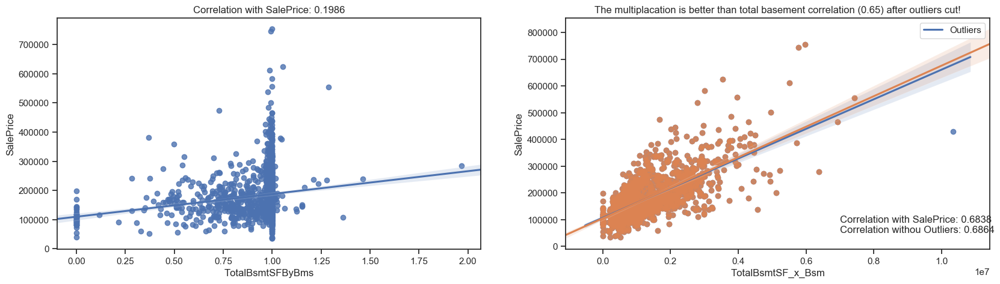

In [18]:
df = data[['SalePrice', 'TotalBsmtSF', '1stFlrSF']]
df['TotalBsmtSFByBms'] = data.TotalBsmtSF/data['1stFlrSF']
df['TotalBsmtSF_x_Bsm'] = data.TotalBsmtSF*data['1stFlrSF']
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='TotalBsmtSFByBms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalBsmtSFByBms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=7e06, y=90000, s='Correlation with SalePrice: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))

print('                                                             Outliers:',(df.TotalBsmtSF_x_Bsm>=0.9e07).sum())
df = df.loc[df.TotalBsmtSF_x_Bsm<0.9e07]
sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); 
plt.title('The multiplacation is better than total basement correlation ({:1.2f}) after outliers cut!'.format(df.TotalBsmtSF.corr(df.SalePrice)))
plt.text(x=7e06, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))
plt.show()
del df

Similar to what we saw in the garage analysis, we again have a better correlation by multiplying the variables, but now we don't have a significant gain with outlier exclusion. So let's continue with the multiplication strategy and remove only the two original metrics that have high correlation with each other.

#### Year Built Vs Garage Year Built
From the graphs below, we confirm that this two features are highly correlated, but as expect is not easy to find a good substitute by iteration.

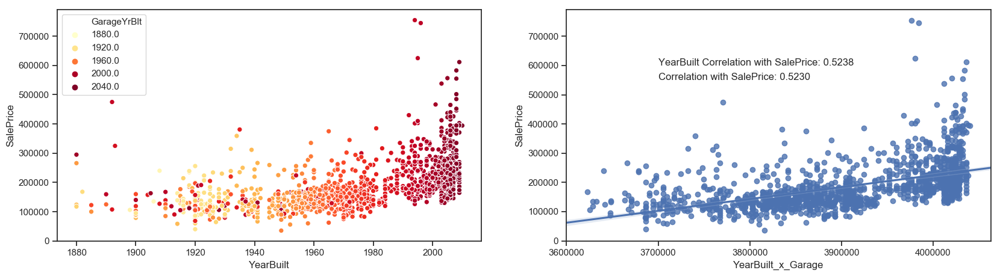

In [19]:
df = data[['SalePrice', 'YearBuilt', 'GarageYrBlt']]
df['YearBuilt_x_Garage'] = data.YearBuilt*data.GarageYrBlt
df['Garage_Newest'] = data.YearBuilt < data.GarageYrBlt

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.scatterplot(y = data.SalePrice, x = data.YearBuilt, hue=data.GarageYrBlt, palette= 'YlOrRd')
fig2 = fig.add_subplot(122); sns.regplot(x='YearBuilt_x_Garage', y='SalePrice', data=df); 
plt.text(x=3700000, y=600000, s='YearBuilt Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt.corr(df['SalePrice'])))
plt.text(x=3700000, y=550000, s='Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt_x_Garage.corr(df['SalePrice'])))
plt.show()

However, by making the year of construction of the garage an indicator of whether it is newer, it becomes easiest to identify a pattern of separation. But note that although we have a rising price due to the lower age.

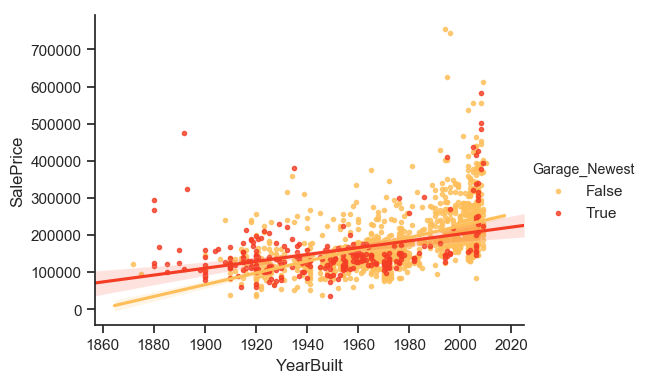

In [20]:
sns.lmplot(y = 'SalePrice', x = 'YearBuilt', data=df, markers='.', aspect=1.4, height=4, hue= 'Garage_Newest', palette= 'YlOrRd')
plt.show();  
del df

But note that although we have a rising price the newer the house, the growth rate is very smooth, even with the rate gain with a newer garage. This makes sense, given that the prices of these regressors are meeting with the mean price of each year.

#### Bathrooms Features
There are 4 bathroom variables. FullBath has the largest correlation with SalePrice between than. The others individually, these features are not very important. 

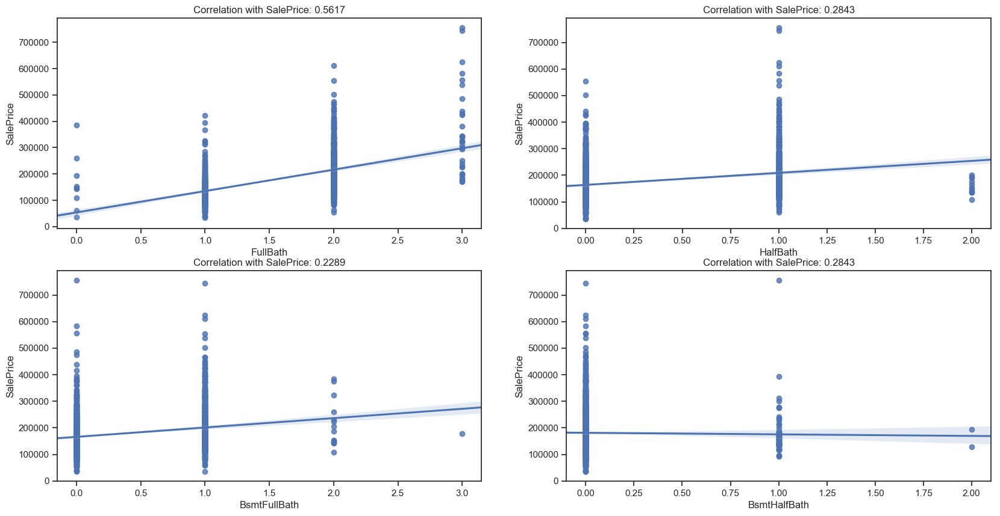

In [21]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(221); sns.regplot(x='FullBath', y='SalePrice', data=data)
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.FullBath.corr(data['SalePrice'])))

fig2 = fig.add_subplot(222); sns.regplot(x='HalfBath', y='SalePrice', data=data);
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.HalfBath.corr(data['SalePrice'])))

fig3 = fig.add_subplot(223); sns.regplot(x='BsmtFullBath', y='SalePrice', data=data)
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.BsmtFullBath.corr(data['SalePrice'])))

fig4 = fig.add_subplot(224); sns.regplot(x='BsmtHalfBath', y='SalePrice', data=data);
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.HalfBath.corr(data['SalePrice'])))

plt.show()

However, I assume that I if I add them up into one predictor, this predictor is likely to become a strong one. A half-bath, also known as a powder room or guest bath, has only two of the four main bathroom components-typically a toilet and sink. Consequently, I will also count the half bathrooms as half.

In [22]:
df = data[['SalePrice', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']]
df['TotBathrooms'] = df.FullBath + (df.HalfBath*0.5) + df.BsmtFullBath + (df.BsmtHalfBath*0.5)

                                                                 Outliers: 2


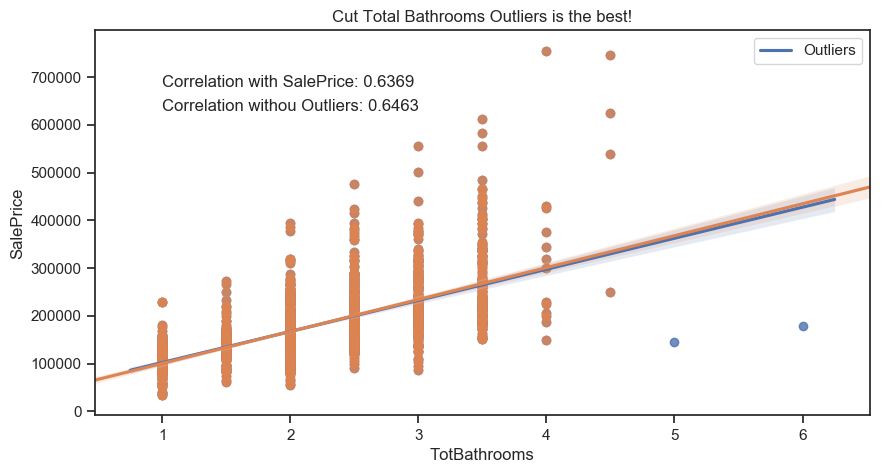

In [23]:
fig = plt.figure(figsize=(10,5))
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=1, y=680000, s='Correlation with SalePrice: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.TotBathrooms>=5).sum())
df = df.loc[df.TotBathrooms<5]
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.title('Cut Total Bathrooms Outliers is the best!')
plt.text(x=1, y=630000, s='Correlation withou Outliers: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
plt.show()

So, with our best predictor, we can cut only two outliers, use it and substitute all others bath features with a existence indicator.

In [24]:
data = data[(data.FullBath + (data.HalfBath*0.5) + data.BsmtFullBath + (data.BsmtHalfBath*0.5))<5]

### Reviwe Porsh Features:

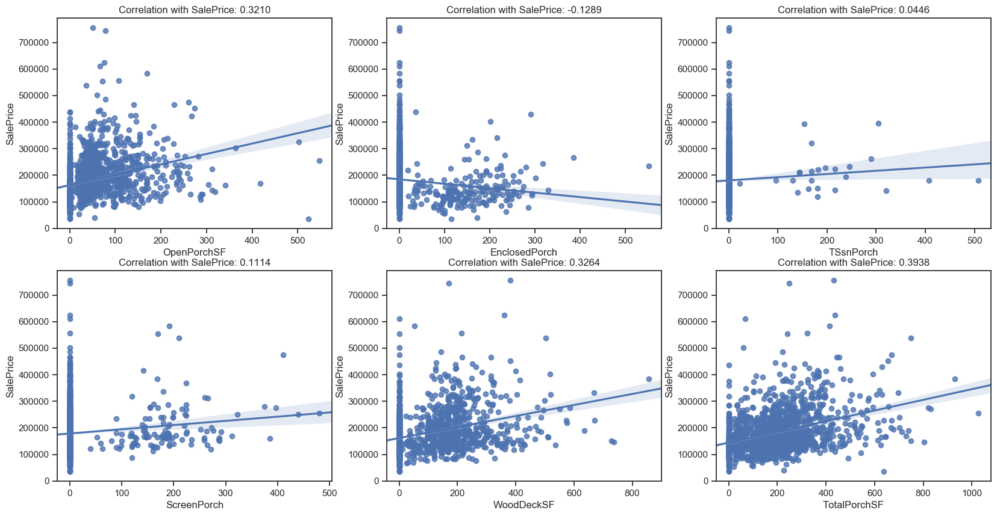

In [25]:
def PorshPlots():
    fig = plt.figure(figsize=(20,10))
    fig1 = fig.add_subplot(231); sns.regplot(x='OpenPorchSF', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OpenPorchSF.corr(df['SalePrice'])))

    fig2 = fig.add_subplot(232); sns.regplot(x='EnclosedPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.EnclosedPorch.corr(df['SalePrice'])))

    fig3 = fig.add_subplot(233); sns.regplot(x='TSsnPorch', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TSsnPorch.corr(df['SalePrice'])))

    fig4 = fig.add_subplot(234); sns.regplot(x='ScreenPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ScreenPorch.corr(df['SalePrice'])))

    fig5 = fig.add_subplot(235); sns.regplot(x='WoodDeckSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.WoodDeckSF.corr(df['SalePrice'])))

    fig6 = fig.add_subplot(236); sns.regplot(x='TotalPorchSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPorchSF.corr(df['SalePrice'])))

    plt.show()

df = data[['SalePrice', 'OpenPorchSF', 'EnclosedPorch', 'TSsnPorch', 'ScreenPorch', 'WoodDeckSF']]
df['TotalPorchSF'] = df.OpenPorchSF + df.EnclosedPorch + df.TSsnPorch + df.ScreenPorch + df.WoodDeckSF
#df = df[df.TotalPorchSF<=600]
PorshPlots()

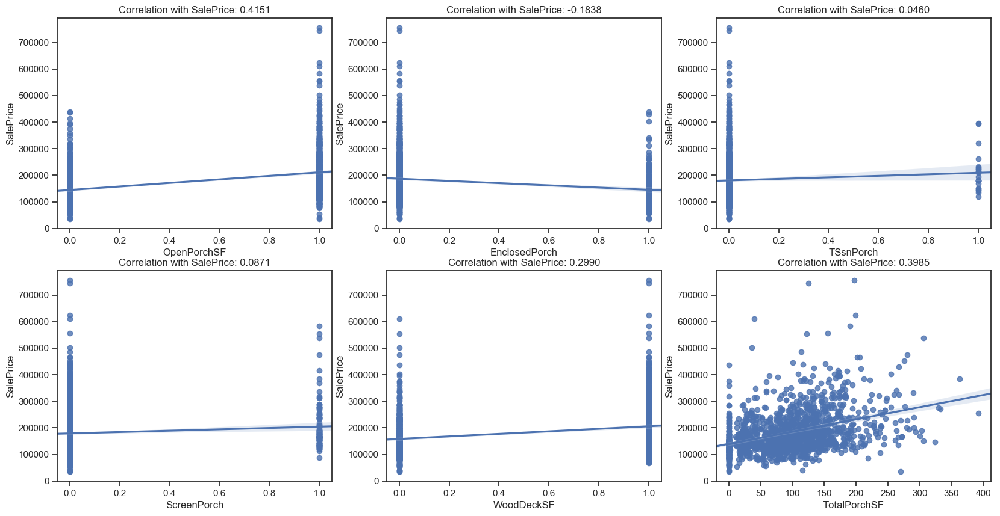

In [26]:
df.OpenPorchSF = df.OpenPorchSF > 0
df.EnclosedPorch =  df.EnclosedPorch > 0
df.TSsnPorch = df.TSsnPorch > 0
df.ScreenPorch = df.ScreenPorch > 0
df.WoodDeckSF = df.WoodDeckSF > 0
df.TotalPorchSF = np.sqrt(df.TotalPorchSF) * (np.log1p(np.sqrt(df.TotalPorchSF))**2)

PorshPlots()

### Slope of property and Lot area

     SalePrice  LandSlope   LotArea  LotAreaMultSlope
249   277000.0          1  159000.0          159000.0
313   375000.0          1  215245.0          215245.0
335   228950.0          1  164660.0          164660.0


Text(0.5,1,'Correlation with SalePrice: 0.4106')

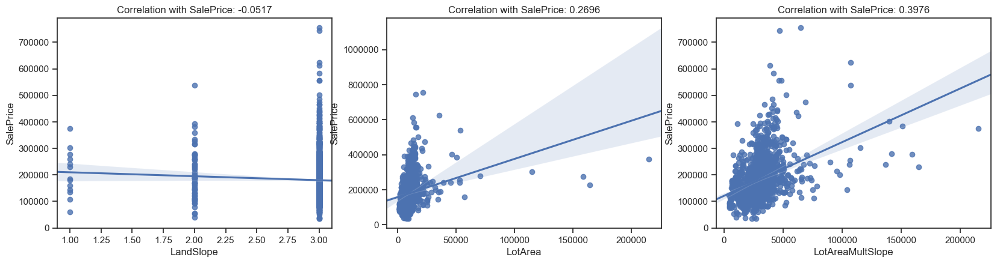

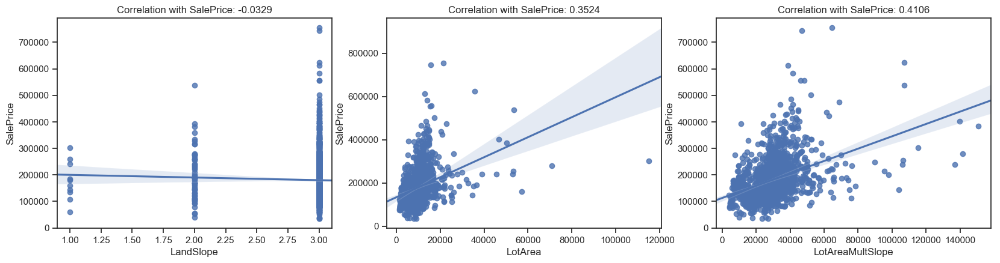

In [27]:
# LandSlope: Slope of property
LandSlope = {}
LandSlope['Gtl'] = 3 #'Gentle slope'
LandSlope['Mod'] = 2 #'Moderate Slope'
LandSlope['Sev'] = 1 #'Severe Slope'

df = data[['SalePrice', 'LandSlope', 'LotArea']]
df.LandSlope = df.LandSlope.map(LandSlope)
df['LotAreaMultSlope'] = (df.LotArea * df.LandSlope)

fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))

print(df[df.LotArea>155000])
df = df[df.LotArea<155000]
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(234); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(235); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(236); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))

### Neighborhood

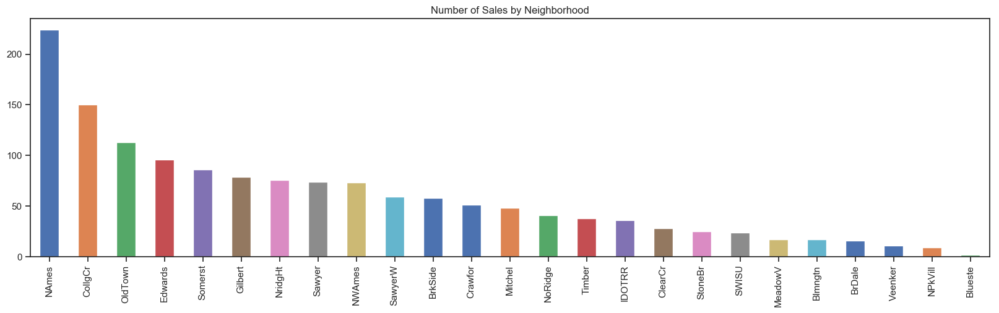

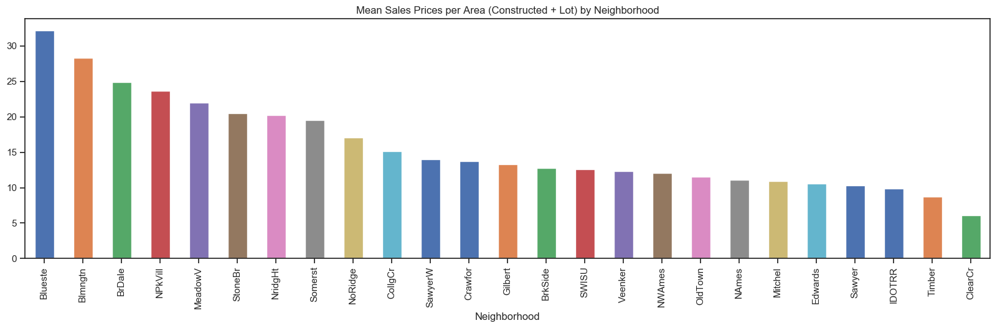

In [28]:
figa = plt.figure(figsize=(20, 5))
g = data.Neighborhood.value_counts().plot(kind='bar', title='Number of Sales by Neighborhood')

figb = plt.figure(figsize=(20, 5))
plt.tight_layout()
df = data[['SalePrice', 'YrSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) + data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
 
df = df.groupby(by=['Neighborhood', 'YrSold'], as_index=False).sum()
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
g = Neig.groupby('Neighborhood').NeigPrice.sum().sort_values(ascending = False).plot(kind='bar', title='Mean Sales Prices per Area (Constructed + Lot) by Neighborhood')
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:


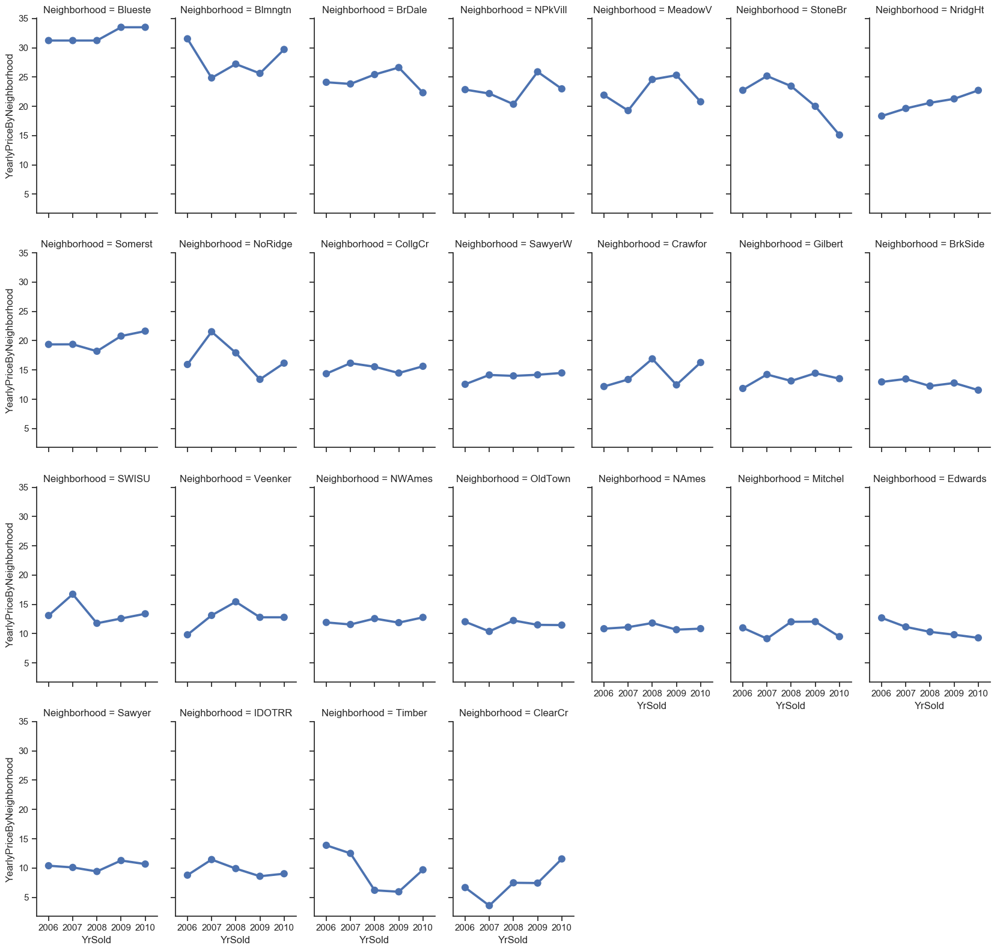

In [29]:
# Yearly Sales Price per Area (Constructed + Lot) by Neighborhood:
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['NPkVill', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2009, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2007, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].max()]], 
                            columns=df.columns))

# Reserve data to merge with all data set of train and test data
YearlyPrice = df
YearlyPrice.columns = ['Neighborhood', 'YrSold', 'YearlyPriceByNeighborhood']

print('                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)

                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:


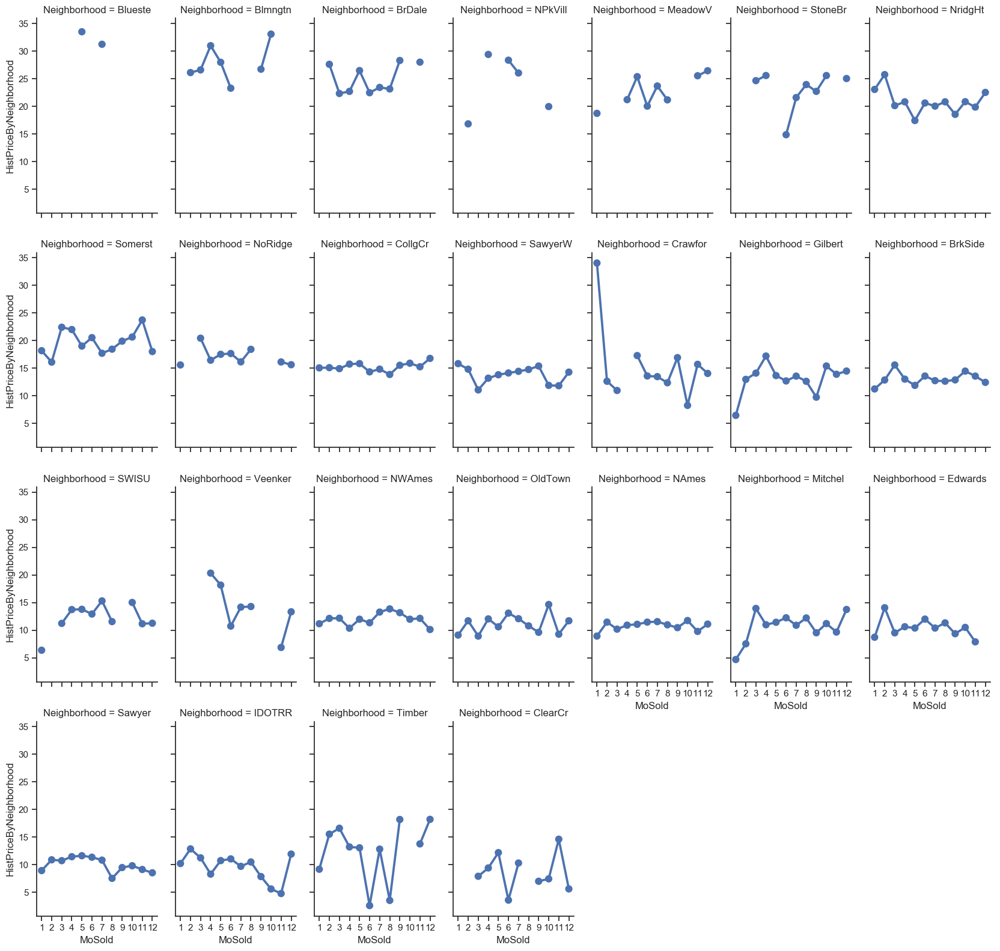

In [30]:
# Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:
df = data[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                   data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

print('                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'HistPriceByNeighborhood', x = 'MoSold', col='Neighborhood', data=df, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )

In [31]:
# Outliers from Crawfor Neighborhood
df = data[data.Neighborhood=='Crawfor'][['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )

df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df[df.HistPriceByNeighborhood>30]

,SalePrice,MoSold,Neighborhood,TotalArea,HistPriceByNeighborhood
1181,392500.0,11,Crawfor,9875.0,39.746835
1405,275000.0,1,Crawfor,8074.0,34.059946


In [32]:
data = data.loc[~(data.SalePrice==392500.0)]
data = data.loc[~((data.SalePrice==275000.0) & (data.Neighborhood=='Crawfor'))]

                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:


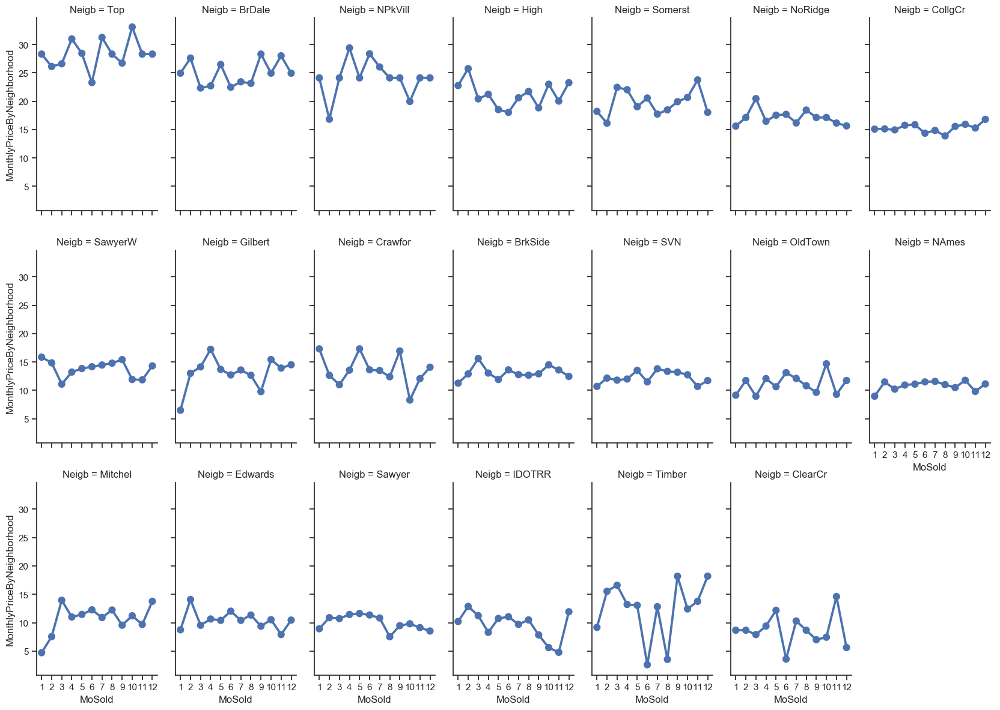

In [33]:
# Bin neighborhood for trade cases with low observations on monthly sales prices per Area (Constructed + Lot) by Neighborhood:
Neigb = {}
Neigb['Blueste'] = 'Top'     # 32.212721
Neigb['Blmngtn'] = 'Top'     # 28.364756
Neigb['BrDale']  = 'BrDale'  # 24.903923
Neigb['NPkVill'] = 'NPkVill' # 23.681105
Neigb['MeadowV'] = 'High'    # 22.034923
Neigb['StoneBr'] = 'High'    # 20.475090
Neigb['NridgHt'] =  'High'   # 20.209245
Neigb['Somerst'] = 'Somerst' # 19.551888
Neigb['NoRidge'] = 'NoRidge' # 17.038145
Neigb['CollgCr'] = 'CollgCr' # 15.134767
Neigb['SawyerW'] = 'SawyerW' # 13.992995
Neigb['Crawfor'] = 'Crawfor' # 13.773418
Neigb['Gilbert'] = 'Gilbert' # 13.260281
Neigb['BrkSide'] = 'BrkSide' # 12.785202
Neigb['SWISU']   = 'SVN'     # 12.635171
Neigb['Veenker'] = 'SVN'     # 12.343735
Neigb['NWAmes']  = 'SVN'     # 12.066590
Neigb['OldTown'] = 'OldTown' # 11.571331
Neigb['NAmes']   = 'NAmes'   # 11.091393
Neigb['Mitchel'] = 'Mitchel' # 10.936368
Neigb['Edwards'] = 'Edwards' # 10.614919
Neigb['Sawyer']  = 'Sawyer'  #10.334445
Neigb['IDOTRR']  = 'IDOTRR'  # 9.880838
Neigb['Timber']  = 'Timber'  # 8.723326
Neigb['ClearCr'] = 'ClearCr' # 6.113654

# Preper dataset for Sales Price per Area (Constructed + Lot) by Neighborhood:
df = data[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
df['Price'] = df.SalePrice/df.TotalArea

# Cut Outliers from Crawfor Neighborhood
df = df[(((df.Neighborhood == 'Crawfor') & (df.Price<30.)) | (df.Neighborhood != 'Crawfor'))]
df.drop(['Price'], axis=1, inplace=True)

df.Neighborhood = data.Neighborhood.map(Neigb)

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea

# Get the index for order by value
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['Top', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 8, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 11, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 1, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 10, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 12, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 1, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 3, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 5, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 8, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 11, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 12, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 2, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 10, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].max()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 4, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Timber', 10, df.HistPriceByNeighborhood[df.Neighborhood=='Timber'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 1, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 2, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 8, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Edwards', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Edwards'].mean()]], 
                            columns=df.columns))


# Reserve data to merge with all data set of train and test data
MonthlyPrice = df
MonthlyPrice.columns = ['Neigb', 'MoSold', 'MonthlyPriceByNeighborhood']

print('                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:')
g = sns.catplot(y= 'MonthlyPriceByNeighborhood', x = 'MoSold', col='Neigb', data=MonthlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )


### Check the Dependent Variable - SalePrice:

Since most of the machine learning algorithms start from the principle that our data has a normal distribution, we first take a look at the distribution of our **independent variable**. For this, I create a procedure to plot the **Sales Dsitribution** and **QQ-plot** to identify substantive departures from normality, likes ***outliers***, ***skewness*** and ***kurtosis***.

In [34]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20,7))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()

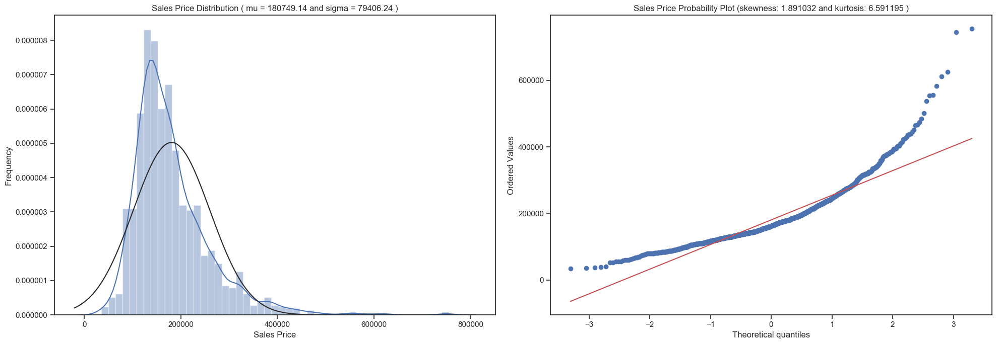

In [35]:
QQ_plot(data.SalePrice, 'Sales Price')

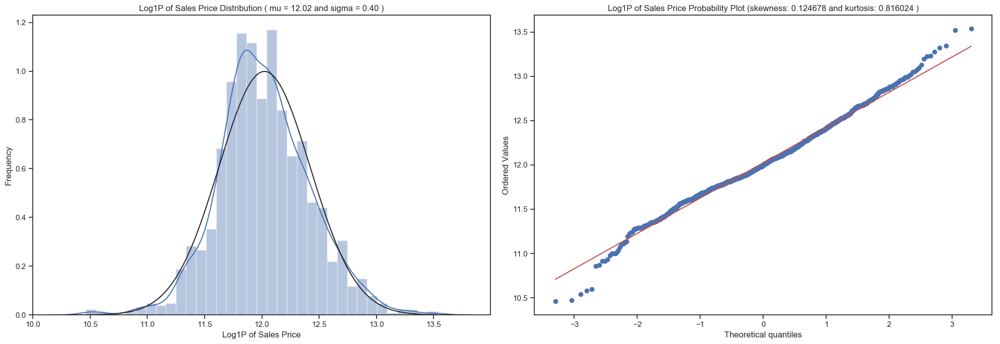

In [36]:
# y, lambda_opt_y = boxcox(1 + data.SalePrice) # -2.6542833469202254
y = data.SalePrice
Sale = np.log1p(data.SalePrice)

QQ_plot(Sale, 'Log1P of Sales Price')

From the first graph above we can see that Sales Price distribution is ***skewed***, has a **peak**, it **deviates from normal distribution** and is **positively biased**.
From the **Probability Plot**, we could see that **Sales Price** also does **not align with the diagonal  <span style="color:red">red line</span>** which represent normal distribution. The form of its distribution confirm that is a skewed right. 

With ***skewness positive of 1.9***, we confirm the **lack of symmetry** and indicate that Sales Price are **skewed right**, as we can see too at the Sales Distribution plot, skewed right means that the right tail is **long relative to the left tail**. The skewness for a normal distribution is zero, and any symmetric data should have a skewness near zero. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.

**Kurtosis** is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution. That is, data sets with high kurtosis tend to have heavy tails, or outliers, and **positive** kurtosis indicates a **heavy-tailed distribution** and **negative** kurtosis indicates a **light tailed distribution**. So, with 6.5 of positive kurtosis **Sales Price** are definitely heavy-tailed and has some **outliers** that we need take care.

Note that in contrast to common belief, training a linear regression model does not require that the explanatory or target variables are normally distributed. The normality assumption is only a requirement for certain statistical tests and hypothesis tests
So, I try diferents linear regressors with both, with and without transformantion of SalePrice to chek their results.

### Test hypothesis of better feature: Construction Area
Let's create a new feature that sum all area features, the construct area, and evaluates if is better than their parcels.

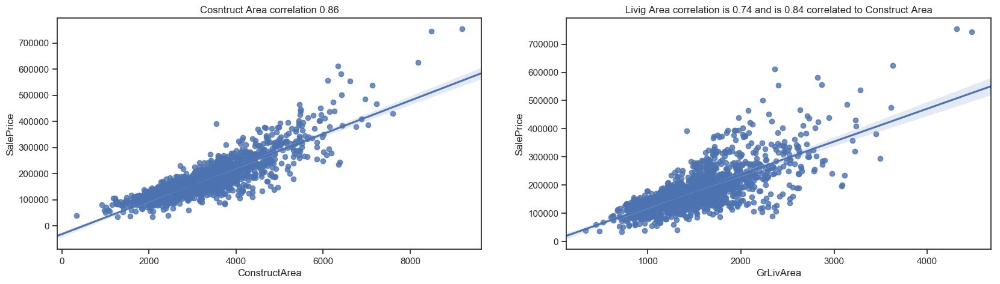

In [37]:
df = data[['SalePrice', 'GrLivArea']]
df['ConstructArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + 
                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
                         
fig8 = plt.figure(figsize=(20,5))
fig9 = fig8.add_subplot(121); sns.regplot((df.ConstructArea), df.SalePrice)
plt.title('Cosntruct Area correlation {:1.2f}'.format(df.ConstructArea.corr(df.SalePrice)))

fig10 = fig8.add_subplot(122); sns.regplot((df.GrLivArea.fillna(0)), df.SalePrice)
tit = 'Livig Area correlation is {:1.2f} and is {:1.2f} correlated to Construct Area'
plt.title(tit.format(df.GrLivArea.fillna(0).corr(df.SalePrice), df.GrLivArea.corr(df.ConstructArea)))
plt.show()

As we can see, our built metric performs better than its pacelas, even more than the living area. Besides better correlation, it presents less bias and variance.

This may lead us to think of a model option that uses only the constructed area, without including any of the parcels, that would be replaced by an indication variable of existence or not if there is no categorical variable associated with it.

We can also use them to compose other variables and finally remove them.

Anyway the **living area** seems ***useless*** now, to prove it let's go see how a single linear regressor perform with this options:

In [38]:
def print_results():
    # The coefficients
    print('Coefficients: \n', lr.coef_)
    # The mean squared error
    print("Root mean squared error: %.4f"
          % np.expm1(np.sqrt(mean_squared_error(y_test, y_pred))))
    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.4f' % r2_score(y_test, y_pred))
    print('--------------------------------------------------------------------------------\n')
    
from sklearn.model_selection import train_test_split

scale = RobustScaler()
y = np.log1p(df.SalePrice)

X = scale.fit_transform(df[['ConstructArea', 'GrLivArea']])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

lr = LinearRegression()

print('1. Linear regressor with only living Area:')
lr.fit(X_train[: , 1].reshape(-1, 1), y_train)

# Make predictions using the testing set
y_pred = lr.predict(X_test[: , 1].reshape(-1, 1))
print_results()

print('2. Linear regressor with bouth features:')
lr.fit(X_train, y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test)
print_results()

print('3. Linear regressor with only Construct Area:')
lr = LinearRegression()
lr.fit(X_train[: , 0].reshape(-1, 1), y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test[: , 0].reshape(-1, 1))
print_results()

print('4. Polinomial regressor of orden 3 with only Construction Area:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train[: , 0].reshape(-1, 1))

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test[: , 0].reshape(-1, 1)))
print_results()

print('5. Polinomial regressor of orden 3 with both features:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train)

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test))
print_results()

1. Linear regressor with only living Area:
Coefficients: 
 [0.37373448]
Root mean squared error: 0.3135
Variance score: 0.5547
--------------------------------------------------------------------------------

2. Linear regressor with bouth features:
Coefficients: 
 [0.40446921 0.02013973]
Root mean squared error: 0.2275
Variance score: 0.7484
--------------------------------------------------------------------------------

3. Linear regressor with only Construct Area:
Coefficients: 
 [0.42050449]
Root mean squared error: 0.2276
Variance score: 0.7481
--------------------------------------------------------------------------------

4. Polinomial regressor of orden 3 with only Construction Area:
Coefficients: 
 [ 0.437434   -0.0420375   0.00630214]
Root mean squared error: 0.2212
Variance score: 0.7608
--------------------------------------------------------------------------------

5. Polinomial regressor of orden 3 with both features:
Coefficients: 
 [ 0.41182783  0.03846449 -0.0503578

According to the above results, we can safely eliminate the living area, and as there are no records with it zero or null we will not create an existence indicator for it.

Other importante point is the **polynomial transformation of ordem 3** presents ***improvements*** of **2.6%** and **1.8%** of  RMSE and R2 respectively. So, now we have a simple regressor to bit!

Before create new features and other test, is better to make the data cleaning and fill nas.

## 3. Check Data Quality:
### Nulls Check:
In this section, I am going to fix the 34 predictors that contains missing values. I will go through them working my way down from most NAs until I have fixed them all. If I stumble upon a variable that actually forms a group with other variables, I will also deal with them as a group. For instance, there are multiple variables that relate to Pool, Garage, and Basement.

In [39]:
#all_data = pd.concat((data.loc[:, 'MSSubClass': 'SaleCondition'], test.loc[:,'MSSubClass':'SaleCondition']))
all_data = pd.concat((data, test))

print("All data observations have {0} rows and {1} columns".format(all_data.shape[0], all_data.shape[1]))
details = rstr(all_data)
print("All data have {1:2.2%} of null at {0} features".format(details[details.nulls>0].shape[0], 
                                                   details.nulls[details.nulls>0].sum()/all_data.size))
print('\nBelow the table with all columns with nulls oredered by missin ration:')
display(details.loc[(details.nulls>0), 'types':'uniques'].sort_values(by= 'missing ration', ascending=False))

All data observations have 2908 rows and 90 columns
Data shape: (2908, 90)
___________________________
Data types:
 object     48
float64    27
int64      14
float32     1
Name: types, dtype: int64
___________________________
All data have 5.62% of null at 41 features

Below the table with all columns with nulls oredered by missin ration:


,types,counts,distincts,nulls,missing ration,uniques
PoolQC,object,9,4,2899,99.690509,"[[nan, Ex, Fa, Gd]]"
MiscFeature,object,104,5,2804,96.423659,"[[nan, Shed, Gar2, Othr, TenC]]"
Alley,object,197,3,2711,93.225585,"[[nan, Grvl, Pave]]"
Fence,object,570,5,2338,80.398900,"[[nan, MnPrv, GdWo, GdPrv, MnWw]]"
FireplaceQu,object,1493,6,1415,48.658872,"[[nan, TA, Gd, Fa, Ex, Po]]"
LotFrontage,float64,2423,129,485,16.678129,"[[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, na..."
GarageYrBlt,float64,2752,104,156,5.364512,"[[2003.0, 1976.0, 2001.0, 1998.0, 2000.0, 1993..."
GarageQual,object,2752,6,156,5.364512,"[[TA, Fa, Gd, nan, Ex, Po]]"
GarageFinish,object,2752,4,156,5.364512,"[[RFn, Unf, Fin, nan]]"
GarageCond,object,2752,6,156,5.364512,"[[TA, Fa, nan, Gd, Po, Ex]]"


In [40]:
class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

### Some Observations Respect Data Quality:
<p>The total training observations are 1,460 and have 79 features ( 3 float64, 33 int64, 43 object ) with 19 columns with nulls
All data observations, including test dataste, have 2919 rows and 79 features, where 6.06% are nulls, but found nulls at 34 diferente features. So the test dataset has null in features that training dataset doesn't have!

***Based on feature description provide, A feature that has NA means it is absent***
<p>
First, before we assume this as a total reality, we need check some quality issues, like the record has Garage, but doesn't have Garage Quality and vice versa.


 - 14 has few null, so are good candidates for imputer strategies:
   - GarageFinish  1379  object.  Interior finish of the garage.
   - GarageQual    1379  object:  Garage quality. 
   - GarageCond    1379  object:  Garage condition. 
   - GarageType    1379  object:  Garage location
   - GarageYrBlt   1379  float64: Year garage was built
   - Electrical    1459  object.  Only one, can apply the most commun.
   - MasVnrType    1452  object:  is the masonry veneer type, hasn't CBlock!
   - MasVnrArea    1452  float64: Masonry veneer area in square feet.   
   - BsmtExposure  1422  object:  Refers to walkout or garden level walls.
   - BsmtFinType2  1422  object:  Rating of basement finished area (if multiple types).
   - BsmtQual      1423  object:  Evaluates the height of the basement Doesn't have PO.
   - BsmtCond      1423  object:  Ealuates the general condition of the basement. 
   - BsmtFinType1  1423  object:  Rating of basement finished area (if multiple types).    
   - LotFrontage   1201  float64: is the linear feet of street connected to property.
<p>
 - 5 has miss ration grater than 47%, maybe candidates to exclude, especially if their have below correlation with price.
    - Fence         281  object: Fence quality.
    - FireplaceQu   770  object: Fireplace quality.
    - MiscFeature    54  object: Miscellaneous feature not covered in other categories. 
    - Alley          91  object: is the type of alley access to property.
    - PoolQC          7  object: Pool quality. Atention for the related other feature PoolArea: Pool area in square feet

Some numeric data are ordinal or categorical already translate to codes. We need correct identify the ordinal from the description and can maintain as is, but need to change de categoricals.<p>
    
Utilities : For this categorical feature all records are "AllPub", except for one "NoSeWa" and 2 NA . Since the house with 'NoSewa' is in the training set, this feature won't help in predictive modelling. We can then safely remove it.

In [41]:
all_data.drop('Utilities', axis=1, inplace=True)

### Identify the Most Commun Electrical:

In [42]:
display(all_data.Electrical.value_counts())

all_data.Electrical = all_data.Electrical.fillna('SBrkr')

SBrkr    2661
FuseA     187
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

### Fill Missing Values of Garage Features:
Identify if has some special cases where we find some garage feature inputted, where's others garages features are null.

In [43]:
feat = ['GarageYrBlt', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'GarageArea', 'GarageCars']
print(all_data[feat].isnull().sum())
print("GarageArea equal a 0: ", (all_data.GarageArea==0).sum())
print("GarageCars equal a 0: ", (all_data.GarageCars==0).sum())
c = all_data[~all_data.GarageType.isnull()][feat]
c[c.GarageYrBlt.isnull()]

GarageYrBlt     156
GarageType      154
GarageFinish    156
GarageQual      156
GarageCond      156
GarageArea        1
GarageCars        1
dtype: int64
GarageArea equal a 0:  154
GarageCars equal a 0:  154


,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
2126,NaN,Detchd,NaN,NaN,NaN,360.0,1.0
2576,NaN,Detchd,NaN,NaN,NaN,NaN,NaN


#### Group by GarageType and fill missing value with median or mode where GarageType equal a Detchd and 0 or NA for the others

In [44]:
all_data.GarageType = all_data.GarageType.fillna('NA')

# Group by GarageType and fill missing value with median where GarageType=='Detchd' and 0 for the others
cmedian = all_data[all_data.GarageType=='Detchd'].GarageArea.median()
print("GarageArea median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageArea'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageArea'].fillna(cmedian)
all_data.GarageArea = all_data.GarageArea.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageCars.median()
print("GarageCars median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCars'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCars'].fillna(cmedian)
all_data.GarageCars = all_data.GarageCars.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageYrBlt.median()
print("GarageYrBlt median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageYrBlt'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                          'GarageYrBlt'].fillna(cmedian)
all_data.GarageYrBlt = all_data.GarageYrBlt.fillna(0)

# Group by GarageType and fill missing value with mode where GarageType=='Detchd' and 'NA' for the others
cmode = all_data[all_data.GarageType=='Detchd'].GarageFinish.mode()[0]
print("GarageFinish mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageFinish'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                           'GarageFinish'].fillna(cmode)
all_data.GarageFinish = all_data.GarageFinish.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageQual.mode()[0]
print("GarageQual mode of Type Detchd: %s" %cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageQual'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageQual'].fillna(cmode)
all_data.GarageQual = all_data.GarageQual.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageCond.mode()[0]
print("GarageCond mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCond'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCond'].fillna(cmode)
all_data.GarageCond = all_data.GarageCond.fillna('NA')

GarageArea median of Type Detchd: 397.5
GarageCars median of Type Detchd: 2.0
GarageYrBlt median of Type Detchd: 1962.0
GarageFinish mode of Type Detchd: Unf
GarageQual mode of Type Detchd: TA
GarageCond mode of Type Detchd: TA


### Check if all nulls of Garage features are inputed

In [45]:
print(all_data[feat].isnull().sum())

GarageYrBlt     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
GarageArea      0
GarageCars      0
dtype: int64


### Masonry veneer - Check Nulls and Data Quality Problems:

In [46]:
feat = ['MasVnrArea', 'MasVnrType']
c = all_data[~all_data.MasVnrArea.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')
print("Has MasVnrType but not has MasVnrArea:",all_data[~all_data.MasVnrType.isnull()].MasVnrArea.isnull().sum())
print("Has MasVnrArea but not has MasVnrType:",c[c.MasVnrType.isnull()].MasVnrArea.count())
print(c[c.MasVnrType.isnull()], '\n')

print("Has MasVnrType but MasVnrArea is equal a Zero:",c[c.MasVnrArea==0].MasVnrType.count())
print("MasVnrArea equal a 0: ", (all_data.MasVnrArea==0).sum(), '\n')
print("Has Type and Area == 0:")
print(c[c.MasVnrArea==0].MasVnrType.value_counts(), '\n')

print("Type None with Area > 0 ?")
print(all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType','MasVnrArea']])

print('\n What is the most comumn MasVnrType after None?')
print(all_data.MasVnrType.value_counts())

Masonry veneer Nulls:
MasVnrArea    23
MasVnrType    24
dtype: int64 

Has MasVnrType but not has MasVnrArea: 0
Has MasVnrArea but not has MasVnrType: 1
      MasVnrArea MasVnrType
2610       198.0        NaN 

Has MasVnrType but MasVnrArea is equal a Zero: 1734
MasVnrArea equal a 0:  1734 

Has Type and Area == 0:
None       1731
BrkFace       2
Stone         1
Name: MasVnrType, dtype: int64 

Type None with Area > 0 ?
     MasVnrType  MasVnrArea
624        None       288.0
773        None         1.0
1230       None         1.0
1300       None       344.0
1334       None       312.0
1669       None       285.0
2452       None         1.0

 What is the most comumn MasVnrType after None?
None       1738
BrkFace     877
Stone       244
BrkCmn       25
Name: MasVnrType, dtype: int64


### Masonry veneer - Input nulls and Solve Data Quality Problames:

In [47]:
all_data.MasVnrType.value_counts()

None       1738
BrkFace     877
Stone       244
BrkCmn       25
Name: MasVnrType, dtype: int64

#### Corret to BrkFace the Massory Veneer Types Nulls and Nones wheres records has Massory Veneer Area

In [48]:
# All None Types with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types null with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType.isnull()) & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types different from None with Are equal to 0 update to median Area of no None types with Areas
all_data.loc[(all_data.MasVnrType!='None') & 
             (all_data.MasVnrArea==0), ['MasVnrArea']] = all_data.loc[(all_data.MasVnrType!='None') & 
                                                                      (all_data.MasVnrArea>0), ['MasVnrArea']].median()[0]
# Filling 0 and None for records wheres both are nulls
all_data.MasVnrArea = all_data.MasVnrArea.fillna(0)
all_data.MasVnrType = all_data.MasVnrType.fillna('None')

#### Check if all Null are updeted

In [49]:
c = all_data[~all_data.MasVnrType.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')

Masonry veneer Nulls:
MasVnrArea    0
MasVnrType    0
dtype: int64 



### Check and Input Basement Features Nulls:

In [50]:
feat = ['BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF','BsmtFullBath', 'BsmtHalfBath', 
        'BsmtQual', 'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
print(all_data[feat].isnull().sum())
print("BsmtFinSF1 equal a 0: ", (all_data.BsmtFinSF1==0).sum())
print("BsmtFinSF2 equal a 0: ", (all_data.BsmtFinSF2==0).sum())
print("BsmtUnfSF equal a 0: ", (all_data.BsmtUnfSF==0).sum())
print("TotalBsmtSF equal a 0: ", (all_data.TotalBsmtSF==0).sum())
print("BsmtFullBath equal a 0: ", (all_data.BsmtFullBath==0).sum())
print("BsmtHalfBath equal a 0: ", (all_data.BsmtHalfBath==0).sum())
#c = all_data[~all_data.GarageType.isnull()][feat]
#c[c.GarageYrBlt.isnull()]

BsmtFinSF1       1
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
BsmtFullBath     2
BsmtHalfBath     2
BsmtQual        81
BsmtCond        82
BsmtExposure    82
BsmtFinType1    79
BsmtFinType2    80
dtype: int64
BsmtFinSF1 equal a 0:  927
BsmtFinSF2 equal a 0:  2560
BsmtUnfSF equal a 0:  240
TotalBsmtSF equal a 0:  78
BsmtFullBath equal a 0:  1702
BsmtHalfBath equal a 0:  2734


In [51]:
# No Basement Av is the most comumn BsmtExposure. 
display(all_data.BsmtExposure.value_counts())

# Update nulls Exposure to Av wheres TotalBsmntSF is grenter tham zero 
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtExposure.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtExposure'] = 'Av'

No    1899
Av     417
Gd     271
Mn     239
Name: BsmtExposure, dtype: int64

In [52]:
# TA is the most comumn BsmtQual. 
display(all_data.BsmtQual.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtQual.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtQual'] = 'TA'

TA    1278
Gd    1208
Ex     253
Fa      88
Name: BsmtQual, dtype: int64

In [53]:
# TA is the most comumn BsmtCond. 
display(all_data.BsmtCond.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & (all_data.BsmtCond.isnull()) & (all_data.TotalBsmtSF>0), 'BsmtCond'] = 'TA'

TA    2597
Gd     121
Fa     103
Po       5
Name: BsmtCond, dtype: int64

In [54]:
# Unf is the most comumn BsmtFinType2. 
display(all_data.BsmtFinType2.value_counts())

# We use Unf for all cases wheres BsmtFinType2 is null but BsmtFinSF2 is grater than Zro
all_data.loc[(all_data.BsmtFinSF2>0) & (all_data.BsmtFinType2.isnull()) , 'BsmtFinType2'] = 'Unf'

Unf    2482
Rec     105
LwQ      87
BLQ      68
ALQ      52
GLQ      34
Name: BsmtFinType2, dtype: int64

In [55]:
# See below that we have one case where BsmtFinType2 is BLQ and the Area is Zero, but its area was inputed at Unfinesh
display(all_data[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull())][feat])

# Correct BsmtFinSF2 and BsmtUnfSF:
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtFinSF2'] = 354.0
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtUnfSF'] = 0.0

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
1470,1051.0,0.0,354.0,1405.0,1.0,0.0,Gd,TA,No,GLQ,BLQ


In [56]:
# All these cases are clear don´t have basement. 
print("Rest cases where Cond is Null", (all_data[all_data.BsmtCond.isnull()]).shape[0], '\n')
print('Others categories basement features are Null when Cond is Null:\n',
      (all_data[all_data.BsmtCond.isnull()][['BsmtQual', 'BsmtCond', 'BsmtExposure',
                                             'BsmtFinType1' , 'BsmtFinType2']]).isnull().sum())
print('\nOthers numerics basement features are Null or Zero when Cond is Null:\n',
      all_data[all_data.BsmtCond.isnull()][['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF' ,'TotalBsmtSF',
                                            'BsmtFullBath', 'BsmtHalfBath']].sum())
print("\nThe particular cases where's numeric basement features see below are Null were included in the previous groups:") 
display(all_data[all_data.BsmtFullBath.isnull()][feat])

# So, we update these Zero or NA according to their dictionary:
nulls_cols = {'BsmtExposure': 'NA', 'BsmtFinType2': 'NA', 'BsmtQual': 'NA', 'BsmtCond': 'NA', 'BsmtFinType1': 'NA',
              'BsmtFinSF1': 0, 'BsmtFinSF2': 0, 'BsmtUnfSF': 0 ,'TotalBsmtSF': 0, 'BsmtFullBath': 0, 'BsmtHalfBath': 0}

all_data = all_data.fillna(value=nulls_cols)

print('\nFinal Check if all nulls basement features are treated:', all_data[feat].isnull().sum().sum())

Rest cases where Cond is Null 79 

Others categories basement features are Null when Cond is Null:
 BsmtQual        79
BsmtCond        79
BsmtExposure    79
BsmtFinType1    79
BsmtFinType2    79
dtype: int64

Others numerics basement features are Null or Zero when Cond is Null:
 BsmtFinSF1      0.0
BsmtFinSF2      0.0
BsmtUnfSF       0.0
TotalBsmtSF     0.0
BsmtFullBath    0.0
BsmtHalfBath    0.0
dtype: float64

The particular cases where's numeric basement features see below are Null were included in the previous groups:


,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
2120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2188,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Final Check if all nulls basement features are treated: 0


### LotFrontage - Check and Fill Nulls

In [57]:
# Group by Neigborhood and fill missing value with Lot frontage median of the respect Neigborhood
NegMean = all_data.groupby('Neighborhood').LotFrontage.mean()

all_data.loc[all_data.LotFrontage.isnull() , 'LotFrontage'] = all_data.loc[all_data.LotFrontage.isnull() , 
                                                                            'Neighborhood'].apply(lambda x: NegMean[x])

### PoolQC - Fill Nulls
Probably models won't use Pools Features, since they has few correlation to price (0.069798) and more than 99% of missing.
But for the moment, we still filling null of PoolQC that has Area with based on the Overall Quality of the houses divied by 2.

In [58]:
PoolQC = {0: 'None', 1: 'Po', 2: 'Fa', 3: 'TA', 4: 'Gd', 5: 'Ex'}

all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), 
                    ['PoolQC']] =  ((all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), 
                    ['OverallQual']]/2).round()).apply(lambda x: x.map(PoolQC))

all_data.PoolQC = all_data.PoolQC.fillna('NA')

### Functional - Miss Values Treatment
Since Functional description include the statement "Assume typical unless deductions are warranted", we assume Typ for nulls cases.

In [59]:
all_data.Functional = all_data.Functional.fillna('Typ')

### FireplaceQu - Miss Values Tretment
Since all FireplaceQu nulls has Fireplaces equal a zero, its sure that FireplaceQu could be update to NA.

In [60]:
all_data.loc[(all_data.Fireplaces==0) & (all_data.FireplaceQu.isnull()), ['FireplaceQu']] = 'NA'

### KitchenQual - Miss Values Tretment
Since all KitchenQual nulls has KitchenAbvGr grater than zero, we assume mode for KitchenQual.

In [61]:
all_data.loc[(all_data.KitchenAbvGr>0) & (all_data.KitchenQual.isnull()), 
             ['KitchenQual']] = all_data.KitchenQual.mode()[0]

### Alley, Fence and MiscFeature - Miss Values Tretment
- Miscellaneous feature not covered in other categories. 
- Alley has a few records, and is not common to have Alley in propeties.
- It's not uncommon to see properties without fence at USA.

So, don't lose time and update nulls for NA.

In [62]:
all_data.Alley = all_data.Alley.fillna('NA')
all_data.Fence = all_data.Fence.fillna('NA')
all_data.MiscFeature = all_data.MiscFeature.fillna('NA')

### Back to the Past! GarageYrBlt from 2207

In [63]:
display(all_data.loc[all_data.GarageYrBlt==2207, ['GarageYrBlt', 'YearBuilt']])
all_data.loc[all_data.GarageYrBlt==2207.0, 'GarageYrBlt'] = 2007.0

,GarageYrBlt,YearBuilt
2592,2207.0,2006


### Treat Nulls on Additional Data from cityofames.org/assessor and Census

In [64]:
all_data.loc[all_data.PID.isnull(), 'PID'] = 0

all_data.loc[all_data.ClassSc_S.isnull(), 'ClassSc_S'] = 'NA'

all_data.loc[all_data.MA_City.isnull(), 'MA_City'] = 'NA'

all_data.loc[all_data.MA_City.isnull(), 'MA_City'] = 'NA'

all_data.loc[all_data.MA_State.isnull(), 'MA_State'] = 'NA'

median_TtlVal = all_data[['YearBuilt', 'Neighborhood', 'TtlVal_AsrYr']].\
                groupby(['YearBuilt', 'Neighborhood'], as_index=False).median()

all_data.TtlVal_AsrYr[all_data.TtlVal_AsrYr.isnull()] = \
  pd.merge(all_data.loc[all_data.TtlVal_AsrYr.isnull(), ['YearBuilt', 'Neighborhood']], median_TtlVal).TtlVal_AsrYr.values

all_data.PovertyRate[all_data.PovertyRate<0] = all_data.PovertyRate[all_data.PovertyRate>0].median()

### Final Check and Filling Nulss

In [65]:
all_data = DataFrameImputer().fit_transform(all_data)

# Final check if we have some NA
print("Data nulls:", all_data.isnull().sum().sum())

Data nulls: 0


In [66]:
all_data.Street.unique()

array(['Pave', 'Grvl'], dtype=object)

## Mapping Ordinal Features

In [67]:
def map_ordinals(data):
    
    # LandSlope: Slope of property
    LandSlope = {}
    LandSlope['Gtl'] = 3 #'Gentle slope'
    LandSlope['Mod'] = 2 #'Moderate Slope'
    LandSlope['Sev'] = 1 #'Severe Slope'

    data.LandSlope = data.LandSlope.map(LandSlope)
        
    # ExterQual: Evaluates the quality of the material on the exterior 
    ExterQual = {}
    ExterQual['Ex'] = 5 #'Excellent'
    ExterQual['Gd'] = 4 #'Good'
    ExterQual['TA'] = 3 #'Average/Typical'
    ExterQual['Fa'] = 2 #'Fair'
    ExterQual['Po'] = 1 #'Poor'
    ExterQual['NA'] = 0 #'NA'

    data.ExterQual = data.ExterQual.map(ExterQual)

    # ExterCond: Evaluates the present condition of the material on the exterior
    data.ExterCond = data.ExterCond.map(ExterQual)

    #HeatingQC: Heating quality and condition
    data.HeatingQC = data.HeatingQC.map(ExterQual)

    # KitchenQual: Kitchen quality
    data.KitchenQual = data.KitchenQual.map(ExterQual)

    # FireplaceQu: Fireplace quality
    data.FireplaceQu = data.FireplaceQu.map(ExterQual)

    # GarageCond: Garage Conditionals
    data.GarageCond = data.GarageCond.map(ExterQual)

    PavedDrive = {}
    PavedDrive['Y'] = 3 #'Paved'
    PavedDrive['P'] = 2 #'Partial Pavement'
    PavedDrive['N'] = 1 #'Dirt/Gravel'

    data.PavedDrive = data.PavedDrive.map(PavedDrive)

    # LotShape: General shape of property
    LotShape = {}
    LotShape['Reg'] = 4 #'Regular'
    LotShape['IR1'] = 3 #'Slightly irregular'
    LotShape['IR2'] = 2 #'Moderately Irregular'
    LotShape['IR3'] = 1 #'Irregular'

    data.LotShape = data.LotShape.map(LotShape)

    # BsmtQual: Evaluates the height of the basement
    BsmtQual = {}
    BsmtQual['Ex'] = 5 #'Excellent (100+ inches)'
    BsmtQual['Gd'] = 4 #'Good (90-99 inches)'
    BsmtQual['TA'] = 3 #'Typical (80-89 inches)'
    BsmtQual['Fa'] = 2 #'Fair (70-79 inches)'
    BsmtQual['Po'] = 1 #'Poor (<70 inches'
    BsmtQual['NA'] = 0 #'No Basement'

    data.BsmtQual = data.BsmtQual.map(BsmtQual)

    # BsmtCond: Evaluates the general condition of the basement
    data.BsmtCond = data.BsmtCond.map(BsmtQual)

    # GarageQual: Garage quality
    data.GarageQual = data.GarageQual.map(BsmtQual)

    # PoolQC: Pool quality
    data.PoolQC = data.PoolQC.map(BsmtQual)
    
    # BsmtExposure: Refers to walkout or garden level walls
    BsmtExposure = {}
    BsmtExposure['Gd'] = 4 #'Good Exposure'
    BsmtExposure['Av'] = 3 #'Average Exposure (split levels or foyers typically score average or above)'
    BsmtExposure['Mn'] = 2 #'Mimimum Exposure'
    BsmtExposure['No'] = 1 #'No Exposure'
    BsmtExposure['NA'] = 0 #'No Basement'

    data.BsmtExposure = data.BsmtExposure.map(BsmtExposure)

    # BsmtFinType1: Rating of basement finished area
    BsmtFinType1 = {}
    BsmtFinType1['GLQ'] = 6 #'Good Living Quarters'
    BsmtFinType1['ALQ'] = 5 # 'Average Living Quarters'
    BsmtFinType1['BLQ'] = 4 # 'Below Average Living Quarters'
    BsmtFinType1['Rec'] = 3 # 'Average Rec Room'
    BsmtFinType1['LwQ'] = 2 # 'Low Quality'
    BsmtFinType1['Unf'] = 1 # 'Unfinshed'
    BsmtFinType1['NA'] = 0 #'No Basement'

    data.BsmtFinType1 = data.BsmtFinType1.map(BsmtFinType1)

    # BsmtFinType2: Rating of basement finished area (if multiple types)
    data.BsmtFinType2 = data.BsmtFinType2.map(BsmtFinType1)

    #CentralAir: Central air conditioning
    # Since with this transformatio as the same as binarize this feature
    CentralAir = {}
    CentralAir['N'] = 0
    CentralAir['Y'] = 1

    data.CentralAir = data.CentralAir.map(CentralAir)

    # GarageFinish: Interior finish of the garage
    GarageFinish = {}
    GarageFinish['Fin'] = 3 #'Finished'
    GarageFinish['RFn'] = 2 #'Rough Finished'
    GarageFinish['Unf'] = 1 #'Unfinished'
    GarageFinish['NA'] = 0 #'No Garage'
    
    data.GarageFinish = data.GarageFinish.map(GarageFinish)
    
    # Functional: Home functionality
    Functional = {}
    Functional['Typ'] = 7   # Typical Functionality
    Functional['Min1'] = 6  # Minor Deductions 1
    Functional['Min2'] = 5  # Minor Deductions 2
    Functional['Mod'] = 4   # Moderate Deductions
    Functional['Maj1'] = 3  # Major Deductions 1
    Functional['Maj2'] = 2  # Major Deductions 2
    Functional['Sev'] = 1   # Severely Damaged
    Functional['Sal'] = 0   # Salvage only

    data.Functional = data.Functional.map(Functional)
    
    #Street: Type of road access to property
    # Since with this transformatio as the same as binarize this feature
    Street = {}
    Street['Grvl'] = 0 # Gravel 
    Street['Pave'] = 1 # Paved

    data.Street = data.Street.map(Street)

    '''
    # Fence: Fence quality
    Fence = {}
    Fence['GdPrv'] = 5 #'Good Privacy'
    Fence['MnPrv'] = 4 #'Minimum Privacy'
    Fence['GdWo'] = 3 #'Good Wood'
    Fence['MnWw'] = 2 #'Minimum Wood/Wire'
    Fence['NA'] = 1 #'No Fence'

    data.Fence = data.Fence.map(Fence)
    #But No Fence has the higest median Sales Price. So I try to use it as categorical
          
    '''    
    return data

all_data = map_ordinals(all_data)

## Feature Engineering: Create New Features:

### Include pool in the Miscfeatures

In [68]:
all_data.loc[(all_data.PoolArea>0) & (all_data.MiscVal>0), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']]

,MiscFeature,MiscVal,PoolArea,PoolQC
1386,TenC,2000.0,519.0,2


Check if we had others TenC in the dataset:

In [69]:
all_data.loc[(all_data.MiscFeature=='TenC'), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']]

,MiscFeature,MiscVal,PoolArea,PoolQC
1386,TenC,2000.0,519.0,2


Since we don't have other TenC and others Pools don´t coincide with any MiscFeature, we include the pools into the Misc Features and drop Pools columns after used it in the creation of others features,

In [70]:
all_data.loc[(all_data.PoolArea>0), ['MiscFeature']] = 'Pool'
all_data.loc[(all_data.PoolArea>0), ['MiscVal']] = all_data.loc[(all_data.PoolArea>0), 
                                                                ['MiscVal', 
                                                                 'PoolArea']].apply(lambda x: (x.MiscVal + x.PoolArea), axis=1)

### Points Review

In [71]:
all_data['TotalExtraPoints'] = all_data.HeatingQC + all_data.PoolQC + all_data.FireplaceQu  + all_data.KitchenQual
all_data['TotalPoints'] =  (all_data.ExterQual + all_data.FireplaceQu + all_data.GarageQual + all_data.KitchenQual +
                            all_data.BsmtQual + all_data.BsmtExposure + all_data.BsmtFinType1 + all_data.PoolQC + 
                            all_data.ExterCond + all_data.BsmtCond + all_data.GarageCond + all_data.OverallCond +
                            all_data.BsmtFinType2 + all_data.HeatingQC ) + all_data.OverallQual**2


#ntrain = data.shape[0]                             
df = all_data.loc[(all_data.SalePrice>0), ['TotalPoints', 'TotalExtraPoints', 'OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 
               'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'PoolQC', 'KitchenQual', 
               'FireplaceQu', 'GarageQual', 'GarageCond', 'SalePrice']] #[:ntrain]
#df['SalePrice'] = Sale

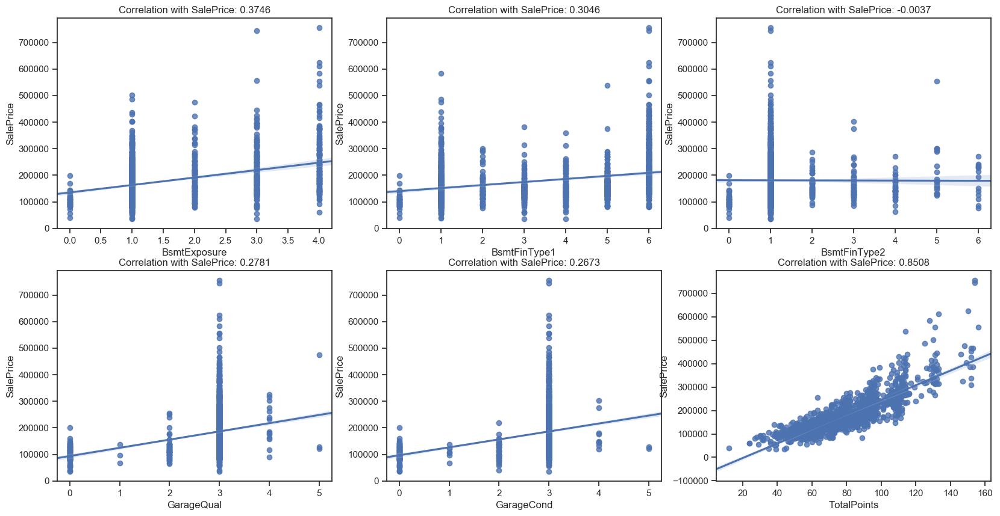

In [72]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='BsmtExposure', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtExposure.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='BsmtFinType1', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType1.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='BsmtFinType2', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType2.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='GarageQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageQual.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='GarageCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageCond.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='TotalPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPoints.corr(df['SalePrice'])))
plt.show()

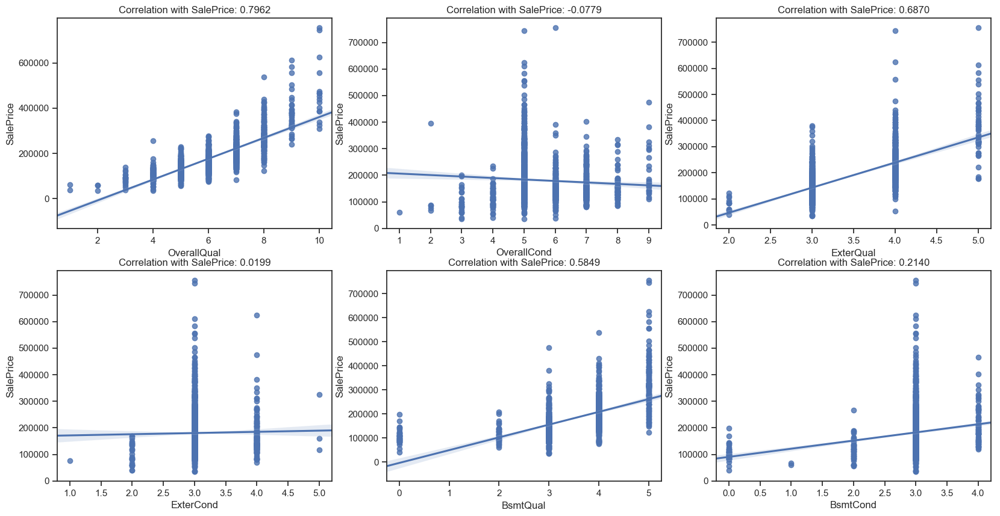

In [73]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='OverallQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallQual.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='OverallCond', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallCond.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='ExterQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='ExterCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterCond.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='BsmtQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtQual.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='BsmtCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtCond.corr(df['SalePrice'])))
plt.show()

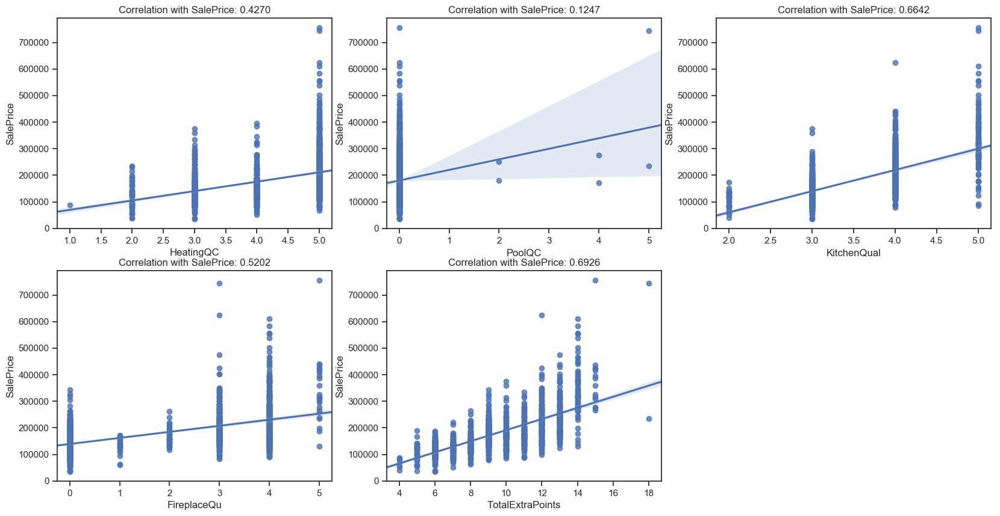

In [74]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='HeatingQC', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.HeatingQC.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='PoolQC', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.PoolQC.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='KitchenQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.KitchenQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='FireplaceQu', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.FireplaceQu.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='TotalExtraPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalExtraPoints.corr(df['SalePrice'])))

plt.show()

In [75]:
all_data['GarageArea_x_Car'] = all_data.GarageArea * all_data.GarageCars

all_data['TotalBsmtSF_x_Bsm'] = all_data.TotalBsmtSF * all_data['1stFlrSF']

all_data['ConstructArea'] = (all_data.TotalBsmtSF + all_data.WoodDeckSF + all_data.GrLivArea +
                             all_data.OpenPorchSF + all_data.TSsnPorch + all_data.ScreenPorch + all_data.EnclosedPorch +
                             all_data.MasVnrArea + all_data.GarageArea + all_data.PoolArea )

#all_data['TotalArea'] = all_data.ConstructArea + all_data.LotArea

all_data['Garage_Newest'] = all_data.YearBuilt > all_data.GarageYrBlt
all_data.Garage_Newest =  all_data.Garage_Newest.apply(lambda x: 1 if x else 0)

all_data['TotalPorchSF'] = all_data.OpenPorchSF + all_data.EnclosedPorch + all_data.TSsnPorch + all_data.ScreenPorch + all_data.WoodDeckSF
all_data.EnclosedPorch = all_data.EnclosedPorch.apply(lambda x: 1 if x else 0)

all_data['LotAreaMultSlope'] = all_data.LotArea * all_data.LandSlope


all_data['BsmtSFPoints'] = (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                            all_data.BsmtFinType1 + all_data.BsmtFinType2)


all_data['BsmtSFMultPoints'] = all_data.TotalBsmtSF * (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                                                       all_data.BsmtFinType1 + all_data.BsmtFinType2)

all_data['TotBathrooms'] = all_data.FullBath + (all_data.HalfBath*0.5) + all_data.BsmtFullBath + (all_data.BsmtHalfBath*0.5)
all_data.FullBath = all_data.FullBath.apply(lambda x: 1 if x else 0)
all_data.HalfBath = all_data.HalfBath.apply(lambda x: 1 if x else 0)
all_data.BsmtFullBath = all_data.BsmtFullBath.apply(lambda x: 1 if x else 0)
all_data.BsmtHalfBath = all_data.BsmtHalfBath.apply(lambda x: 1 if x else 0)

#all_data.Neighborhood = all_data.Neighborhood.map(Neigb)

### One Hot Encode Categorical Features

In [76]:
def one_hot_encode(df):
    categorical_cols = df.select_dtypes(include=['object']).columns

    print(len(categorical_cols), "categorical columns")
    print(categorical_cols)
    # Remove special charactres and withe spaces. 
    for col in categorical_cols:
        df[col] = df[col].str.replace('\W', '').str.replace(' ', '_') #.str.lower()

    dummies = pd.get_dummies(df[categorical_cols], columns = categorical_cols).columns
    df = pd.get_dummies(df, columns = categorical_cols)

    print("Total Columns:",len(df.columns))
    print(df.info())
    
    return df, dummies

all_data, dummies = one_hot_encode(all_data)

27 categorical columns
Index(['MSZoning', 'Alley', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
       'Heating', 'Electrical', 'GarageType', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'ClassPr_S', 'ClassSc_S', 'MA_City',
       'MA_State', 'ValType'],
      dtype='object')
Total Columns: 269
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2908 entries, 0 to 2918
Columns: 269 entries, Id to ValType_P
dtypes: float32(1), float64(31), int64(41), uint8(196)
memory usage: 2.2 MB
None


### Check for any correlations between features
To quantify the linear relationship between the features, I will now create a correlation matrix. 
 
The correlation matrix is identical to a covariance matrix computed from standardized data. The correlation matrix is a square matrix that contains the Pearson product-moment correlation coefficients (often abbreviated as Pearson's r), which measure the linear dependence between pairs of features. Pearson's correlation coefficient can simply be calculated as the covariance between two features x and y (numerator) divided by the product of their standard deviations (denominator):
![image.png](attachment:image.png)
The covariance between standardized features is in fact equal to their linear correlation coefficient.
Use NumPy's corrcoef and seaborn's heatmap function to plot the correlation matrix array as a heat map.

To fit a linear regression model, we are interested in those features that have a high correlation with our target variable. So, I will make a zoom in these features in order of their correlation with SalePrice.

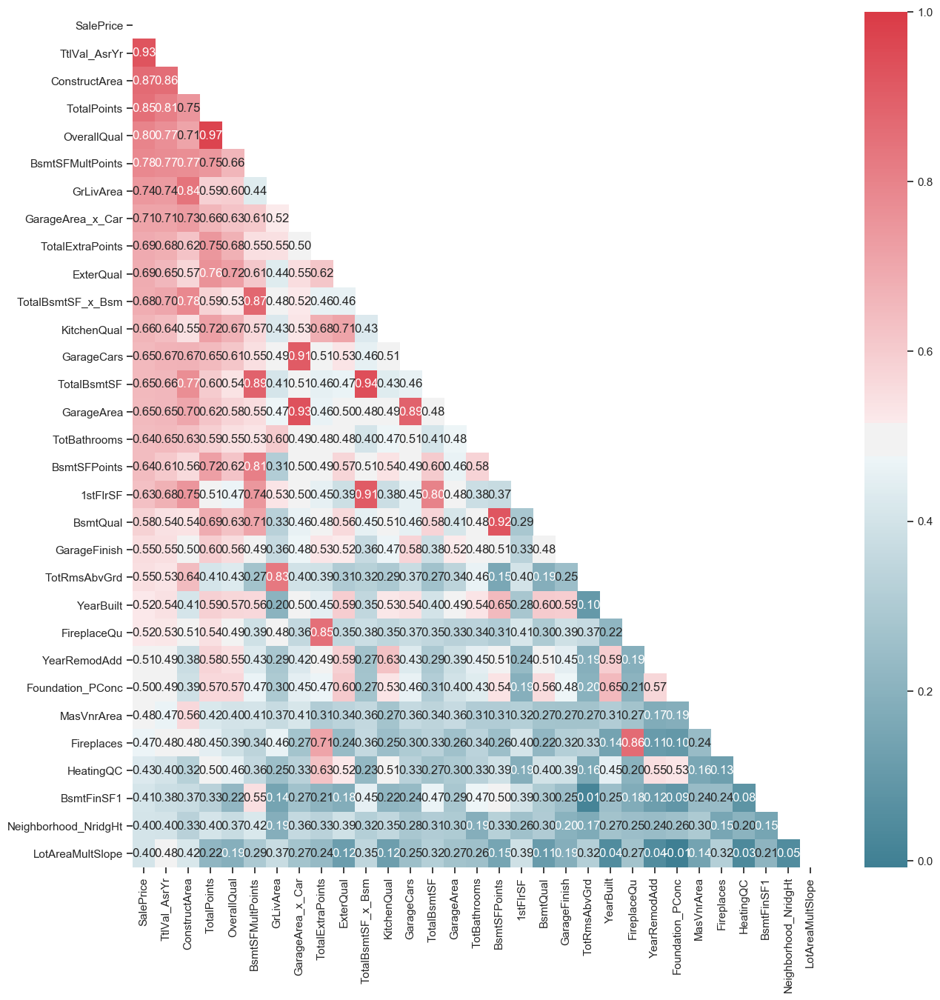

In [77]:
corr = all_data[all_data.SalePrice>1].corr()
top_corr_cols = corr[abs(corr.SalePrice)>=.4].SalePrice.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(15, 15))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=0.7)
plt.show()
del corr, dropSelf, top_corr

We can see that our target variable SalePrice shows the largest correlation with the OverallQual variable (0.79), followed by.  GrLivArea (0.71). This seems to make sense, since in fact we expect the overall quality and size of the living area to have a greater influence on our value judgments about a property.

From the graph above, it also becomes clear the multicollinearity is an issue. 
 - The correlation between GarageCars and GarageArea is very high (0.88), and has very close correlation with the SalePrice. 
 - From total square feet of basement area (TotalBsmtSF) and first Floor square feet (1stFlrSF), we found 0.81 of correlation and same correlation with sale price (0.61).
 - Original construction date (YearBuilt) has a little more correlation with price (0.52) than GarageYrBlt (0.49), and a high correlation between them (0.83)
 - 0.83 is the correlation between total rooms above grade not include bathrooms (TotRmsAbvGrd) and GrLivArea, but TotRmsAbvGrd has only 0.51 of correlation with sale price.
 
Let's see their distributions and type of relation curve between the 10th features with largest correlation with sales price:

#### Drop the features with highest correlations to other Features:

**Colinearity** is the state where two variables are highly correlated and contain similar information about the variance within a given dataset. And as you see above, it is easy to find ***highest collinearities*** (***Personal_Titles_Mrs***, ***Personal_Titles_Mr*** and ***Fare***.

You should always be concerned about the collinearity, regardless of the model/method being linear or not, or the main task being prediction or classification.

Assume a number of linearly correlated covariates/features present in the data set and Random Forest as the method. Obviously, random selection per node may pick only (or mostly) collinear features which may/will result in a poor split, and this can happen repeatedly, thus negatively affecting the performance.

Now, the collinear features may be less informative of the outcome than the other (non-collinear) features and as such they should be considered for elimination from the feature set anyway. However, assume that the features are ranked high in the 'feature importance' list produced by RF. As such they would be kept in the data set unnecessarily increasing the dimensionality. So, in practice, I'd always, as an exploratory step (out of many related) check the pairwise association of the features, including linear correlation.

In [78]:
all_data.drop(['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 'OverallQual', 'GrLivArea', 
               'TotalBsmtSF_x_Bsm', '1stFlrSF', 'PoolArea', 'LotArea', 'GarageYrBlt', 'GarageCond', 
               'SaleCondition_Partial', 'Exterior1st_VinylSd'], axis=1, inplace=True) 

In [79]:
top_corr_cols = top_corr_cols.drop(['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 
                                    'OverallQual', 'GrLivArea', 'TotalBsmtSF_x_Bsm', '1stFlrSF']) 

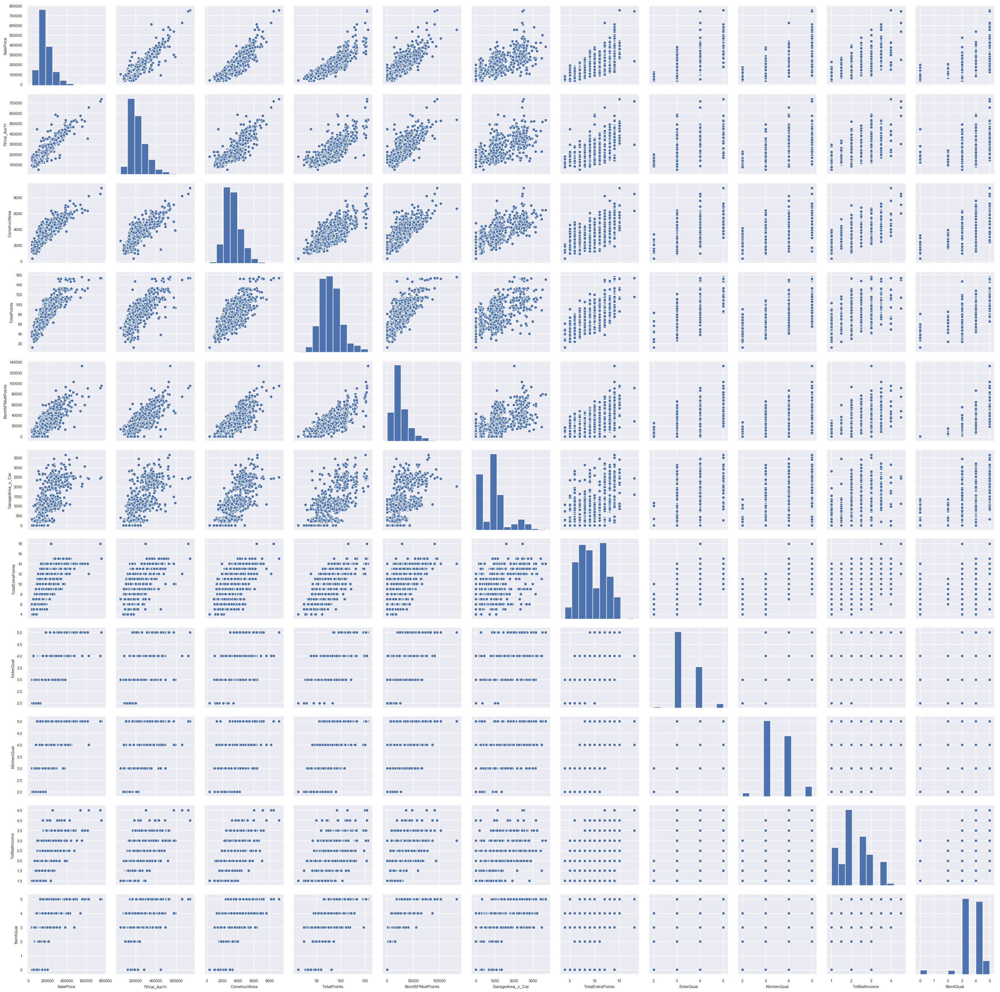

In [80]:
g = sns.pairplot(all_data.loc[all_data.SalePrice>0, top_corr_cols[:11]])

From the pairplot above is a clear that allmost features has a nonlinear relationship with sales price. On the other hand, the correlation between GrLivArea and SalePrice is also relatively high (0.71), and given the linear relationship between those two variables that we observed in the scatterplot, GrLivArea seems to be a good choice for an exploratory variable.

We can also note some of atentions points, like:
 - Some outliers: GrLivArea, GarageCars, GarageArea, TotalBsmtSF, 1stFlrSF. TotalRmsAbvGrd, YearBuilt and YearRemodAdd, most of then is area featutres. 
   - So, it's possibly reduce this with a little cut of outliers that probably pertain to the same few records.
   - On the other hand, probably we continue to see some of others  outliers after cut this few records. So:
     - it is suggested use of a robust scaler.
     - As an alternative to throwing out outliers, we will look at a robust method of regression using the RANdom SAmple Consensus (RANSAC) algorithm, which fits a regression model to a subset of the data, the so-called inliers.
   - We don´t have a feature with all construct area, maybe it is an interesting feature to create.
   - The five observations with higher number of Garage Cars and low price is strange.
 - We can see that most of data appears skewed and some of than has peaks long tails. It is suggest a use of box cox transformation
 - TotalBsmtSF and 1stFlrSf has the same correlation with SalePrice,  although 1stFlrSf appears to have a better angle.
 - The Sale Price appears skewed and hás a long right tail.

#### Identify  and treat multicollinearity:
**Multicollinearity** is more troublesome to detect because it emerges when three or more variables, which are highly correlated, are included within a model, leading to unreliable and unstable estimates of regression coefficients. To make matters worst multicollinearity can emerge even when isolated pairs of variables are not collinear.

To identify, we need start with the coefficient of determination, r<sup>2</sup>, is the square of the Pearson correlation coefficient r. The coefficient of determination, with respect to correlation, is the proportion of the variance that is shared by both variables. It gives a measure of the amount of variation that can be explained by the model (the correlation is the model). It is sometimes expressed as a percentage (e.g., 36% instead of 0.36) when we discuss the proportion of variance explained by the correlation. However, you should not write r<sup>2</sup> = 36%, or any other percentage. You should write it as a proportion (e.g., r<sup>2</sup> = 0.36).

Already the **Variance Inflation Factor** (**VIF**) is a measure of collinearity among predictor variables within a multiple regression.  It is may be calculated for each predictor by doing a linear regression of that predictor on all the other predictors, and then obtaining the R<sup>2</sup> from that regression.  It is calculated by taking the the ratio of the variance of all a given model's betas divide by the variance of a single beta if it were fit alone [1/(1-R<sup>2</sup>)]. Thus, a VIF of 1.8 tells us that the variance (the square of the standard error) of a particular coefficient is 80% larger than it would be if that predictor was completely uncorrelated with all the other predictors. The VIF has a lower bound of 1 but no upper bound. Authorities differ on how high the VIF has to be to constitute a problem (e.g.: 2.50 (R<sup>2</sup> equal to 0.6), sometimes 5 (R<sup>2</sup> equal to .8), or greater than 10 (R<sup>2</sup> equal to 0.9) and so on). 

But there are several situations in which multicollinearity can be safely ignored:

 - ***Interaction terms*** and ***higher-order terms*** (e.g., ***squared*** and ***cubed predictors***) ***are correlated*** with main effect terms because they include the main effects terms. **Ops!** Sometimes we use ***polynomials*** to solve problems, **indeed!** But keep calm, in these cases,  **standardizing** the predictors can **removed the multicollinearity**. 
 - ***Indicator***, like ***dummy*** or ***one-hot-encode***, that represent a ***categorical variable with three or more categories***. If the proportion of cases in the reference category is small, the indicator will necessarily have high VIF's, even if the categorical is not associated with other variables in the regression model. But, you need check if some dummy is collinear or has multicollinearity with other features outside of their dummies.
 - ***Control feature** if the ***feature of interest*** **do not have high VIF's**. Here's the thing about multicollinearity: it's only a problem for the features that are **collinear**. It increases the standard errors of their coefficients, and it may make those coefficients unstable in several ways. But so long as the collinear feature are only used as control feature, and they are not collinear with your feature of interest, there's no problem. The coefficients of the features of interest are not affected, and the performance of the control feature as controls is not impaired.

So, generally, we could run the same model twice, once with severe multicollinearity and once with moderate multicollinearity. This provides a great head-to-head comparison and it reveals the classic effects of multicollinearity. However, when standardizing your predictors doesn't work, you can try other solutions such as:
- removing highly correlated predictors
- linearly combining predictors, such as adding them together
- running entirely different analyses, such as partial least squares regression or principal components analysis

When considering a solution, keep in mind that all remedies have potential drawbacks. If you can live with less precise coefficient estimates, or a model that has a high R-squared but few significant predictors, doing nothing can be the correct decision because it won't impact the fit.

Given the potential for correlation among the predictors, we'll have display the variance inflation factors (VIF), which indicate the extent to which multicollinearity is present in a regression analysis. Hence such variables need to be removed from the model. Deleting one variable at a time and then again checking the VIF for the model is the best way to do this.

So, I start the analysis removed the 3 features with he highest collinearities and the surnames different from my control surname_Alone and correlation with survived less then 0.05, and run VIF.

In [81]:
all_data.rename(columns={'2ndFlrSF':'SndFlrSF'}, inplace=True)

In [82]:
def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['SalePrice'] = y.values

    # get y and X dataframes based on this regression:
    y, X = dmatrices(predict + ' ~' + features, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

# Remove the higest correlations and run a multiple regression
cols = all_data.columns
cols = cols.drop(['Id', 'PID', 'SalePrice'])
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
44,1.206127,MoSold
45,1.282221,YrSold
150,1.312612,Exterior1st_ImStucc
11,1.556104,ExterCond
25,1.567390,BsmtHalfBath
3,1.621456,Street
32,1.664436,Functional
26,1.718243,FullBath
4,1.757941,LotShape


From the results, I conclude that can safe maintain the dummies of Embarked, but need work in the remaining features where's the VIF stated as inf. You can see that surname Alone has a VIF of 2.2. We're going to treat it as our baseline and exclude it from our fit. This is done to prevent multicollinearity, or the dummy variable trap caused by including a dummy variable for every single category. let's try remove the dummy alone, that is pretty similar, and check if it solves the other dummies from its category:

In [83]:
# Remove one feature with VIF on Inf from the same category and run a multiple regression
cols = cols.drop(['RoofMatl_WdShngl', 'Exterior1st_CBlock', 'Exterior2nd_AsphShn', 'Condition2_RRNn', 'BldgType_TwnhsE', 
                  'HouseStyle_1Story', 'ValType_P', 'MSZoning_RM', 'Heating_Floor', 'Foundation_BrkTil', 'MasVnrType_BrkCmn', 
                  'Neighborhood_Blueste', 'LandContour_HLS', 'LotConfig_Corner', 'Alley_NA', 'RoofStyle_Gable', 
                  'Fence_GdPrv', 'Electrical_Mix', 'GarageType_Detchd', 'MiscFeature_NA', 'MA_State_others', 
                  'ClassSc_S_112STORYUNFINISHEDALLAGES', 'Condition1_RRNe', 'SaleType_ConLD', 'MA_City_AMES', 
                  'ClassPr_S_RESIDENTIAL'])

vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
44,1.206127,MoSold
69,1.243690,LotConfig_FR3
167,1.268628,Foundation_Wood
45,1.282221,YrSold
138,1.312612,Exterior1st_ImStucc
122,1.374231,RoofStyle_Gambrel
185,1.407112,Fence_MnWw
68,1.429367,LotConfig_FR2
177,1.443887,GarageType_2Types


### Transform Years to Ages and Create Flags to New and Remod

In [84]:
def AgeYears(feature): 
    return feature.apply(lambda x: 0 if x==0 else (2011 - x))

def categoricalYears(feature):
    feature = feature.apply(lambda x: 'New' if x>=2006 else 
                                      '2000-2005' if x>=2000 else 
                                      '1990-2000' if x>=1990 else 
                                      '1980-1990' if x>=1980 else 
                                      '1970-1980' if x>=1970 else 
                                      '1960-1970' if x>=1960 else 
                                      '1950-1960' if x>=1950 else 
                                      '1900-1950' if x>=1900 else 
                                      'None' if x == 0 else
                                      'Before 1900' )
    return feature


all_data.YearBuilt = AgeYears(all_data.YearBuilt)
all_data.YearRemodAdd = AgeYears(all_data.YearRemodAdd)
#all_data.GarageYrBlt = AgeYears(all_data.GarageYrBlt) 
all_data.YrSold =  AgeYears(all_data.YrSold) # all_data.YrSold.apply(str) 

Altogether, there are 3 variables that are relevant with regards to the Age of a house; YearBlt, YearRemodAdd, and YearSold. YearRemodAdd defaults to YearBuilt if there has been no Remodeling/Addition. I will use YearRemodeled and YearSold to determine the Age. However, as parts of old constructions will always remain and only parts of the house might have been renovated, I will also introduce a Remodeled Yes/No variable. This should be seen as some sort of penalty parameter that indicates that if the Age is based on a remodeling date, it is probably worth less than houses that were built from scratch in that same year.

In [85]:
all_data['Remod'] = 2
all_data.loc[(all_data.YearBuilt==all_data.YearRemodAdd), ['Remod']] = 0
all_data.loc[(all_data.YearBuilt!=all_data.YearRemodAdd), ['Remod']] = 1

all_data.Age = all_data.YearRemodAdd - all_data.YrSold # sice I convert both to age

all_data["IsNew"] = 2
all_data.loc[(all_data.YearBuilt==all_data.YrSold), ['IsNew']] = 1
all_data.loc[(all_data.YearBuilt!=all_data.YrSold), ['IsNew']] = 0

### Defining Categorical Data as Category

In order that the models do not make inappropriate use of features transformed into numbers and apply only calculations relevant to categorical, we have to transform their type into category type

In [86]:
all_data.CentralAir = all_data.CentralAir.astype('category')
all_data.Street = all_data.Street.astype('category')
all_data.Garage_Newest = all_data.Garage_Newest.astype('category')
all_data.EnclosedPorch = all_data.EnclosedPorch.astype('category')
all_data.FullBath = all_data.FullBath.astype('category')
all_data.HalfBath = all_data.HalfBath.astype('category')
all_data.BsmtFullBath = all_data.BsmtFullBath.astype('category')
all_data.BsmtHalfBath = all_data.BsmtHalfBath.astype('category')
all_data.Remod = all_data.Remod.astype('category')
all_data.IsNew = all_data.IsNew.astype('category') # bool
all_data.TxD_S = all_data.TxD_S.astype('category')
all_data.MSSubClass = all_data.MSSubClass.astype('category')
all_data.MoSold = all_data.MoSold.astype('category')
for feat in cols:
    if all_data[feat].dtype=='uint8':
        all_data[feat] = all_data[feat].astype('category')

## Box cox transformation of highly skewed features
A Box Cox transformation is a way to transform non-normal dependent variables into a normal shape. 

Why does this matter?
- **Model bias and spurious interactions**: If you are performing a regression or any statistical modeling, this asymmetrical behavior may lead to a bias in the model. If a factor has a significant effect on the average, because the variability is much larger, many factors will seem to have a stronger effect when the mean is larger. This is not due, however, to a true factor effect but rather to an increased amount of variability that affects all factor effect estimates when the mean gets larger. This will probably generate spurious interactions due to a non-constant variation, resulting in a **very complex model** with many **spurious** and **unrealistic** interactions.
- **Normality is an important assumption for many statistical techniques**: such as individuals control charts, Cp/Cpk analysis, t-tests and analysis of variance (ANOVA). A substantial departure from normality will bias your capability estimates.

One solution to this is to transform your data into normality using a [Box-Cox transformation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.boxcox.html) means that you are able to run a broader number of tests.

At the core of the Box Cox transformation is an exponent, lambda (λ), which varies from -5 to 5. All values of λ are considered and the optimal value for your data is selected; The 'optimal value' is the one which results in the best approximation of a normal distribution curve. The transformation of Y has the form:
<a href="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcox.png"><img src="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcox.png" alt="" width="222" height="70" class="aligncenter size-full wp-image-13940" /></a>

The scipy implementation proceeded with this formula, then you need before take care of negatives values if you have. A common technique for handling negative values is to add a constant value to the data prior to applying the log transform. The transformation is therefore log(Y+a) where a is the constant. Some people like to choose a so that min(Y+a) is a very small positive number (like 0.001). Others choose a so that min(Y+a) = 1. For the latter choice, you can show that a = b – min(Y), where b is either a small number or is 1.
This test only works for positive data. However, Box and Cox did propose a second formula that can be used for negative y-values, not implemented in scipy:
<a href="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcoxNeg.png"><img src="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcoxNeg.png" alt="" width="272" height="76" class="aligncenter size-full wp-image-13941" /></a>
The formula are deceptively simple. Testing all possible values by hand is unnecessarily labor intensive.

<p align='center'> Common Box-Cox Transformations 
</p>

| Lambda value (λ) | Transformed data (Y’) |
|------------------|-----------------------|
|        -3	       | Y\*\*-3 = 1/Y\*\*3    |
|        -2        | Y\*\*-2 = 1/Y\*\*2    |
|        -1        | Y\*\*-1 = 1/Y         |
|       -0.5       | Y\*\*-0.5 = 1/(√(Y))  |
|         0        | log(Y)(\*)            |
|        0.5       | Y0.5 = √(Y)           |
|         1        | Y\*\*1 = Y            |
|         2        | Y\*\*2                |
|         3        | Y\*\*3                |

(\*)Note: the transformation for zero is log(0), otherwise all data would transform to Y\*\*0 = 1.
The transformation doesn't always work well, so make sure you check your data after the transformation with a normal probability plot or if the skew are reduced, tending to zero.

In [87]:
numeric_features = list(all_data.loc[:, cols].dtypes[all_data.dtypes != "category"].index)
numeric_features.remove('PoolQC')
numeric_features.remove('TtlVal_AsrYr')
'''
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=RuntimeWarning)
'''
skewed_features = all_data[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    all_data[feat], l_opt[feat] = boxcox((all_data[feat]+1))

skewed_features2 = all_data[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 31 higest skewed numerical features to box cox transform


,Skew,New Skew
MiscVal,21.749816,4.772310
LowQualFinSF,12.383523,8.460360
TSsnPorch,11.497556,8.819882
KitchenAbvGr,4.348505,-2.059399
BsmtFinSF2,4.130274,2.343620
ScreenPorch,3.947821,2.915483
LotAreaMultSlope,3.493809,0.136331
BsmtFinType2,3.147178,-0.433887
MasVnrArea,2.621822,0.456830
OpenPorchSF,2.528983,-0.025044


As you can see, we were able at first to bring the numerical values closer to normal. Let's take a look at the QQ test of these features.

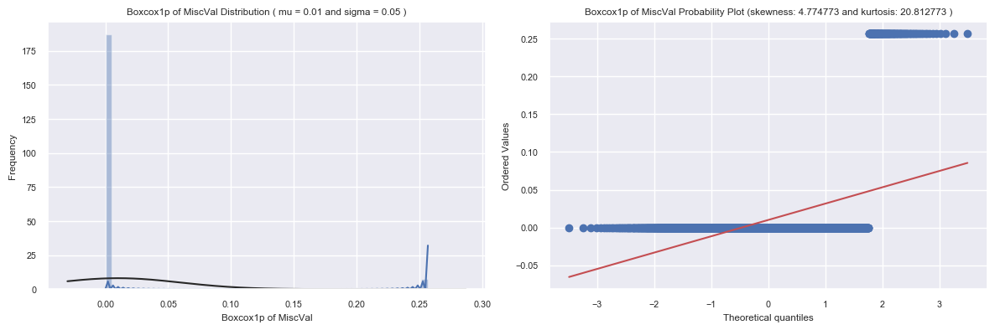

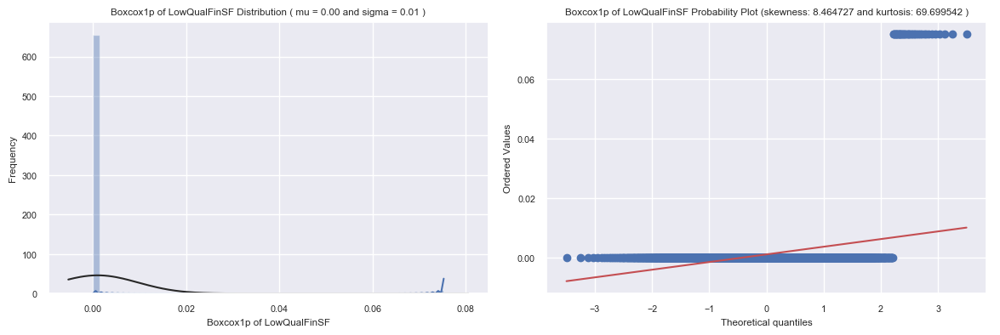

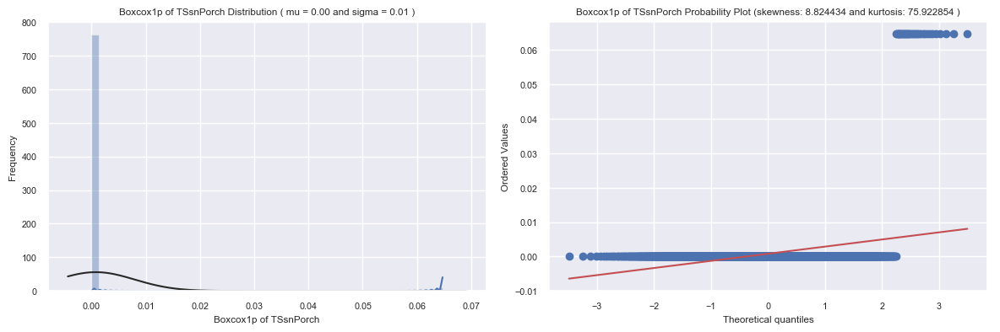

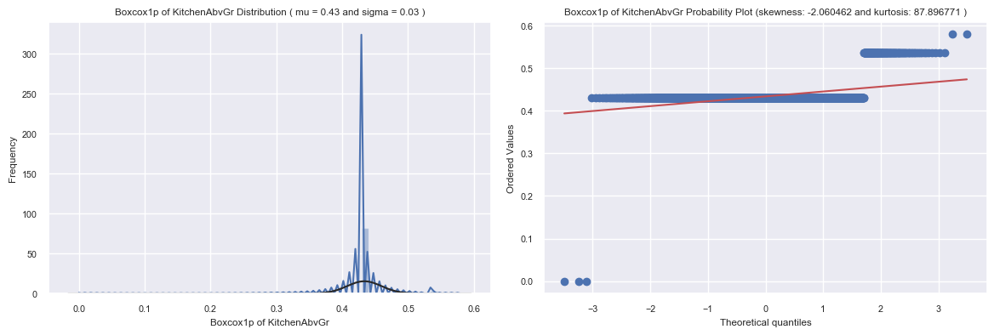

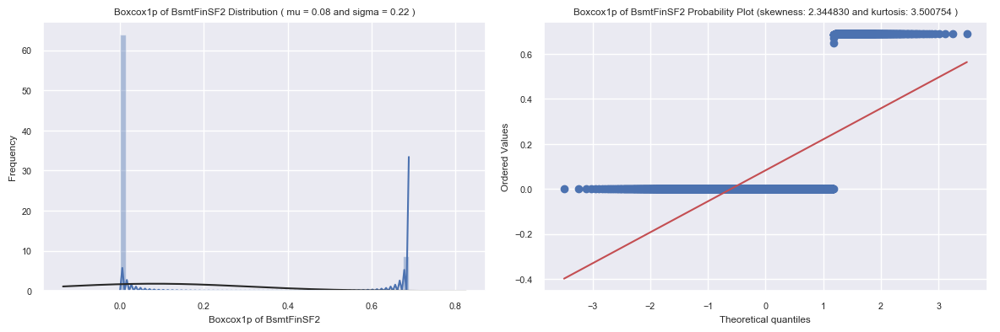

...

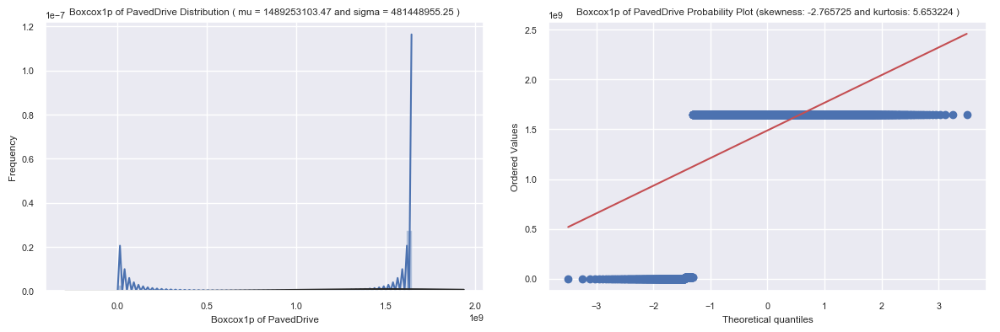

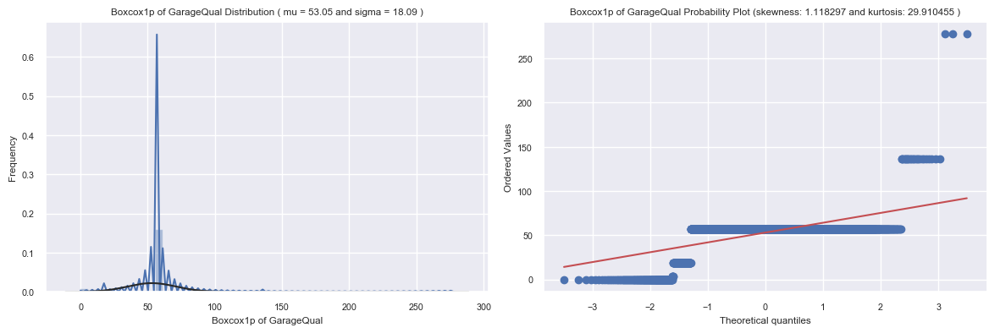

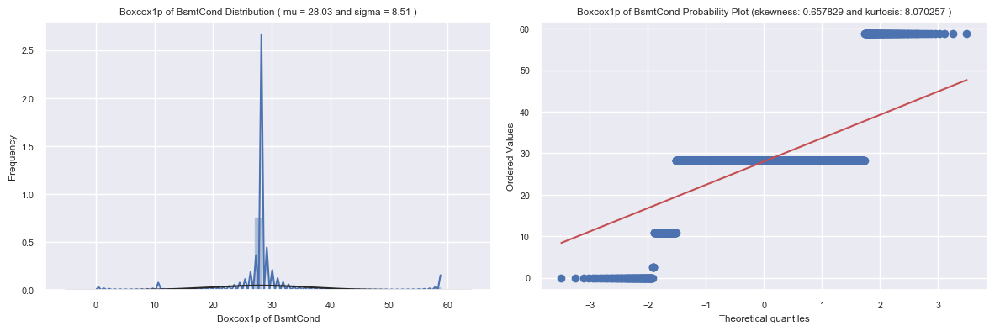

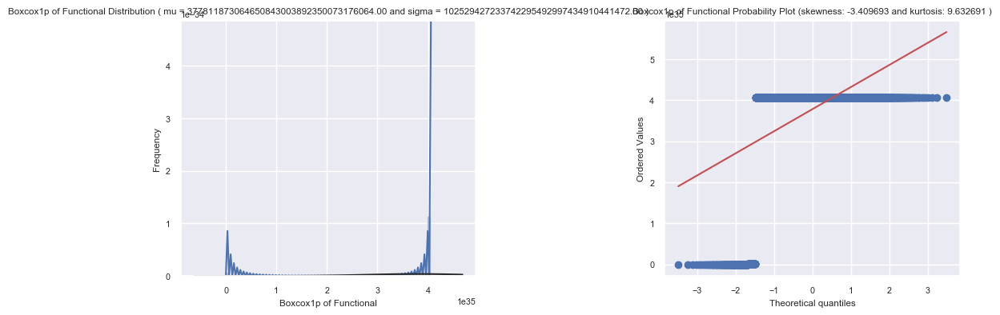

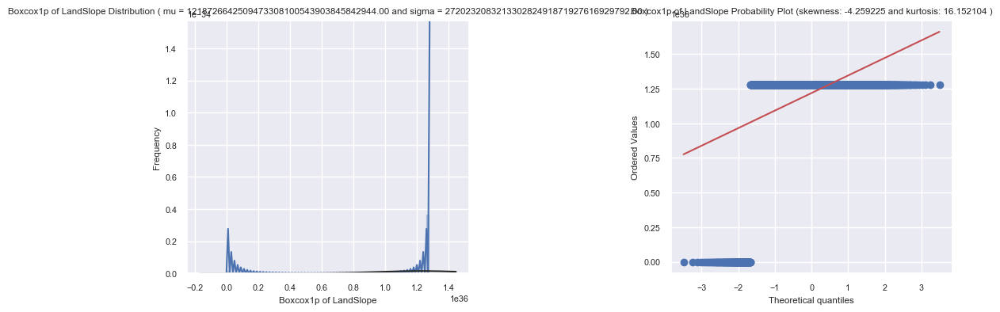

In [88]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(all_data[feat], ('Boxcox1p of {}'.format(feat)))

In [ ]:
all_data.mean

## Evaluate Apply Polyfit at the more Correlated Features 

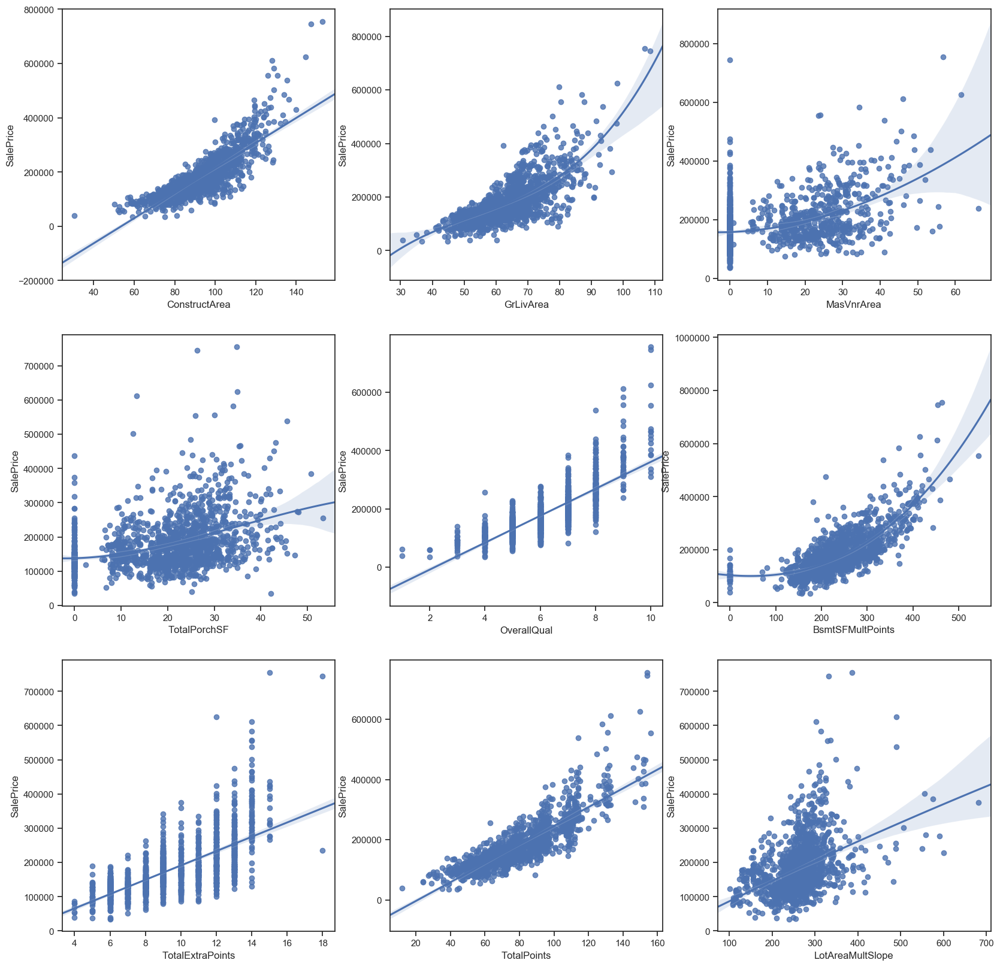

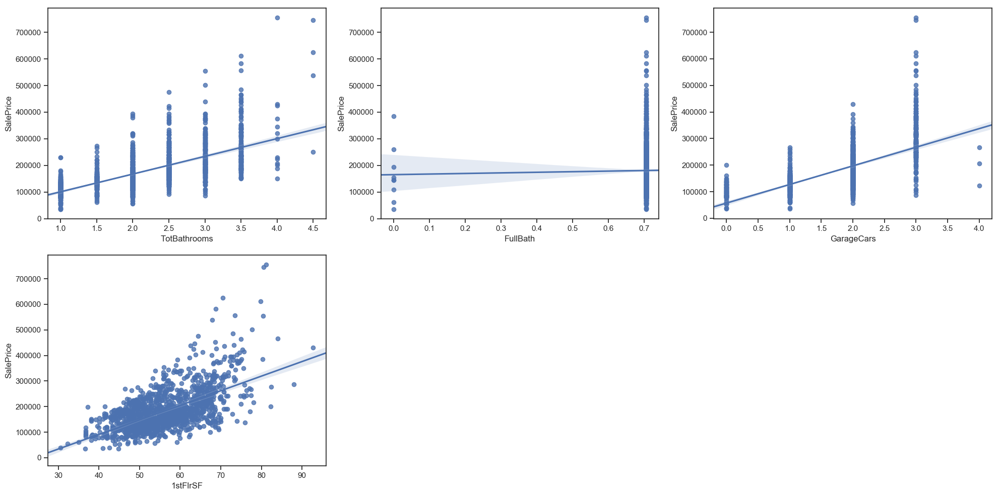

In [85]:
# Area review
fig = plt.figure(figsize=(20,20))
fig1 = fig.add_subplot(331); g = sns.regplot(y='SalePrice', x='ConstructArea', data = df, order=1) 

fig2 = fig.add_subplot(332); g = sns.regplot(y='SalePrice', x='GrLivArea', data = df, order=3) 

fig3 = fig.add_subplot(333); g = sns.regplot(y='SalePrice', x='MasVnrArea', data = df, order=3)

fig4 = fig.add_subplot(334); g = sns.regplot(y='SalePrice', x='TotalPorchSF', data = df, order=3)

# Points review
fig5 = fig.add_subplot(335); g = sns.regplot(y='SalePrice', x='OverallQual', data = df, order=1) # 4

fig6 = fig.add_subplot(336); g = sns.regplot(y='SalePrice', x='BsmtSFMultPoints', data = df, order=3) #3

fig7 = fig.add_subplot(337); g = sns.regplot(y='SalePrice', x='TotalExtraPoints', data = df, order=1) #4

fig8 = fig.add_subplot(338); g = sns.regplot(y='SalePrice', x='TotalPoints', data = df, order=1) # 3

fig9 = fig.add_subplot(339); g = sns.regplot(y='SalePrice', x='LotAreaMultSlope', data = df, order=2) # 3

figb = plt.figure(figsize=(20,10))

fig10 = figb.add_subplot(231); g = sns.regplot(y='SalePrice', x='TotBathrooms', data = df, order=1)

fig11 = figb.add_subplot(232); g = sns.regplot(y='SalePrice', x='FullBath', data = df, order=1)

fig12 = figb.add_subplot(233); g = sns.regplot(y='SalePrice', x='GarageCars', data = df, order=1)

fig13 = figb.add_subplot(234); g = sns.regplot(y='SalePrice', x='1stFlrSF', data = df, order=1)

plt.tight_layout()

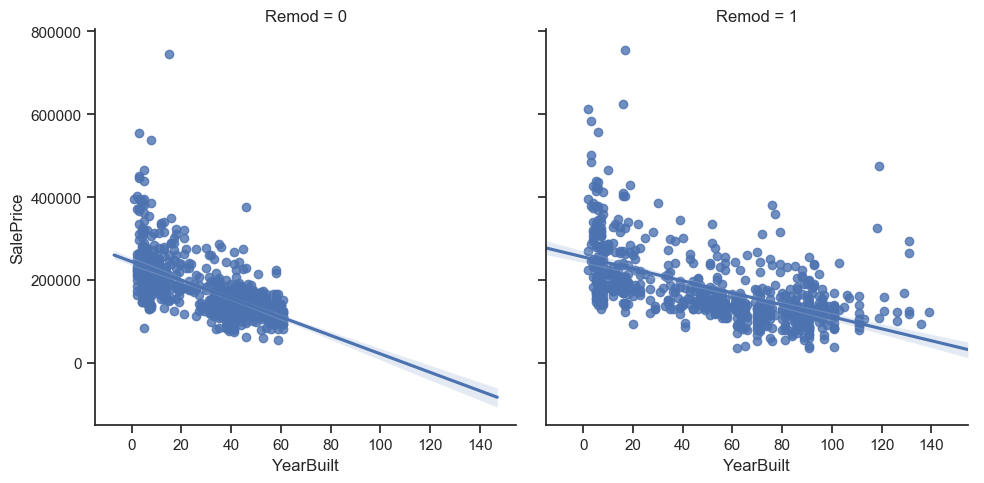

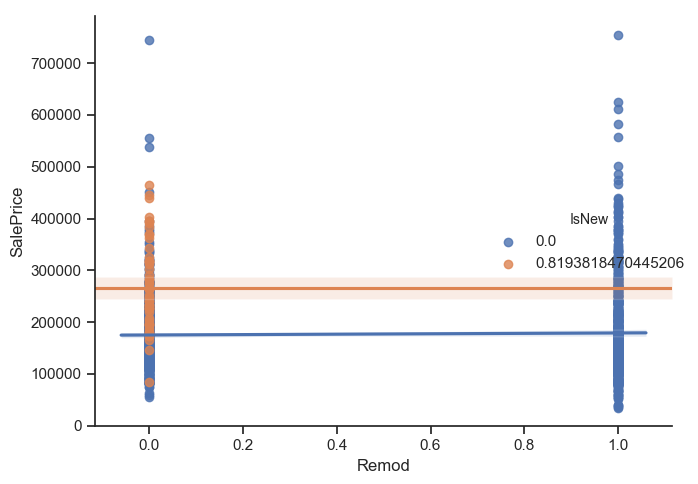

In [86]:
g = sns.lmplot(y='SalePrice', x='YearBuilt', data = df, col='Remod', aspect=1.0)
g = sns.lmplot(y='SalePrice', x='Remod', data = df,  hue='IsNew', aspect=1.)

plt.tight_layout(); 

## Evaluating Polynomilas Options Performance
One way to account for the violation of linearity assumption is to use a polynomial regression model by adding polynomial terms:
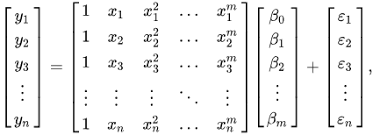
Here, d denotes the degree of the polynomial. Although we can use polynomial regression to model a nonlinear relationship, it is still considered a multiple linear regression model because of the linear regression coefficients w.

We should be aware that adding more and more polynomial features increases the complexity of a model and therefore increases the chance of overfitting.

In [87]:
def poly(X, y, feat):

    # Initializatin of regression models
    regr = LinearRegression()

    # linear fit
    regr = regr.fit(X, y)
    y_lin_fit = regr.predict(X)
    linear_r2 = r2_score(y, regr.predict(X))

    # create polynomial features
    quadratic = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
    cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
    fourth = PolynomialFeatures(degree=4, interaction_only=False, include_bias=False)
    fifth = PolynomialFeatures(degree=5, interaction_only=False, include_bias=False)
    X_quad = quadratic.fit_transform(X)
    X_cubic = cubic.fit_transform(X)
    X_fourth = fourth.fit_transform(X)
    X_fifth = fifth.fit_transform(X)

    # quadratic fit
    regr = regr.fit(X_quad, y)
    y_quad_fit = regr.predict(quadratic.fit_transform(X))
    quadratic_r2 = r2_score(y, y_quad_fit)

    # cubic fit
    regr = regr.fit(X_cubic, y)
    y_cubic_fit = regr.predict(cubic.fit_transform(X))
    cubic_r2 = r2_score(y, y_cubic_fit)

    # Fourth fit
    regr = regr.fit(X_fourth, y)
    y_fourth_fit = regr.predict(fourth.fit_transform(X))
    four_r2 = r2_score(y, y_fourth_fit)

    # Fifth fit
    regr = regr.fit(X_fifth, y)
    y_fifth_fit = regr.predict(fifth.fit_transform(X))
    five_r2 = r2_score(y, y_fifth_fit)

    # Plot lowest Polynomials
    fig = plt.figure(figsize=(20,10))
    fig1 = fig.add_subplot(121)
    plt.scatter(X[feat], y,
       label='training points',
       color='lightgray')

    plt.plot(X[feat], y_lin_fit,
        label='linear (d=1), $R^2=%.3f$' % linear_r2,
        color='blue',
        lw=0.5,
        linestyle=':')

    plt.plot(X[feat], y_cubic_fit,
        label='cubic (d=3), $R^2=%.3f$' % cubic_r2,
        color='green',
        lw=0.5,
        linestyle='--')

    plt.plot(X[feat], y_quad_fit,
        label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2,
        color='red',
        lw=0.5,
        linestyle='-')

    plt.xlabel(feat)
    plt.ylabel('Log1P Sale Price')
    plt.legend(loc='upper left')

    # Plot higest Polynomials
    fig2 = fig.add_subplot(122)
    plt.scatter(X[feat], y,
       label='training points',
       color='lightgray')

    plt.plot(X[feat], y_lin_fit,
        label='linear (d=1), $R^2=%.3f$' % linear_r2,
        color='blue',
        lw=2,
        linestyle=':')

    plt.plot(X[feat], y_fifth_fit,
        label='Fifth (d=5), $R^2=%.3f$' % five_r2,
        color='yellow',
        lw=2,
        linestyle='-')

    plt.plot(X[feat], y_fifth_fit,
        label='Fourth (d=4), $R^2=%.3f$' % four_r2,
        color='red',
        lw=2,
        linestyle=':')

    plt.xlabel(feat)
    plt.ylabel('Log1P Sale Price')
    plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

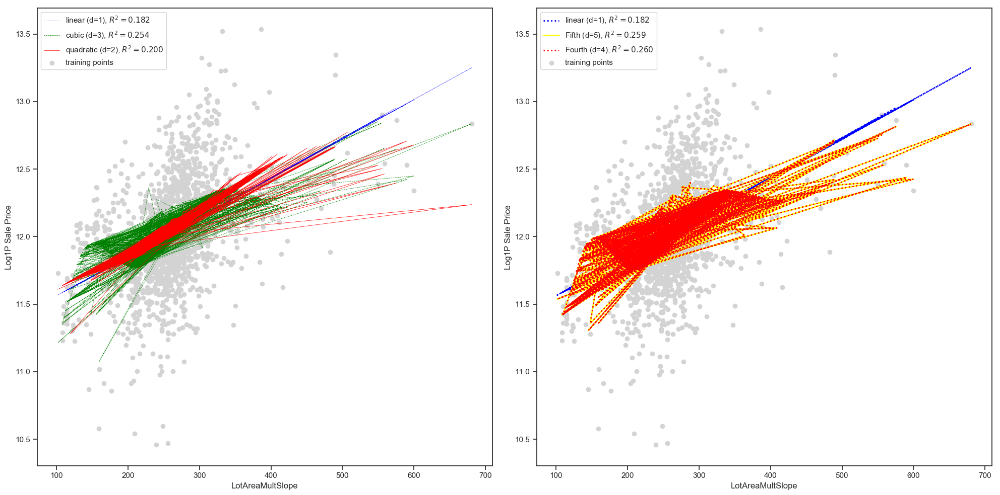

In [88]:
X = df[['ConstructArea', 'OverallQual']] 

poly(df[['LotArea', 'LandSlope','LotAreaMultSlope']], y, 'LotAreaMultSlope')

## Create Degree 3 Polynomial Features

In [75]:
pf = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
res = pf.fit_transform(all_data[['BsmtSFMultPoints']])

display(pd.DataFrame(pf.powers_, columns=['BsmtSFMultPoints']))
cols = ['BsmtSFMultPoints' , 'BsmtSFMultPoints^2' ,'BsmtSFMultPoints^3']

intr_features = pd.DataFrame(res, columns=cols)
intr_features.drop(['BsmtSFMultPoints'], axis=1, inplace=True)

all_data['BsmtSFMultPoints^2'] = all_data.BsmtSFMultPoints**2
all_data['BsmtSFMultPoints^3'] = all_data.BsmtSFMultPoints**3
#all_data['BsmtSFMultPoints^4'] = all_data.BsmtSFMultPoints**4

,BsmtSFMultPoints
0,1
1,2
2,3


# Preparing data for modeling

### Removing Dummies with few or no observations in train or test datasets

In [78]:
# Number of Training Observations
ntrain = data.shape[0]

# Find Dimmies with all test observatiosn are equal tp 0
ZeroTest = all_data[dummies][ntrain:].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in test dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

# Find Dimmies with all training observatiosn are equal to 0
ZeroTest = all_data[dummies][:ntrain].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in trainig dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

# Find Dimmies with the sum of all observatiosn is less than 10
LessTest = all_data[dummies].sum()<10
all_data.drop(dummies[LessTest], axis=1, inplace=True)
print('Dummins in trainig dataset with sum of all observatios less than 10:',len(dummies[LessTest]),'of \n',dummies[LessTest])


del ZeroTest, dummies#, LessTest

Dummins in test dataset with all observatios equal to 0: 13 of 
 Index(['Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn',
       'HouseStyle_2.5Fin', 'RoofMatl_Membran', 'RoofMatl_Metal',
       'RoofMatl_Roll', 'Exterior1st_ImStucc', 'Exterior1st_Stone',
       'Exterior2nd_Other', 'Heating_Floor', 'Heating_OthW', 'Electrical_Mix'],
      dtype='object') 

Dummins in trainig dataset with all observatios equal to 0: 1 of 
 Index(['MSSubClass_150'], dtype='object') 

Dummins in trainig dataset with sum of all observatios less than 10: 25 of 
 Index(['MSSubClass_40', 'Condition1_RRNe', 'Condition1_RRNn',
       'Condition2_Artery', 'Condition2_PosA', 'Condition2_PosN',
       'RoofStyle_Shed', 'RoofMatl_WdShake', 'RoofMatl_WdShngl',
       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CBlock',
       'Exterior2nd_AsphShn', 'Exterior2nd_CBlock', 'Exterior2nd_Stone',
       'Foundation_Wood', 'Heating_Grav', 'Heating_Wall', 'Electrical_FuseP',
       'MiscFeature_Gar2',

# Separete Trainig and Test Datasets and Dependent Variabel

In [79]:
#all_data.drop(['YearRemodAdd', 'GarageYrBlt', 'GarageArea', 'GarageCars', 'GarageCond'], axis=1, inplace=True) 
#all_data.drop(['WoodDeckSF','TotRmsAbvGrd','1stFlrSF', 'TotalBsmtSF', 'BsmtFinSF1'], axis=1, inplace=True)

In [131]:
#ntrain = data.shape[0]
train = all_data.loc[(all_data.SalePrice>0), :].reset_index(drop=True, inplace=False)
y_train = np.log1p(train.SalePrice)
train = train.drop(['SalePrice', 'Id'], axis=1)
test = all_data.loc[(all_data.SalePrice==0), :].reset_index(drop=True, inplace=False)
Test_ID = test.Id
test = test.drop(['SalePrice', 'Id'], axis=1)


# Select Features

## Prepare Data to Select Features

In [132]:
cols = train.columns

scale = RobustScaler()
df = scale.fit_transform(train)

In [133]:
df.shape

(1449, 252)

## Select Features by Model

In [134]:
rfc = RandomForestRegressor(max_depth = 20, min_samples_leaf = 1, min_samples_split = 2, n_estimators = 1000, 
                            criterion = 'mae', random_state=101)
rfc.fit(df, y_train)

feature_importances = [(feature, score) for feature, score in zip(cols, rfc.feature_importances_)]

sfm = cols[rfc.feature_importances_>0.005]
print(len(sfm))
sorted(feature_importances, key=lambda x: -x[1])[:10]

17


[('TtlVal_AsrYr', 0.6942206240553248),
 ('TotalPoints', 0.03468369982615547),
 ('ConstructArea', 0.03095506463358753),
 ('YearBuilt', 0.010644371001614954),
 ('BsmtSFMultPoints', 0.010448183216260691),
 ('LotAreaMultSlope', 0.009729008058680261),
 ('BsmtUnfSF', 0.00952741448162398),
 ('GarageArea_x_Car', 0.009063861413836333),
 ('PID', 0.008763179955898868),
 ('YearRemodAdd', 0.00771044647357742)]

In [137]:
sfm

Index(['LotFrontage', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1',
       'BsmtUnfSF', 'SndFlrSF', 'OpenPorchSF', 'MoSold', 'PID', 'TtlVal_AsrYr',
       'TotalPoints', 'GarageArea_x_Car', 'ConstructArea', 'TotalPorchSF',
       'LotAreaMultSlope', 'BsmtSFMultPoints'],
      dtype='object')

## Select Features by Statistical Methods: f_regression

In [140]:
from sklearn.feature_selection import f_regression, SelectKBest

skb = SelectKBest(score_func=f_regression, k=50)
skb.fit(df, y_train)

select_features_kbest = skb.get_support()
feature_names_kbest = cols[select_features_kbest]

print(feature_names_kbest)

feature_scores = [(item, score) for item, score in zip(cols, skb.scores_)]
(sorted(feature_scores, key=lambda x: -x[1])[:30])

Index(['LotFrontage', 'LotShape', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'ExterQual', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'HeatingQC', 'CentralAir', 'SndFlrSF', 'HalfBath',
       'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'GarageFinish',
       'GarageQual', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'TxD_S',
       'TtlVal_AsrYr', 'TotalExtraPoints', 'TotalPoints', 'GarageArea_x_Car',
       'ConstructArea', 'Garage_Newest', 'TotalPorchSF', 'LotAreaMultSlope',
       'BsmtSFMultPoints', 'TotBathrooms', 'MSZoning_RL', 'MSZoning_RM',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Exterior2nd_VinylSd',
       'MasVnrType_None', 'MasVnrType_Stone', 'Foundation_CBlock',
       'Foundation_PConc', 'Electrical_SBrkr', 'GarageType_Attchd',
       'GarageType_Detchd', 'GarageType_NA', 'SaleType_New',
       'ClassSc_S_1STORY1945OLDER', 'ClassSc_S_2STORY1946NEWER'],
      dtype='object')


[('TtlVal_AsrYr', 5512.46109771451),
 ('TotalPoints', 4285.960292944165),
 ('ConstructArea', 3960.5460617980334),
 ('BsmtSFMultPoints', 1823.0938347338783),
 ('TotalExtraPoints', 1610.2487296104994),
 ('GarageArea_x_Car', 1404.8142373150822),
 ('TotBathrooms', 1280.6205706165688),
 ('ExterQual', 1264.282287371564),
 ('KitchenQual', 1194.3779657944222),
 ('BsmtQual', 883.5590688903592),
 ('GarageFinish', 853.721964765494),
 ('YearBuilt', 761.7356878137555),
 ('YearRemodAdd', 677.0916589096554),
 ('TotRmsAbvGrd', 615.2254043839087),
 ('Foundation_PConc', 567.3736225811895),
 ('Fireplaces', 462.9948678297886),
 ('HeatingQC', 417.2090385245116),
 ('MasVnrArea', 332.9894938904979),
 ('GarageType_Attchd', 303.08924173138973),
 ('ClassSc_S_2STORY1946NEWER', 286.71959454488103),
 ('TotalPorchSF', 274.482463759803),
 ('LotAreaMultSlope', 264.2544033834327),
 ('BsmtFinSF1', 260.8646258091309),
 ('GarageType_Detchd', 256.01050381682234),
 ('MasVnrType_None', 251.13322114965163),
 ('LotFrontage', 

## Select Features by Recursive Feature Elimination

In [139]:
# Only 3 of those most important variables are categorical according to RF; Neighborhood, MSSubClass, and GarageType.
from sklearn.feature_selection import RFE

ls = Lasso(alpha = 0.0005, max_iter = 161, selection = 'cyclic', tol = 0.002, random_state = 101)

rfe = RFE(estimator=ls, n_features_to_select=50, step=1)
rfe.fit(df, y_train)

select_features_rfe = rfe.get_support()
feature_names_rfe = cols[select_features_rfe]
print(feature_names_rfe)

Index(['OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterCond',
       'BsmtUnfSF', 'HeatingQC', 'CentralAir', 'SndFlrSF', 'HalfBath',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'GarageQual', 'WoodDeckSF', 'PoolQC', 'TtlVal_AsrYr',
       'TotalExtraPoints', 'TotalPoints', 'ConstructArea', 'LotAreaMultSlope',
       'BsmtSFMultPoints', 'MSZoning_Call', 'MSZoning_FV', 'MSZoning_RM',
       'Alley_Pave', 'LotConfig_CulDSac', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_MeadowV', 'Neighborhood_StoneBr', 'Condition1_Artery',
       'Condition1_Norm', 'Exterior1st_BrkFace', 'Exterior1st_HdBoard',
       'Exterior1st_MetalSd', 'Exterior1st_WdSdng', 'MasVnrType_Stone',
       'Foundation_PConc', 'Heating_GasW', 'SaleType_New', 'SaleType_WD',
       'SaleCondition_Abnorml', 'SaleCondition_Normal',
       'ClassSc_S_1STORY1945OLDER', 'ClassSc_S_2STORY1945OLDER',
       'Cl

## Combine Features Selection Methods:

In [141]:
bcols = set(feature_names_kbest).union(set(feature_names_rfe).union(set(sfm)))

print(len(bcols))
print(bcols.intersection)

80
<built-in method intersection of set object at 0x000001EEF6ECC4A8>


In [ ]:
train = train[list(bcols)]
test = test[list(bcols)]

## PCA evaluetion:

In [81]:
scale = RobustScaler() 
df = scale.fit_transform(train)

pca = PCA().fit(df) # whiten=True
print('{:6.4%}'.format(sum(pca.explained_variance_ratio_)),"%\n")

find = 0
best = df.shape[1]

for i in np.arange(df.shape[1], 0, -1):
    variance_ratio = sum(pca.explained_variance_ratio_[:i])*100
    if variance_ratio < 99.99 and variance_ratio > 99.9 and find == 0:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        find += 1
    if variance_ratio < 99.1 and variance_ratio >= 99.000 and find == 1:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        best = i
        find += 1
    if variance_ratio < 98.2 and variance_ratio >= 98.0 and find == 2:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        find += 1
    if variance_ratio < 97.1 and variance_ratio >= 97.0 and find == 3:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        find += 1
    if variance_ratio < 96.1 and variance_ratio >= 96.0 and find == 4:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        find += 1
    if variance_ratio < 95.2 and variance_ratio >= 95.0:
        print('{:6.4f}% from {:3}'.format(variance_ratio, i))
        break

#pca = PCA(n_components=best).fit(X_s)
print('After PCA, {:3} features only not explained {:6.4%} of variance ratio from the original {:3}'.format(best,
                                                                                    (1 - sum(pca.explained_variance_ratio_[:best])),
                                                                                    df.shape[1]))
#del df, explorator, all_data

100.0000% %

99.9891% from 176
99.0836% from  75
98.1922% from  51
97.0499% from  35
96.0036% from  26
95.0096% from  20
After PCA,  75 features only not explained 0.9164% of variance ratio from the original 214


## 4.  Modeling 
First, we strat to looking at different approaches to implement linear regression models, and use hiperparametrization, cross validattion and compare the results between diferents erros measures.

### Model Hiperparametrization
#### Evaluete Results
**Mean Squared Error (MSE)**
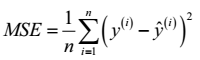
Which is simply the average value of the SSE cost function that we minimize to fit the linear regression model. The MSE is useful to for comparing different regression models or for tuning their parameters via a grid search and cross-validation.

**Coefficient of determination ( R2 )**
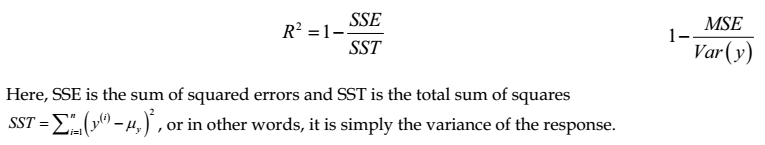
Which can be understood as a standardized version of the MSE, for better interpretability of the model performance. In other words, R2 is the fraction of response variance that is captured by the model. 

For the training dataset, R2 is bounded between 0 and 1, but it can become negative for the test set. If R2 =1 , the model fits the data perfectly with a corresponding MSE = 0 .

In [82]:
def get_results(model, name='NAN'):
    
    rcols = ['Name','Model', 'BestParameters', 'Scorer', 'Index', 'BestScore', 'BestScoreStd', 'MeanScore', 'MeanScoreStd', 'Best']
    res = pd.DataFrame(columns=rcols)
    
    results = model.cv_results_
    modelo = model.best_estimator_

    scoring = {'MEA': 'neg_mean_absolute_error', 'R2': 'r2', 'RMSE': 'neg_mean_squared_error'}

    for scorer in sorted(scoring):
        best_index = np.nonzero(results['rank_test_%s' % scoring[scorer]] == 1)[0][0]
        if scorer == 'RMSE': 
            best = np.expm1(np.sqrt(-results['mean_test_%s' % scoring[scorer]][best_index]))
            best_std = np.expm1(np.sqrt(results['std_test_%s' % scoring[scorer]][best_index]))
            scormean = np.expm1(np.sqrt(-results['mean_test_%s' % scoring[scorer]].mean()))
            stdmean = np.expm1(np.sqrt(results['std_test_%s' % scoring[scorer]].mean()))
        elif scorer == 'MEA':
            best = np.expm1(-results['mean_test_%s' % scoring[scorer]][best_index])
            best_std = np.expm1(results['std_test_%s' % scoring[scorer]][best_index])
            scormean = np.expm1(-results['mean_test_%s' % scoring[scorer]].mean())
            stdmean = np.expm1(results['std_test_%s' % scoring[scorer]].mean())
        else:
            best = results['mean_test_%s' % scoring[scorer]][best_index]*100
            best_std = results['std_test_%s' % scoring[scorer]][best_index]*100
            scormean = results['mean_test_%s' % scoring[scorer]].mean()*100
            stdmean = results['std_test_%s' % scoring[scorer]].mean()*100
        
        r1 = pd.DataFrame([(name, modelo, model.best_params_, scorer, best_index, best, best_std, scormean, stdmean, model.best_score_)],
                          columns = rcols)
        res = res.append(r1)
        
            
    print("Best Score: {:.6f}".format(np.expm1(np.sqrt(-model.best_score_))))
    print('---------------------------------------')
    print('Best Parameters:')
    print(model.best_params_)
    
    return res

### Residuals Plots
The plot of differences or vertical distances between the actual and predicted values. Commonly used graphical analysis for diagnosing regression models to detect nonlinearity and outliers, and to check if the errors are randomly distributed.
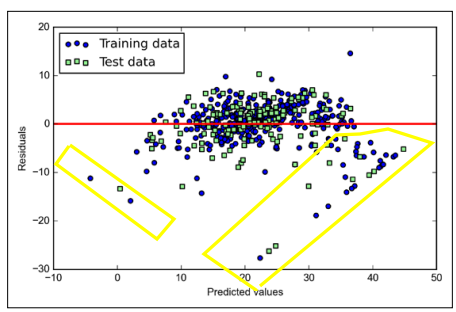
  - For a good regression model, we would expect that the errors are randomly distributed and the residuals should be randomly scattered around the centerline
  - If we see patterns in a residual plot, it means that our model is unable to capture some explanatory information
  - Detect outliers, which are represented by the points with a large deviation from the centerline.

In [83]:
def resilduals_plots(lr, X):
    y_pred = lr.predict(X)
    plt.scatter(y_pred, y_pred - y_train, c='blue', marker='o', label='Training data')
    #plt.scatter(y_test_pred, y_test_pred - y_test, c='lightgreen', marker='s', label='Test data')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    #plt.legend(loc='upper left')
    plt.hlines(y=0, xmin=10, xmax=15, lw=2, color='red')
    plt.xlim([10, 15])
    plt.show()

## Model Hiperparametrization
### Lasso (Least Absolute Shrinkage and Selection Operator)
An alternative approach that can lead to sparse models.
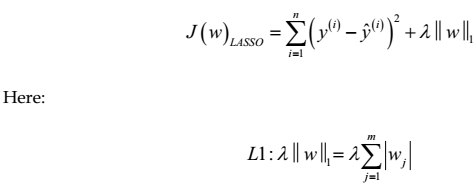
Depending on the regularization strength, certain weights can become zero, which makes the LASSO also useful as a supervised feature selection technique:

However, a limitation of the LASSO is that it selects at most n variables if m > n .

Fitting 6 folds for each of 1 candidates, totalling 6 fits
Best Score: 0.111673
---------------------------------------
Best Parameters:
{'model__alpha': 0.0003, 'model__max_iter': 157, 'model__selection': 'random', 'model__tol': 0.002}


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    2.4s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,0.075831,0.003511,0.075831,0.003511
0,R2,0,92.979593,0.845291,92.979593,0.845291
0,RMSE,0,0.111673,0.045744,0.111673,0.045744


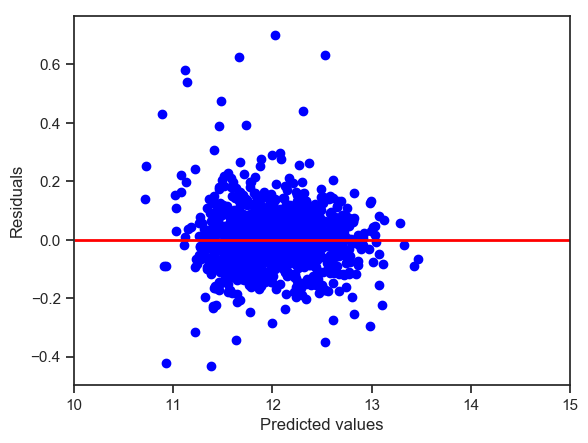

In [84]:
lasso = Pipeline([
    ('scl', RobustScaler()), #  StandardScaler()), # 
    #('pca', PCA(n_components=5, random_state = 101)),
    #('pol', PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)),
    ('model', Lasso(random_state = 101))
])

max_iter = [157] # np.arange(145, 166) #[50, 100, 165, 188, 200, 315, 230, 254, 300, 350, 400, 450, 522, 650, 750, 900, 1000]  
alpha = [0.0003]#, 0.0001, 0.0005, 0.05, 0.5, 1.0]
selection = ['random'] #'cyclic', 
tol = [2e-03]#,0.0003, 0.0001, 0.0005]

reg = GridSearchCV(estimator = lasso, 
                   param_grid = dict(
                      model__alpha = alpha
                      ,model__max_iter = max_iter
                      ,model__selection = selection
                      ,model__tol = tol
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg.fit(train, y_train)
results = get_results(reg, 'reg lasso')
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
resilduals_plots(reg.best_estimator_, train)

### XGBRegressor

In [85]:
XGBR = Pipeline([
    ('scl', RobustScaler()),
    ('model', XGBRegressor(base_score=0.5, colsample_bylevel=1,
       colsample_bytree=1, gamma=0, max_delta_step=0, random_state=101,
       min_child_weight=1, missing=None, n_jobs=3, nthread=None, 
       scale_pos_weight=1, seed=None, silent=True, subsample=1))])

n_est = [3000] # [500, 750, 1000, 2000, 2006] # np.arange(1997, 2009, 3) # 
max_depth = [3, 2, 4]
learning_rate = [0.01, 0.001] #, 0.1, 0.05
reg_lambda = [0.1] # 1, 1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 1e-01, 0.0] 
reg_alpha= [0.005]#, 0.001] #, 0.001] # , 0.5, 1, 0.0]
booster = ['dart'] #,'gblinear'] #  estora
objective = ['reg:tweedie'] # , 'reg:linear', 'reg:gamma']

reg2 = GridSearchCV(estimator = XGBR, 
                   param_grid = dict(
                      model__n_estimators= n_est
                      #,pca__n_components = n_components
                      #,pca__whiten = whiten 
                      ,model__booster = booster
                      ,model__objective = objective
                      ,model__learning_rate = learning_rate
                      ,model__reg_lambda = reg_lambda
                      ,model__reg_alpha = reg_alpha
                      ,model__max_depth = max_depth
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=2, n_jobs=3)

reg2.fit(train, y_train)
res = get_results(reg2, 'reg2 XGBRegressor')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 6 candidates, totalling 36 fits


[Parallel(n_jobs=3)]: Done  36 out of  36 | elapsed: 40.1min finished


Best Score: 0.120276
---------------------------------------
Best Parameters:
{'model__booster': 'dart', 'model__learning_rate': 0.01, 'model__max_depth': 2, 'model__n_estimators': 3000, 'model__objective': 'reg:tweedie', 'model__reg_alpha': 0.005, 'model__reg_lambda': 0.1}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,1,0.081803,0.003006,1.008379,0.005228
0,R2,1,91.916157,0.821378,-463.114485,62.816776
0,RMSE,1,0.120276,0.047240,1.562317,0.102091


### Random Forest Regressor Hiperparametrization

In [ ]:
RF = Pipeline([
    ('scl', RobustScaler()),
    ('model', RandomForestRegressor(criterion = 'mae', random_state=101))
    ])

n_estimators = [100, 1000] #np.arange(50, 90, 2) 
max_depth  = [2, 3, 5] #, 3, 4, 5, 10] # 
min_samples_split = [2] #, 3, 4]
min_samples_leaf = [1] #, 2 , 3]

reg3 = GridSearchCV(estimator = RF, param_grid = dict(
                      model__n_estimators = n_estimators 
                      ,model__max_depth = max_depth
                      ,model__min_samples_split = min_samples_split
                      ,model__min_samples_leaf = min_samples_leaf
                        ) 
                      ,refit = 'neg_mean_squared_error'
                      , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                      ,cv=6, verbose=1, n_jobs=3)

reg3.fit(train, y_train)

res = get_results(reg3, 'reg3 RF')
results = pd.concat([results, res], axis=0)

res.loc[:, 'Scorer' : 'MeanScoreStd']

###  Gradient Boosting Regressor

In [165]:
'''
Other Parameters: min_samples_split=2, loss='ls', subsample=1.0, criterion='friedman_mse', 
     min_samples_leaf=1, min_weight_fraction_leaf=0.0, min_impurity_decrease=0.0, min_impurity_split=None, 
     init=None, max_features=None, alpha=0.9, max_leaf_nodes=None, warm_start=False, presort='auto'
loss = ['ls', 'lad', 'huber', 'quantile'] huber is de combination of ls and land, ls is the default
If int, then consider max_features features at each split.
If float, then max_features is a percentage and int(max_features * n_features) features are considered at each split.
If “auto”, then max_features=n_features.
If “sqrt”, then max_features=sqrt(n_features).
If “log2”, then max_features=log2(n_features).
If None, then max_features=n_features.
'''
my_model = Pipeline([
    #('scl', RobustScaler()),
    ('model', GradientBoostingRegressor(random_state=101))
    ])

n_est = [100, 1625, 2000] #[1620, 1625, 1630] # np.arange(1621, 1630, 1)  
learning_rate = [0.05 , 0.01, 0.1] #, 0.005]#, 0.001]
loss = ['huber'] #, 'ls', 'lad', 'quantile']
max_features = ['sqrt'] #, 'auto', 'log2']
max_depth = [3, 2 , 4] # , 5]
min_samples_split = [4, 2, 3, 10] 
min_samples_leaf = [2, 15] # , 3, 2 ,4 ]
criterion = ['friedman_mse'] #, 'mse', 'mae']
alpha = [0.889] #, 0.89, 0.888]

reg4 = GridSearchCV(estimator = my_model, param_grid = dict(
                       model__n_estimators= n_est 
                      ,model__learning_rate = learning_rate
                      ,model__loss = loss
                      ,model__criterion = criterion
                      ,model__max_depth = max_depth
                      ,model__alpha = alpha
                      ,model__max_features = max_features
                      ,model__min_samples_split = min_samples_split
                      ,model__min_samples_leaf = min_samples_leaf
                       )
                      ,refit = 'neg_mean_squared_error'
                      , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                      ,cv=6, verbose=1, n_jobs=3)

reg4.fit(train, y_train)
res = get_results(reg4, 'reg4 GBR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 216 candidates, totalling 1296 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:   49.4s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:  3.7min
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:  9.3min
[Parallel(n_jobs=3)]: Done 794 tasks      | elapsed: 16.2min
[Parallel(n_jobs=3)]: Done 1244 tasks      | elapsed: 25.1min
[Parallel(n_jobs=3)]: Done 1296 out of 1296 | elapsed: 26.4min finished


Best Score: 0.114750
---------------------------------------
Best Parameters:
{'model__alpha': 0.889, 'model__criterion': 'friedman_mse', 'model__learning_rate': 0.05, 'model__loss': 'huber', 'model__max_depth': 3, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 2, 'model__min_samples_split': 4, 'model__n_estimators': 1625}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,11,0.076191,0.003567,0.094619,0.005460
0,R2,1,92.648647,0.821298,88.120127,1.107307
0,RMSE,1,0.114750,0.050996,0.147841,0.061475


### ElasticNet
- Has a L1 penalty to generate sparsity. if we set l1_ratio to 1.0, the ElasticNet regressor would be equal to LASSO regression. Currently, l1_ratio <= 0.01 is not reliable, unless you supply your own sequence of alpha.
- alpha: Constant that multiplies the penalty terms. 
- Has a L2 penalty to overcome some of the limitations of the LASSO, such as the number of selected variables.
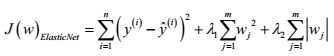


If you are interested in controlling the L1 and L2 penalty separately, keep in mind that this is equivalent to::

        a * L1 + b * L2    where:  alpha = a + b and l1_ratio = a / (a + b)

In [91]:
ELA = Pipeline([
    ('scl', RobustScaler()),
    ('model', ElasticNet(random_state=101))
])

max_iter =  np.arange(86, 115) # [75, 85, 100, 115, 125, 135, 145, 155, 165, 175]  # 
alpha = [0.001, 0.01, 0.003, 0.00001] 
l1_ratio = [0.3, 0.5, 0.2] 
selection = ['random', 'cyclic']

reg5 = GridSearchCV(estimator = ELA, 
                   param_grid = dict(
                      model__max_iter= max_iter
                      #,pca__n_components = n_components
                      #,pca__whiten = whiten 
                      ,model__alpha = alpha
                      ,model__l1_ratio = l1_ratio
                      ,model__selection = selection
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg5.fit(train, y_train)

res = get_results(reg5, 'reg5 ELA')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 696 candidates, totalling 4176 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    3.8s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    9.3s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:   18.8s
[Parallel(n_jobs=3)]: Done 794 tasks      | elapsed:   31.9s
[Parallel(n_jobs=3)]: Done 1428 tasks      | elapsed:   55.1s
[Parallel(n_jobs=3)]: Done 2528 tasks      | elapsed:  1.6min
[Parallel(n_jobs=3)]: Done 3828 tasks      | elapsed:  2.4min
[Parallel(n_jobs=3)]: Done 4176 out of 4176 | elapsed:  2.7min finished


Best Score: 0.111753
---------------------------------------
Best Parameters:
{'model__alpha': 0.001, 'model__l1_ratio': 0.3, 'model__max_iter': 97, 'model__selection': 'random'}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,38,0.075722,0.003376,0.080392,0.003491
0,R2,22,92.967419,0.856040,92.136419,1.036113
0,RMSE,22,0.111753,0.045596,0.118574,0.050183


### BayesianRidge
Ridge regression is an L2 penalized model where we simply add the squared sum of the weights to our least-squares cost function:
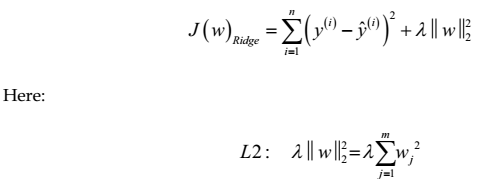
By increasing the value of the hyperparameter λ , we increase the regularization strength and shrink the weights of our model. Please note that we don't regularize the intercept term w0.

Bayesian ridge regression fit a Bayesian ridge model and optimize the regularization parameters lambda (precision of the weights) and alpha (precision of the noise).

To obtain a fully probabilistic model, the output y is assumed to be Gaussian distributed around X w:

p(y|X,w,\alpha) = \mathcal{N}(y|X w,\alpha)

Alpha is again treated as a random variable that is to be estimated from the data.

The advantages of Bayesian Regression are:
- It adapts to the data at hand.
- It can be used to include regularization parameters in the estimation procedure.
The disadvantages of Bayesian regression include:
- Inference of the model can be time consuming.

In [96]:
BayR = Pipeline([
    ('scl', RobustScaler()),
    ('model', BayesianRidge())
])

n_iter=  [5] #25, 50, 70, 100, 200, 300, 500, 700, 1000] #  np.arange(2, 50) # 
alpha_1 = [1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 0.1]
alpha_2 = [0.1, 1e-02, 1e-06, 1e-04, 1e-03, 1e-02, 0.01]
lambda_1 = [0.1, 1e-06, 1e-04, 1e-03, 1e-02, 1e-05] 
lambda_2 = [0.01, 1e-06, 1e-04, 1e-03, 1e-02, 1e-01]

reg6 = GridSearchCV(estimator = BayR, 
                   param_grid = dict(
                       model__n_iter = n_iter
                      ,model__alpha_1 = alpha_1
                      ,model__alpha_2 = alpha_2
                      ,model__lambda_1 = lambda_1
                      ,model__lambda_2 = lambda_2
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg6.fit(train, y_train)
res = get_results(reg6, 'reg6 BayR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 1512 candidates, totalling 9072 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    8.3s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:   15.7s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:   27.1s
[Parallel(n_jobs=3)]: Done 794 tasks      | elapsed:   42.3s
[Parallel(n_jobs=3)]: Done 1244 tasks      | elapsed:  1.1min
[Parallel(n_jobs=3)]: Done 1794 tasks      | elapsed:  1.5min
[Parallel(n_jobs=3)]: Done 2444 tasks      | elapsed:  2.0min
[Parallel(n_jobs=3)]: Done 3194 tasks      | elapsed:  2.5min
[Parallel(n_jobs=3)]: Done 4044 tasks      | elapsed:  3.3min
[Parallel(n_jobs=3)]: Done 4994 tasks      | elapsed:  4.0min
[Parallel(n_jobs=3)]: Done 6044 tasks      | elapsed:  4.9min
[Parallel(n_jobs=3)]: Done 7194 tasks      | elapsed:  5.8min
[Parallel(n_jobs=3)]: Done 8444 tasks      | elapsed:  6.8min
[Parallel(n_jobs=3)]: Done 9072 out of 9072 | elapsed:  7.4min finished


Best Score: 0.114598
---------------------------------------
Best Parameters:
{'model__alpha_1': 0.1, 'model__alpha_2': 0.01, 'model__lambda_1': 1e-06, 'model__lambda_2': 0.01, 'model__n_iter': 5}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,0.077313,0.002936,0.077359,0.002957
0,R2,1338,92.616292,0.981532,92.609412,0.981173
0,RMSE,1302,0.114598,0.046843,0.114661,0.046955


## LinearRegression

In [88]:
LR = Pipeline([
    ('scl', RobustScaler()), # StandardScaler()), #
    ('pca', PCA(random_state=101)),
    ('model', LinearRegression())
])

n_components= [75, 176, 190, 214]
whiten = [True, False]

reg7 = GridSearchCV(estimator = LR, 
                   param_grid = dict(
                       pca__n_components = n_components,
                       pca__whiten = whiten
                       #model__fit_intercept = [True]
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg7.fit(train, y_train)

res = get_results(reg7, 'reg7 LR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 8 candidates, totalling 48 fits
Best Score: 0.116778
---------------------------------------
Best Parameters:
{'pca__n_components': 176, 'pca__whiten': True}


[Parallel(n_jobs=3)]: Done  48 out of  48 | elapsed:    6.1s finished
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in expm1
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in expm1
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in expm1
  app.launch_new_instance()
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in expm1


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,3,0.078885,0.003193,inf,inf
0,R2,2,92.360247,0.874815,-4.164905e+23,7.523876e+23
0,RMSE,2,0.116778,0.047574,inf,inf


## OrthogonalMatchingPursuit

In [89]:
ORT = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state=101)),
    ('model', OrthogonalMatchingPursuit())
])

n_components= [75, 176, 190, 214]
whiten = [True, False]

tol = [0.00005, 0.0001, 0.00000, 0.002]

reg8 = GridSearchCV(estimator = ORT, 
                   param_grid = dict(
                       model__tol = tol
                       ,pca__n_components = n_components
                       ,pca__whiten = whiten
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg8.fit(train, y_train)
res = get_results(reg8, 'reg8 ORT')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 32 candidates, totalling 192 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    5.5s
[Parallel(n_jobs=3)]: Done 192 out of 192 | elapsed:   17.0s finished
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in expm1
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in expm1


Best Score: 0.116778
---------------------------------------
Best Parameters:
{'model__tol': 5e-05, 'pca__n_components': 176, 'pca__whiten': True}


C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in expm1
  app.launch_new_instance()
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in expm1


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,2,0.078885,0.003193,inf,inf
0,R2,2,92.360247,0.874815,-8.329573e+23,1.504724e+24
0,RMSE,2,0.116778,0.047574,inf,inf


## HuberRegressor

In [103]:
Hub = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state=101)),
    ('model', HuberRegressor())
])

n_components= [176]
whiten = [True]

max_iter = [30, 1000] # [105, 115, 125, 150] # 
alpha = [0.01, 0.00005, 0.0005, 0.5, 0.001, 0.0001] #, 1.0]
epsilon = [1.005, 1.01, 1.001, 1.05] 
tol = [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06] # 1.0] # 

reg9 = GridSearchCV(estimator = Hub, 
                   param_grid = dict(
                      model__max_iter= max_iter
                      ,pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__alpha = alpha
                      ,model__epsilon = epsilon
                      ,model__tol = tol
                   ) 
                   ,refit = 'neg_mean_squared_error'
                    ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg9.fit(train, y_train)

res = get_results(reg9, 'reg9 Hub')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 288 candidates, totalling 1728 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:   22.9s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:  1.6min
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:  3.7min
[Parallel(n_jobs=3)]: Done 794 tasks      | elapsed:  6.4min
[Parallel(n_jobs=3)]: Done 1244 tasks      | elapsed:  9.6min
[Parallel(n_jobs=3)]: Done 1728 out of 1728 | elapsed: 13.5min finished


Best Score: 0.113484
---------------------------------------
Best Parameters:
{'model__alpha': 0.0005, 'model__epsilon': 1.01, 'model__max_iter': 30, 'model__tol': 0.1, 'pca__n_components': 176, 'pca__whiten': True}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,108,0.074882,0.003142,0.075296,0.003148
0,R2,108,92.747279,0.853557,92.681207,0.847628
0,RMSE,108,0.113484,0.044812,0.114035,0.044968


## ARDRegression

In [ ]:
ARDR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', ARDRegression())
])

n_components= [75, 176, 191, 214]
whiten = [False, True] 


n_iter=  [4] # [12, 300] # [25, 50, 70] # np.arange(2, 70)
alpha_1 = [1e-06, 1e-05, 1e-03]
alpha_2 = [1e-01, 1e-2, 1e-06]#, 1e-04, 1e-03]
lambda_1 = [0.1, 1e-02, 1e-3]#, 1e-04, 1e-05]
lambda_2 = [1e-3, 1e-02, 1e-06]#, 1e-04, 0.1]

reg10 = GridSearchCV(estimator = ARDR, 
                   param_grid = dict(
                       pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__n_iter = n_iter
                      ,model__alpha_1 = alpha_1
                      ,model__alpha_2 = alpha_2
                      ,model__lambda_1 = lambda_1
                      ,model__lambda_2 = lambda_2
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg10.fit(train, y_train)
res = get_results(reg10, 'reg10 ARDR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## PassiveAggressiveRegressor

In [108]:
n_components= [176]
whiten = [True] 

loss = ['squared_epsilon_insensitive', 'epsilon_insensitive']
C = [0.00005]#, 0.0005, 0.00001]
max_iter = [255] # 
epsilon = [0.003, 0.001, 0.0005] # If the difference between the current prediction and the correct label is below this threshold, the model is not updated.
tol = [1e-03, 1e-05,1e-02, 1e-01, 1e-04, 1e-06]
n_inter = [10] # eprecated, will be removed in 0.21.

PAR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', PassiveAggressiveRegressor(random_state = 101))
])

reg11 = GridSearchCV(estimator = PAR, 
                   param_grid = dict(
                      pca__n_components = n_components
                      ,pca__whiten = whiten, 
                      model__loss = loss
                      ,model__epsilon = epsilon
                      ,model__C = C
                      ,model__tol = tol
                      ,model__max_iter = max_iter
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg11.fit(train, y_train)
res = get_results(reg11, 'reg11 PassR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 36 candidates, totalling 216 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    7.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:   24.2s
[Parallel(n_jobs=3)]: Done 216 out of 216 | elapsed:   27.1s finished


Best Score: 0.113688
---------------------------------------
Best Parameters:
{'model__C': 5e-05, 'model__epsilon': 0.003, 'model__loss': 'epsilon_insensitive', 'model__max_iter': 255, 'model__tol': 0.0001, 'pca__n_components': 176, 'pca__whiten': True}


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,10,0.075339,0.003322,2.051747,0.005384
0,R2,10,92.731050,0.856709,-7446.539407,803.184623
0,RMSE,10,0.113688,0.046084,30.351485,0.183480


## RANSACRegressor

In [ ]:
'''
min_samples = None # Minimum number of samples chosen randomly from original data. The default is n rows + 1
residual_threshold = None # Maximum residual for a data sample to be classified as an inlier. By default the threshold is chosen as the MAD (median absolute deviation) of the target values y.
max_skips = inf # Maximum number of iterations that can be skipped due to finding zero inliers or invalid data defined by is_data_valid or invalid models defined by is_model_valid.
stop_n_inliers = inf # Stop iteration if at least this number of inliers are found.
stop_score = inf # Stop iteration if score is greater equal than this threshold.
stop_probability=0.99
'''
max_trials = [50, 100] # Maximum number of iterations for random sample selection.
loss = ['absolute_loss', 'squared_loss']

n_components= [75, 176, 191, 214]
whiten = [True, False]
  
RANSACR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', RANSACRegressor(base_estimator = reg, random_state = 101))
])

reg13 = GridSearchCV(estimator = RANSACR, 
                   param_grid = dict(
                       pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__max_trials = max_trials
                      #,model__loss = loss
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg13.fit(train, y_train)
res = get_results(reg13, 'reg13 RANSACR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## SGDRegressor

In [110]:
'''
‘constant’: eta = eta0
‘optimal’: eta = 1.0 / (alpha * (t + t0)) 
‘invscaling’: eta = eta0 / pow(t, power_t)

max_iter = None # epochs
'''
loss = ['squared_loss', 'huber'] #, 'squared_epsilon_insensitive', 'epsilon_insensitive']
penalty = ['elasticnet', 'l2' ]#, 'l1']
l1_ratio = [0.2, 0.5, 0.03]
learning_rate = ['invscaling'] # , 'constant', 'optimal']
alpha = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05]
epsilon = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05]
tol = [0.001] # , 0.003] #, 0.0001, 0.01]
eta0 = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05] 
power_t = [0.25] #, 0.5]
#max_iter = [10, 15, 12, None]

n_components= [176] #75, 176, 191, 214]
whiten = [True]
 
SGDR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', SGDRegressor(random_state = 101))
])

reg14 = GridSearchCV(estimator = SGDR, 
                   param_grid = dict(
                       pca__n_components = n_components
                       ,pca__whiten = whiten, 
                       model__penalty = penalty
                       ,model__l1_ratio = l1_ratio
                       ,model__loss = loss
                       ,model__alpha = alpha
                       ,model__epsilon = epsilon
                       ,model__tol = tol
                       ,model__eta0 = eta0
                       ,model__power_t = power_t
                       #,model__max_iter = max_iter
                       ,model__learning_rate = learning_rate
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg14.fit(train, y_train)
res = get_results(reg14, 'reg14 SGDR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 6 folds for each of 1500 candidates, totalling 9000 fits


[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    5.4s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:   22.0s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:  1.3min
[Parallel(n_jobs=3)]: Done 794 tasks      | elapsed:  2.4min
[Parallel(n_jobs=3)]: Done 1244 tasks      | elapsed:  3.5min
[Parallel(n_jobs=3)]: Done 1794 tasks      | elapsed:  5.5min
[Parallel(n_jobs=3)]: Done 2444 tasks      | elapsed:  7.1min
[Parallel(n_jobs=3)]: Done 3194 tasks      | elapsed:  9.4min
[Parallel(n_jobs=3)]: Done 4044 tasks      | elapsed: 11.8min
[Parallel(n_jobs=3)]: Done 4994 tasks      | elapsed: 14.2min
[Parallel(n_jobs=3)]: Done 6044 tasks      | elapsed: 16.8min
[Parallel(n_jobs=3)]: Done 7194 tasks      | elapsed: 20.0min
[Parallel(n_jobs=3)]: Done 8444 tasks      | elapsed: 23.0min
[Parallel(n_jobs=3)]: Done 9000 out of 9000 | elapsed: 24.7min finished


Best Score: 0.115039
---------------------------------------
Best Parameters:
{'model__alpha': 0.01, 'model__epsilon': 0.1, 'model__eta0': 0.01, 'model__l1_ratio': 0.2, 'model__learning_rate': 'invscaling', 'model__loss': 'squared_loss', 'model__penalty': 'elasticnet', 'model__power_t': 0.25, 'model__tol': 0.001, 'pca__n_components': 176, 'pca__whiten': True}


C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in expm1
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in expm1
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in expm1
  app.launch_new_instance()
C:\Users\marce\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in expm1


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,312,0.077850,0.003188,inf,inf
0,R2,312,92.581076,1.014646,-1.076286e+26,2.239513e+25
0,RMSE,312,0.115039,0.049908,inf,inf


## BaggingRegressor

In [118]:
'''
 max_samples=1.0,
 max_features=1.0,
 bootstrap=True,
 bootstrap_features=False,
 oob_score=False,

'''
n_estimators = [30] # Maximum number of iterations for random sample selection.

BAG = Pipeline([
    ('scl', RobustScaler()),
    ('model', BaggingRegressor(base_estimator = reg, random_state = 101, warm_start=False))
])

reg15 = GridSearchCV(estimator = BAG, 
                   param_grid = dict(
                      model__n_estimators = n_estimators
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg15.fit(train, y_train)
res = get_results(reg15, 'reg15 BAG')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=3)]: Done   5 out of   5 | elapsed:   44.2s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.5s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


Fitting 6 folds for each of 1 candidates, totalling 6 fits
Best Score: 0.112548
---------------------------------------
Best Parameters:
{'model__n_estimators': 30}


[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:    1.6s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,0.076269,0.000988,0.076269,0.000988
0,R2,0,92.833177,0.393462,92.833177,0.393462
0,RMSE,0,0.112548,0.027393,0.112548,0.027393


## AdaBoostRegressor
AdaBoost stands for Adaptive Boosting, and this is a technique that is used to boost the accuracy of the results from another system. This combines the outputs from different versions of the algorithms, called weak learners, using a weighted summation to get the final output. The information that's collected at each stage of the AdaBoost algorithm is fed back into the system so that the learners at the latter stages focus on training samples that are difficult to classify. This
is the way it increases the accuracy of the system.

In other words AdaBoost uses the complete training set to train the weak learners where the training samples are reweighted in each iteration to build a strong classifier that learns from the mistakes of the previous weak learners in the ensemble.

In [ ]:
n_estimators = [1000] # Maximum number of iterations for random sample selection.
learning_rate= [0.05] # 0.001, 0.01, 
loss= ['linear', 'square', 'exponential']

n_components= [45, 156, 197]
whiten = [True, False]

AdaBR = Pipeline([
    ('scl', RobustScaler()),
    #('pca', PCA(random_state = 101)),
    ('model', AdaBoostRegressor(base_estimator = reg, random_state = 101))
])

reg16 = GridSearchCV(estimator = AdaBR, 
                   param_grid = dict(
#                       pca__n_components = n_components
#                      ,pca__whiten = whiten, 
                      model__n_estimators = n_estimators
                      ,model__learning_rate = learning_rate
#                      ,model__loss = loss
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg16.fit(train, y_train)
res = get_results(reg16, 'reg16 AdaBR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## Ordinary Least Squares (OLS)
Method to estimate the parameters of the regression line that minimizes the sum of the squared vertical distances (residuals or errors) to the sample points.
The artificial neuron uses a linear activation function and we defined a cost function J (<i>w</i>) , which we minimized to learn the weights via optimization algorithms, such as Gradient Descent (GD) and Stochastic Gradient Descent (SGD). This cost function in Adaline is the Sum of Squared Errors (SSE). This is identical to the OLS cost function that we defined:
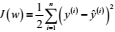
Essentially, OLS linear regression can be understood as Adaline without the unit step function (withou quantizer)so that we obtain continuous target values instead of the class labels -1 and 1. 

In [ ]:
class LinearRegressionGD(object):

    def __init__(self, eta=0.001, n_iter=20):
        self.eta = eta
        self.n_iter = n_iter

    def fit(self, X, y):
        self.w_ = np.zeros(1 + X.shape[1])
        self.cost_ = []

        for i in range(self.n_iter):
            output = self.net_input(X)
            errors = (y - output)
            self.w_[1:] += self.eta * X.T.dot(errors)
            self.w_[0] += self.eta * errors.sum()
            cost = (errors**2).sum() / 2.0
            self.cost_.append(cost)
            print('Iteration:',i, '   Cost:', cost)
        return self

    def net_input(self, X):
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def predict(self, X):
        return self.net_input(X)

In [ ]:
# We will scale the features for better convergence of the GD algorithm.
from sklearn.preprocessing import StandardScaler

scale = StandardScaler()

y_std = scale.fit_transform(y_train.reshape(-1, 1))

# we can simply apply the inverse_transform method of the StandardScaler: y_std.inverse_transform(price_std)

n_iter = [10]#, 20] # Maximum number of iterations for random sample selection.
eta = [0.001, 0.003]

n_components= [45, 156, 197]
whiten = [True, False]

OLS = Pipeline([
    ('scl', RobustScaler()),  
#    ('pca', PCA(random_state = 101)),
    ('model', LinearRegressionGD())
])

reg17 = GridSearchCV(estimator = OLS, 
                   param_grid = dict(
#                       pca__n_components = n_components
#                      ,pca__whiten = whiten, 
                      model__n_iter = n_iter
                      ,model__eta = eta
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg17.fit(train, y_std)
res = get_results(reg17, 'reg17 OLS')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']


''' 
# plot the cost against the number of epochs to check if the linear regression has converged:
plt.plot(range(1, reg17.n_iter+1), lr.cost_)
plt.ylabel('SSE')
plt.xlabel('Epoch')
plt.show()
''' 

## Tensorflow

In [ ]:
# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column.  Is it really this hard? :(
    target_type = df[target].dtypes
    target_type = target_type[0] if hasattr(target_type, '__iter__') else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        return df.as_matrix(result).astype(np.float32), dummies.as_matrix().astype(np.float32)
    else:
        # Regression
        return df.as_matrix(result).astype(np.float32), df.as_matrix([target]).astype(np.float32)
    
scaler = RobustScaler()
X = pd.DataFrame(data=scaler.fit_transform(train), index = train.index, columns = train.columns )
#X_TEST = pd.DataFrame(data=scaler.transform(test), index = test.index, columns = test.columns )

y_train = pd.DataFrame(y_train)
y_train.columns = ['SalePrice']

X = pd.concat([X, y_train], axis=1)

'''# Shuffle
np.random.seed(101)
X = X.reindex(np.random.permutation(X.index))
X.reset_index(inplace=True, drop=True)
'''
x,y = to_xy(X,'SalePrice')


In [ ]:
# Cross-Validate
kf = KFold(5)
    
oos_y = []
oos_pred = []
fold = 0
for Train, test in kf.split(x):
    fold+=1
    print("Fold #{}".format(fold))
        
    x_train = x[Train]
    y_train = y[Train]
    x_test = x[Train]
    y_test = y[Train]
    
    model = Sequential()
    model.add(Dense(258, input_dim=x.shape[1], activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(16))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    model.fit(x_train,y_train,validation_data=(x_test,y_test),callbacks=[monitor],verbose=0,epochs=1000)
    
    pred = model.predict(x_test)
    
    oos_y.append(y_test)
    oos_pred.append(pred)        

    # Measure this fold's RMSE
    score = np.sqrt(mean_squared_error(pred,y_test))
    print("Fold score (RMSE): {}".format(score))    
    
# Build the oos prediction list and calculate the error.
oos_y = np.concatenate(oos_y)
oos_pred = np.concatenate(oos_pred)
score = np.sqrt(mean_squared_error(oos_pred,oos_y))
print("Final, out of sample score (RMSE): {}".format(score))    
    
# Write the cross-validated prediction
oos_y = pd.DataFrame(oos_y)
oos_pred = pd.DataFrame(oos_pred)
oosDF = pd.concat( [df, oos_y, oos_pred],axis=1 )
oosDF.to_csv(filename_write,index=False)

## Stacking the Models

### Validation Function and Averagin Models

In [122]:
n_folds = 6

def RMSLE_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=101).get_n_splits(train.values)
    rmse= np.expm1(np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", verbose=1, cv = kf)))
    #r2 = cross_val_score(model, train.values, y_train, scoring="r2", verbose = 1, cv = kf)
    return(rmse)

class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)   

### Check the best results from the models hiperparametrization 

In [166]:
results.loc[results.Scorer=='RMSE', ['Name','BestScore', 'BestScoreStd']].sort_values(by='BestScore', ascending=True)

,Name,BestScore,BestScoreStd
0,reg lasso,0.111673,0.045744
0,reg5 ELA,0.111753,0.045596
0,reg5 ELA,0.111756,0.045588
0,reg15 BAG,0.112548,0.027393
0,reg15 BAG,0.112548,0.027393
0,reg15 BAG,0.112632,0.028178
0,reg15 BAG,0.112632,0.028178
0,reg15 BAG,0.112698,0.030555
0,reg9 Hub,0.113484,0.044812
0,reg11 PassR,0.113688,0.046084


### Make Pipeline of best models:

In [ ]:
lasso = reg.best_estimator_   
ELA = reg5.best_estimator_     
BAG = reg15.best_estimator_  
PassR = reg11.best_estimator_ 
BayR = reg6.best_estimator_   
GBR = reg4.best_estimator_  
Hub = reg9.best_estimator_    
SGDR = reg14.best_estimator_   
'''
LR = reg7.best_estimator_     
ORT = reg8.best_estimator_    
#XgbR = reg3.best_estimator_   
#ARDR = reg10.best_estimator_  
#AdaB = reg16.best_estimator_  
'''
# Averaged base models score
averaged_models = AveragingModels(models = (lasso, BAG, ELA, Hub, PassR, BayR, GBR)) #, SGDR , LR, ORT, ARDR, AdaB, XgbR

score = RMSLE_cv(averaged_models)

In [168]:
print(" Averaged base models score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

 Averaged base models score: 0.1092 (0.0107)



# Final training and prediction of the stacked regressor

In [ ]:
#defining RMSLE evaluation function
def RMSLE (y, y_pred):
    return np.expm1(np.sqrt(mean_squared_error(y, y_pred)))

averaged_models.fit(train.values, y_train) 
stacked_train_pred = averaged_models.predict(train)

stacked_pred = np.expm1(averaged_models.predict(test))
rmsle = RMSLE(y_train,stacked_train_pred)

In [170]:
print('RMSLE score on the train data: {:.4f}'.format(rmsle))

print('Accuracy score: {:.6%}'.format(averaged_models.score(train.values, y_train)))

RMSLE score on the train data: 0.0900
Accuracy score: 95.336968%


# Create Submission File:

In [171]:
# Preper Submission File
ensemble = stacked_pred *1
submit = pd.DataFrame()
submit['id'] = Test_ID
submit['SalePrice'] = ensemble
# ----------------------------- Create File to Submit --------------------------------
submit.to_csv('SalePrice_E_submission.csv', index = False)
submit.head()

,id,SalePrice
0,1461,122430.238489
1,1462,157206.818834
2,1463,186517.144380
3,1464,203629.950669
4,1465,191516.283223


In [160]:
(ensemble.max())

45.411017812371746

-----------
## Graphic Result Analisys

In [ ]:
scoring = {'Neg MEA': 'neg_mean_absolute_error', 'R2': 'r2'}

results = clf.cv_results_

plt.figure(figsize=(13, 13))
plt.title("GridSearchCV evaluating using multiple scorers simultaneously",
          fontsize=16)

plt.xlabel("n_estimators")
plt.ylabel("Score")
plt.grid()

ax = plt.axes()
#ax.set_xlim(0, 402)
#ax.set_ylim(0.73, 1)

# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_clf__n_estimators'].data, dtype=float)

for scorer, color in zip(['Neg MEA'], ['g']):
    for sample, style in (('train', '--'), ('test', '-')):
        sample_score_mean = results['mean_%s_%s' % (sample, scoring[scorer])]
        sample_score_std = results['std_%s_%s' % (sample, scoring[scorer])]
        ax.fill_between(X_axis, sample_score_mean - sample_score_std,
                        sample_score_mean + sample_score_std,
                        alpha=0.1 if sample == 'test' else 0, color=color)
        ax.plot(X_axis, sample_score_mean, style, color=color,
                alpha=1 if sample == 'test' else 0.7,
                label="%s (%s)" % (scorer, sample))

    best_index = np.nonzero(results['rank_test_%s' % scoring[scorer]] == 1)[0][0]
    best_score = results['mean_test_%s' % scoring[scorer]][best_index]

    # Plot a dotted vertical line at the best score for that scorer marked by x
    ax.plot([X_axis[best_index], ] * 2, [0, best_score],
            linestyle='-.', color=color, marker='x', markeredgewidth=3, ms=8)

    # Annotate the best score for that scorer
    ax.annotate("%0.2f" % best_score,
                (X_axis[best_index], best_score + 0.005))

plt.legend(loc="best")
plt.grid('off')
plt.show()

In [ ]:
class StackModels(BaseEstimator, ClassifierMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    def predict(self, X, check_input=True, return_std=False):
        """Predict class or regression value for X.

        For a classification model if probabilities, the predicted class for each sample in X is returned. 
        For a regression model, the predicted value based on X is returned.

        Parameters
        ----------
        X : array-like or sparse matrix of shape = [n_samples, n_features]
            The input samples. Internally, it will be converted to `dtype=np.float32` and if a sparse matrix is provided
            to a sparse `csr_matrix`.

        check_input : boolean, (default=True)
            Allow to bypass several input checking.
            Don't use this parameter unless you know what you do.

        return_std : boolean, (default=True)
            Whether or not to return the standard deviation.

        Returns
        -------
        y : array of shape = [n_samples] or [n_samples, n_outputs]
            The predicted classes, or the predict values.
        """
        check_is_fitted(self, 'tree_')
        X = self._validate_X_predict(X, check_input)

        # Classification
        if isinstance(self, ClassifierMixin):
            return self.classes_[self.predict_proba(X).argmax(axis=1)]

        # Regression
        else:
            mean_and_std = self.tree_.predict(
                X, return_std=return_std, is_regression=True)
            if return_std:
                return mean_and_std
            return mean_and_std[0] 